In [ ]:
from __future__ import annotations
import sys
import os
import pickle
from pathlib import Path
from datetime import datetime

sys.path.append(os.path.abspath("../.."))

import argparse
import math
import random
from pathlib import Path
from __future__ import annotations

from typing import Iterator, Tuple, List, Dict
from types import SimpleNamespace

import numpy as np
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, Subset
import matplotlib.pyplot as plt

from vol_predict.models.mixture.tm_pred2 import (
    TM_N_Predictor,
    TM_LN_Predictor,
    TM_IG_Predictor,
    TM_W_Predictor,
    TM_HN_W_Predictor,
    TM_HN_IG_Predictor
)
from vol_predict.loss.tm_loss import (
    MixtureNormalNLL,
    HingeNormalMixtureNLL,
    MixtureLogNormalNLL,
    MixtureInverseGaussianNLL,
    MixtureWeibullNLL,
    GenericMixtureNLL,
    MixtureHingeNormalWeibullNLL,
    MixtureHingeNormalInvGaussianNLL
)


# --------------------------------------
# Saving
# ----------------------------------------

def save_model(model, model_type, strategy, step=None, interval=None):
    """
    Save trained model to disk
    
    Parameters:
    -----------
    model : nn.Module
        Trained PyTorch model
    model_type : str
        Name of the model type (e.g., 'normal', 'hinge', etc.)
    strategy : str
        Training strategy ('single', 'rolling', 'incremental', 'online', 'online_expanding')
    step : int, optional
        Step number for online strategies
    interval : int, optional
        Interval number for rolling/incremental strategies
    """
    # Create directory structure if it doesn't exist
    save_dir = Path(f"saved_models/{strategy}/{model_type}")
    save_dir.mkdir(parents=True, exist_ok=True)
    
    # Determine filename based on strategy
    if strategy in ["online", "online_expanding"]:
        filename = f"model_step_{step}.pt"
    elif strategy in ["rolling", "incremental"]:
        filename = f"model_interval_{interval}.pt"
    else:  # single
        filename = "model.pt"
    
    # Save the model
    torch.save(model.state_dict(), save_dir / filename)
    print(f"Model saved to {save_dir / filename}")

def save_residuals_with_dates(predictions, targets, dates, model_type, strategy, step=None, interval=None, sigma_vol=None):
    """
    Save residuals with dates and predictions to CSV
    
    Parameters:
    -----------
    predictions : np.ndarray
        Array of model predictions (scaled)
    targets : np.ndarray
        Array of target values (scaled)
    dates : list
        List of corresponding dates
    model_type : str
        Name of the model type
    strategy : str
        Training strategy
    step : int, optional
        Step number for online strategies
    interval : int, optional
        Interval number for rolling/incremental strategies
    sigma_vol : float, optional
        Standard deviation for converting to original scale
    """
    # Create directory structure
    save_dir = Path(f"saved_residuals/{strategy}/{model_type}")
    save_dir.mkdir(parents=True, exist_ok=True)
    
    # Calculate residuals
    scaled_residuals = predictions - targets
    
    # Convert to original scale if sigma_vol provided
    if sigma_vol is not None:
        original_predictions = predictions * sigma_vol
        original_residuals = scaled_residuals * sigma_vol
    else:
        original_predictions = predictions
        original_residuals = scaled_residuals
    
    # Create DataFrame
    df = pd.DataFrame({
        'date': dates,
        'residual': original_residuals,
        'prediction': original_predictions
    })
    
    # Sort by date to ensure proper ordering
    df = df.sort_values('date').reset_index(drop=True)
    
    print(f"Saving {len(df)} predictions from {df['date'].min()} to {df['date'].max()}")
    
    # Determine filename based on strategy
    if strategy in ["online", "online_expanding"]:
        filename = f"residuals_step_{step}.csv"
    elif strategy in ["online_monthly", "online_expanding_monthly"]:
        filename = f"residuals_step_{step}.csv"
    elif strategy in ["rolling", "incremental"]:
        filename = f"residuals_interval_{interval}.csv"
    else:  # single
        filename = "residuals.csv"
    
    # Save to CSV
    df.to_csv(save_dir / filename, index=False)
    print(f"Residuals with dates saved to {save_dir / filename}")

def save_predictions(predictions, targets, model_type, strategy, step=None, interval=None):
    """
    Save model predictions and targets to disk
    
    Parameters:
    -----------
    predictions : np.ndarray
        Array of model predictions
    targets : np.ndarray
        Array of target values
    model_type : str
        Name of the model type
    strategy : str
        Training strategy
    step : int, optional
        Step number for online strategies
    interval : int, optional
        Interval number for rolling/incremental strategies
    """
    # Create directory structure if it doesn't exist
    save_dir = Path(f"saved_predictions/{strategy}/{model_type}")
    save_dir.mkdir(parents=True, exist_ok=True)
    
    # Determine filename based on strategy
    if strategy in ["online", "online_expanding"]:
        filename = f"predictions_step_{step}"
    elif strategy in ["rolling", "incremental"]:
        filename = f"predictions_interval_{interval}"
    else:  # single
        filename = "predictions"
    
    # Save the predictions
    data = {
        "predictions": predictions,
        "targets": targets
    }
    np.save(save_dir / f"{filename}.npy", data)
    print(f"Predictions saved to {save_dir / filename}.npy")


@torch.no_grad()
def get_predictions_targets_dates(loader, model, device, dataset_start_date, dataset_df):
    """
    Return predictions, targets, and corresponding dates for all points in a DataLoader.
    
    Args:
        loader: DataLoader containing the test data
        model: Trained model
        device: PyTorch device
        dataset_start_date: Start date of the dataset used to create the loader (not used anymore)
        dataset_df: The TMDatasetWithDatetime object containing the dataset
    """
    model.eval()
    preds, targets, dates = [], [], []
    
    # Get the target dates from the dataset object
    dataset = loader.dataset
    target_dates = dataset.target_dates
    
    current_idx = 0  # Index in the loader
    
    for vol_hist, feats, target in loader:
        vol_hist, feats = vol_hist.to(device), feats.to(device)
        roll_mean = vol_hist.mean(dim=1)
        out = model(vol_hist, feats, roll_mean=roll_mean)
        pred = out["mixture_mean"]
        
        batch_size = pred.shape[0]
        
        # Get the corresponding dates for this batch
        batch_dates = target_dates[current_idx:current_idx + batch_size]
        
        preds.append(pred.cpu().numpy())
        targets.append(target.numpy())
        dates.extend(batch_dates)
        
        current_idx += batch_size
    
    return np.concatenate(preds), np.concatenate(targets), dates


# --------------------------------------------------------------------------- #
#  Reproducibility                                                            #
# --------------------------------------------------------------------------- #
def set_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True  # might slow down but ensures reproducibility
    torch.backends.cudnn.benchmark = False
    
set_seed()

# --------------------------------------------------------------------------- #
#  Data utilities                                                             #
# --------------------------------------------------------------------------- #

def load_retraining_indicator(csv_path: str) -> pd.DataFrame:
    """Load the retraining indicator file and return with datetime index."""
    indicator_path = Path(csv_path).parent / "indicator.csv"
    df = (
        pd.read_csv(indicator_path, sep=';', parse_dates=['datetime'])
          .set_index('datetime')
    )
    return df

def get_monthly_training_periods(df: pd.DataFrame, indicator_df: pd.DataFrame) -> List[Tuple[pd.Timestamp, pd.Timestamp, pd.Timestamp]]:
    """
    Get training periods based on monthly calendar and retraining flags.
    
    Returns:
        List of tuples (train_start, train_end, test_end) where:
        - train_start: start of training period (1 month back from retraining date)
        - train_end: end of training period (retraining date)
        - test_end: end of test period (next retraining date)
    """
    # Get retraining dates (where flag is True)
    retraining_dates = indicator_df[indicator_df['retraining_flag'] == True].index.tolist()
    
    # Define the initial training period (first month)
    first_month_start = pd.Timestamp('2018-06-04 23:00:00')
    first_month_end = pd.Timestamp('2018-06-30 22:00:00')
    
    periods = []
    
    for i, retrain_date in enumerate(retraining_dates):
        if i == 0:
            # First period: train on first month, test until next retraining
            train_start = first_month_start
            train_end = first_month_end
            test_end = retraining_dates[i + 1] if i + 1 < len(retraining_dates) else df.index[-1]
        else:
            # Subsequent periods: train on 1 month back from retraining date
            train_start = retrain_date - pd.DateOffset(months=1)
            train_end = retrain_date
            test_end = retraining_dates[i + 1] if i + 1 < len(retraining_dates) else df.index[-1]
        
        periods.append((train_start, train_end, test_end))
    
    return periods

def preprocess_csv_with_datetime(csv_path: Path) -> pd.DataFrame:
    """
    Load, clean and standardise the raw CSV with datetime index.
    """
    data = pd.read_csv(csv_path)

    # Store datetime before dropping
    if 'datetime' in data.columns:
        data['datetime'] = pd.to_datetime(data['datetime'])
        data = data.set_index('datetime')

    # --- drop unneeded columns ------------------------------------------------
    data.dropna(inplace=True)
    cols_to_drop = [c for c in data.columns if c.startswith("ask_depth_t")]
    data.drop(columns=cols_to_drop, inplace=True)
    cols_to_drop = [c for c in data.columns if c.startswith("ret")]
    data.drop(columns=cols_to_drop, inplace=True)

    return data

def winsorize_and_scale(df_base: pd.DataFrame,
                        rows: List[int],
                        thresh: float,
                        min_std: float = 1e-6) -> Tuple[pd.DataFrame, pd.Series, pd.Series]:

    df_w = df_base.iloc[rows].copy().clip(lower=-thresh, upper=thresh)
    mu    = df_w.mean()
    sigma = df_w.std().replace(0, 1)
    sigma[sigma < min_std] = min_std

    df_scaled = df_w.copy()
    feature_cols = [c for c in df_w.columns if c != "vol"]

    df_scaled[feature_cols] = (df_w[feature_cols] - mu[feature_cols]) / sigma[feature_cols]
    df_scaled["vol"] = df_w["vol"] / sigma["vol"]

    return df_scaled, mu, sigma

class TMDatasetWithDatetime(Dataset):
    """Dataset producing (past_vol, features_flat, target_vol) with datetime filtering.
       When include_initial is True and no historical_data is given, the dataset 
       starts from index 0. For indices < ar_order, missing history is padded.
    """

    def __init__(self, df: pd.DataFrame, ar_order: int = 16, 
                 start_date: pd.Timestamp = None, end_date: pd.Timestamp = None, 
                 historical_data: pd.DataFrame = None,
                 include_initial: bool = False):
        super().__init__()
        self.ar_order = ar_order
        
        # Store original dataframe for date reference
        self.original_df = df.copy()
        
        # Filter by date range if provided
        if start_date is not None and end_date is not None:
            df = df.loc[start_date:end_date]
        elif start_date is not None:
            df = df.loc[start_date:]
        elif end_date is not None:
            df = df.loc[:end_date]

        if historical_data is not None and len(df) > 0:
            # Get the last ar_order points from historical data
            historical_tail = historical_data.tail(ar_order)
            # Combine historical tail with current data
            self.combined_df = pd.concat([historical_tail, df])
            self.vol_array = self.combined_df["vol"].values.astype(np.float32)
            self.feat_array = self.combined_df.iloc[:, 1:].values.astype(np.float32)
            # Valid indices now start from ar_order and cover the entire original df
            self.valid_idx = range(ar_order, len(self.combined_df))
            # Store the dates corresponding to the original df (not including historical)
            self.target_dates = df.index.tolist()
        else:
            self.vol_array = df["vol"].values.astype(np.float32)
            self.feat_array = df.iloc[:, 1:].values.astype(np.float32)
            if include_initial:
                # Include first entry (with padding for indices < ar_order)
                self.valid_idx = range(len(df))
                self.target_dates = df.index.tolist()
            else:
                self.valid_idx = range(ar_order, len(df))
                self.target_dates = df.index[ar_order:].tolist() if len(df) > ar_order else []
        
        self.filtered_df = df
        
        print(f"Dataset created: {len(df)} total points, {len(self.valid_idx)} valid points after AR order {ar_order}")
        if len(self.valid_idx) > 0:
            first_target_date = self.target_dates[0] if self.target_dates else "N/A"
            last_target_date = self.target_dates[-1] if self.target_dates else "N/A"
            print(f"Target date range: {first_target_date} to {last_target_date}")

    def __len__(self) -> int:
        return len(self.valid_idx)

    def __getitem__(self, idx: int):
        i = self.valid_idx[idx]
        # For indices less than ar_order, pad the missing values using the first available value.
        if i < self.ar_order:
            pad_size = self.ar_order - i
            pad = np.full((pad_size,), self.vol_array[0])
            past_vol = np.concatenate([pad, self.vol_array[0:i]])
        else:
            past_vol = self.vol_array[i - self.ar_order : i]
        feats = self.feat_array[i]
        target = self.vol_array[i]
        return (torch.tensor(past_vol, dtype=torch.float32),
                torch.tensor(feats, dtype=torch.float32),
                torch.tensor(target, dtype=torch.float32))


# --------------------------------------------------------------------------- #
#  Model / loss factory                                                       #
# --------------------------------------------------------------------------- #
def model_and_loss(model_type: str,
                   ar_order: int,
                   n: int,
                   lb: int,
                   penalty_coef: float = 1.0,
                   kl_weight: float = 0,
                   delta: float = 0.0,
                   l2_coef: float = 0.0,
                   eps: float = 1e-12) -> Tuple[nn.Module, nn.Module]:

    if model_type == "normal":
        model = TM_N_Predictor(ar_order, n, lb)
        loss = MixtureNormalNLL(eps=eps, l2_coef=l2_coef)
    elif model_type == "hinge":
        model = TM_N_Predictor(ar_order, n, lb)
        loss = HingeNormalMixtureNLL(
            penalty_coef=penalty_coef, delta=delta,
            eps=eps, l2_coef=l2_coef
        )
    elif model_type == "lognormal":
        model = TM_LN_Predictor(ar_order, n, lb)
        loss = GenericMixtureNLL(crps_weight=0.1,kl_weight = kl_weight, l2_coef=l2_coef)
        loss.set_model(model)
    elif model_type == "inverse_gaussian":
        model = TM_IG_Predictor(ar_order, n, lb)
        loss = GenericMixtureNLL(crps_weight=0.1,kl_weight = kl_weight, l2_coef=l2_coef)
        loss.set_model(model)
    elif model_type == "weibull":
        model = TM_W_Predictor(ar_order, n, lb)
        loss = GenericMixtureNLL(crps_weight=0.1, kl_weight = kl_weight, l2_coef=l2_coef)
        loss.set_model(model)
    elif model_type == "hinge_weibull":
        model = TM_HN_W_Predictor(ar_order, n, lb)
        loss = MixtureHingeNormalWeibullNLL(
            penalty_coef=penalty_coef, delta=delta,kl_weight = kl_weight,
            eps=eps, l2_coef=l2_coef
        )
    elif model_type == "hinge_inverse_gaussian":
        model = TM_HN_IG_Predictor(ar_order, n, lb)
        loss = MixtureHingeNormalInvGaussianNLL(
            penalty_coef=penalty_coef, delta=delta,kl_weight = kl_weight,
            eps=eps, l2_coef=l2_coef
        )
    else:
        raise ValueError(f"Unknown model_type '{model_type}'")

    if hasattr(loss, "set_model"):
        loss.set_model(model)
    return model, loss


# --------------------------------------------------------------------------- #
#  Core training helpers (one epoch & eval)                                   #
# --------------------------------------------------------------------------- #
def epoch_step(loader: DataLoader,
               model: nn.Module,
               loss_fn: nn.Module,
               optimiser: torch.optim.Optimizer | None,
               device: torch.device) -> float:
    is_train = optimiser is not None
    model.train(mode=is_train)

    total, n = 0.0, 0
    for vol_hist, feats, target in loader:
        vol_hist, feats, target = (vol_hist.to(device),
                                   feats.to(device),
                                   target.to(device))

        if is_train:
            optimiser.zero_grad()

        roll_mean = vol_hist.mean(dim=1)
        out = model(vol_hist, feats, roll_mean=roll_mean)
        loss = loss_fn(target, out, model)

        if is_train:
            loss.backward()
            torch.nn.utils.clip_grad_value_(model.parameters(), clip_value=1.0)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
            optimiser.step()

        total += loss.item() * target.size(0)
        n += target.size(0)

    return total / n


@torch.no_grad()
def compute_metrics(loader: DataLoader,
                    model: nn.Module,
                    loss_fn: nn.Module,
                    device: torch.device) -> Dict[str, float]:

    model.eval()
    tot_sq, tot_abs, n = 0.0, 0.0, 0
    for vol_hist, feats, target in loader:
        vol_hist, feats, target = (vol_hist.to(device),
                                   feats.to(device),
                                   target.to(device))
        roll_mean = vol_hist.mean(dim=1)
        out = model(vol_hist, feats, roll_mean=roll_mean)
        pred = out["mixture_mean"]
        diff = pred - target
        tot_sq += (diff ** 2).sum().item()
        tot_abs += diff.abs().sum().item()
        n += target.size(0)

    return dict(rmse=math.sqrt(tot_sq / n), mae=tot_abs / n, count=n)
    
# --------------------------------------------------------------------------- #
#  Single-split training (original pipeline)                                  #
# --------------------------------------------------------------------------- #
def run_single_strategy(df: pd.DataFrame, args) -> None:
    """Keeps the behaviour of the original `run_training` pathway."""
    device = torch.device(args.device)
    dataset = TMDataset(df, ar_order=args.ar_order)
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_ds = Subset(dataset, range(train_size))
    val_ds = Subset(dataset, range(train_size, train_size + val_size))

    n_features = df.shape[1] - 1
    if n_features % args.lb != 0:
        raise ValueError("lb must divide total feature dimension.")
    n_feat = n_features // args.lb
    
    # Winsorize and scale the data
    outlier_thresh = 500
    train_df_sc, mu, sigma = winsorize_and_scale(df, range(train_size), outlier_thresh)
    sigma_vol = float(sigma["vol"])  # Store sigma_vol for later use

    model, loss_fn = model_and_loss(
        args.model_type, args.ar_order, n_feat, args.lb,
        args.penalty_coef, args.delta, args.l2_coef, args.eps
    )
    model.to(device)

    opt = torch.optim.Adam(model.parameters(), lr=args.lr)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, patience=5, factor=0.5)

    train_loader = DataLoader(train_ds, batch_size=args.batch, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=args.batch, shuffle=False)

    best_val = float("inf")
    for epoch in range(1, args.epochs + 1):
        tr = epoch_step(train_loader, model, loss_fn, opt, device)
        vl = epoch_step(val_loader, model, loss_fn, None, device)
        sched.step(vl)
        if vl < best_val:
            best_val = vl
            best_state = model.state_dict()
        print(f"[single] epoch {epoch:02d}/{args.epochs}  "
              f"train={tr:.4f}  val={vl:.4f}")

    model.load_state_dict(best_state)
    metrics = compute_metrics(val_loader, model, loss_fn, device)
    print(f"[single] final  RMSE={metrics['rmse']:.4f}  "
          f"MAE={metrics['mae']:.4f}")
    
    # Save the model
    save_model(model, args.model_type, "single")
    
    # Calculate and save residuals with sigma_vol
    scaled_residuals, original_residuals = get_residuals(val_loader, model, device, sigma_vol)
    save_residuals((scaled_residuals, original_residuals), args.model_type, "single")
    
    # Save predictions and targets
    predictions, targets = get_predictions_and_targets(val_loader, model, device)
    save_predictions(predictions, targets, args.model_type, "single")



# --------------------------------------------------------------------------- #
#  Rolling / Incremental strategies                                           #
# --------------------------------------------------------------------------- #
def split_intervals(total_len: int, interval: int) -> List[Tuple[int, int]]:
    return [(i, min(i + interval, total_len))
            for i in range(0, total_len, interval)]


def run_rolling_incremental(df: pd.DataFrame, args, strategy: str) -> None:
    """
    Either a *rolling* or *incremental* evaluation loop.

    rolling:
        – test interval has `interval_hours` points
        – training uses `back_intervals` previous intervals
    incremental:
        – test interval as above
        – training window grows with each iteration
    """
    device = torch.device(args.device)
    dataset = TMDataset(df, ar_order=args.ar_order)
    full_len = len(dataset)
    intervals = split_intervals(full_len, args.interval_hours)

    n_features = df.shape[1] - 1
    if n_features % args.lb != 0:
        raise ValueError("lb must divide total feature dimension.")
    n_feat = n_features // args.lb

    history: List[Dict[str, float]] = []
    accumulated_train: List[int] = []

    for idx, (beg, end) in enumerate(intervals):
        if strategy == "rolling":
            train_beg = max(0, beg - args.back_intervals * args.interval_hours)
            train_idx = list(range(train_beg, beg))
        else:  # incremental
            if idx == 0:
                train_idx = list(range(0, beg))
            else:
                accumulated_train.extend(range(intervals[idx - 1][0],
                                               intervals[idx - 1][1]))
                train_idx = accumulated_train.copy()

        if not train_idx:
            # first interval for incremental – skip evaluation
            accumulated_train.extend(range(beg, end))
            continue
            
        outlier_thresh = 5
        # Winsorize and scale the data
        train_df_sc, mu, sigma = winsorize_and_scale(df, train_idx, outlier_thresh)
        sigma_vol = float(sigma["vol"])  # Store sigma_vol for later use
        print(sigma)
        train_ds = Subset(dataset, train_idx)
        test_ds = Subset(dataset, range(beg, end))
        tr_loader = DataLoader(train_ds, batch_size=args.batch, shuffle=True)
        te_loader = DataLoader(test_ds, batch_size=args.batch, shuffle=False)

        model, loss_fn = model_and_loss(
            args.model_type, args.ar_order, n_feat, args.lb,
            args.penalty_coef, args.delta, args.l2_coef, args.eps
        )
        model.to(device)
        opt = torch.optim.Adam(model.parameters(), lr=args.lr)

        # --- quick training (few epochs) --------------------------------------
        best = float("inf")
        for epoch in range(1, args.epochs + 1):
            tr_loss = epoch_step(tr_loader, model, loss_fn, opt, device)
            if tr_loss < best:
                best = tr_loss
                best_state = model.state_dict()

        model.load_state_dict(best_state)
        metrics = compute_metrics(te_loader, model, loss_fn, device)
        print(f"[{strategy}] interval {idx:02d}  "
              f"RMSE={metrics['rmse']:.4f}  MAE={metrics['mae']:.4f}")
        history.append(dict(interval=idx, **metrics))
        
        # Save the model for this interval
        save_model(model, args.model_type, strategy, interval=idx)
        
        # Calculate and save both scaled and original residuals
        scaled_residuals, original_residuals = get_residuals(te_loader, model, device, sigma_vol)
        save_residuals((scaled_residuals, original_residuals), args.model_type, strategy, interval=idx)
        
        # Save predictions and targets
        predictions, targets = get_predictions_and_targets(te_loader, model, device)
        save_predictions(predictions, targets, args.model_type, strategy, interval=idx)

        if strategy == "incremental":
            accumulated_train.extend(range(beg, end))

    print(f"[{strategy}] done – evaluated {len(history)} intervals.")

def quick_plot_separate(loader: DataLoader,
                        mdl: nn.Module,
                        dev: torch.device,
                        title: str,
                        train_intervals,
                        test_interval: int,
                        points: int = 100):

    preds, trues, gates = [], [], []
    mdl.eval()
    with torch.no_grad():
        for vhist, feats, tgt in loader:
            vhist, feats = vhist.to(dev), feats.to(dev)
            roll_mean = vhist.mean(dim=1)
            out = mdl(vhist, feats, roll_mean=roll_mean)
            preds.append(out["mixture_mean"].cpu().numpy())
            trues.append(tgt.cpu().numpy())
            if "gate_weights" in out:
                gates.append(out["gate_weights"].cpu().numpy())

    preds  = np.concatenate(preds)[:points]
    trues  = np.concatenate(trues)[:points]
    gates  = np.concatenate(gates)[:points] if gates else None
    if gates is not None and gates.ndim > 1:
        gates = gates[:, 0]     

    # ---------- (1) True vs Pred ------------------------------------
    fig_pred, ax = plt.subplots(1, 1, figsize=(12, 4))
    ax.plot(trues, label="True", linewidth=2)
    ax.plot(preds, label="Predicted", linewidth=2)
    ax.set_ylabel("Std-scaled volatility")
    ax.set_xlabel("Time step")
    ax.set_title(f"{title}\n[train: {train_intervals}] → [test: {test_interval}]")
    ax.grid(True)
    ax.legend()
    plt.show()

    # ---------- (2) Gate weights ------------------------------------
    fig_gate = None
    if gates is not None:
        fig_gate, axg = plt.subplots(1, 1, figsize=(12, 2.5))
        x = np.arange(len(gates))
        axg.fill_between(x, 0, gates, color="#d9d96f")   # volatility
        axg.fill_between(x, gates, 1.0, color="#7f7f7f") # order book 
        axg.set_ylim(0, 1)
        axg.set_ylabel("gate g(t)")
        axg.set_xlabel("Time step")
        axg.grid(True)
        axg.legend(["Volatility", "Order book"],
                   loc="upper right", framealpha=0.9)
        plt.show()

    return fig_pred, fig_gate


# --------------------------------------------------------------------------- #
#  General rolling-window generator                                           #
# --------------------------------------------------------------------------- #
def rolling_windows(total_len: int,
                    train_window: int,
                    test_window: int,
                    stride: int | None = None
                    ) -> Iterator[Tuple[range, range]]:
    """
    Yield successive (train_idx, test_idx) ranges.

    Parameters
    ----------
    total_len     : total number of valid points in the dataset
    train_window  : look-back window size  (m)  – in points
    test_window   : forecast horizon size  (n)  – in points
    stride        : window advance step; default = test_window
                    (→ non-overlapping test sets)

    Returns
    -------
    Iterator of (range, range) – absolute indices for training / testing.
    """
    if stride is None:
        stride = test_window

    start = train_window
    while start + test_window <= total_len:
        yield range(start - train_window, start), range(start, start + test_window)
        start += stride


# --------------------------------------------------------------------------- #
#  Online rolling-retrain loop                                                #
# --------------------------------------------------------------------------- #
def run_online_monthly(df: pd.DataFrame, args) -> List[Dict[str, float]]:
    """
    Monthly calendar-based rolling training with retraining indicator.
    """
    device = torch.device(args.device)
    
    # Load retraining indicator
    indicator_df = load_retraining_indicator(args.csv_path)
    
    # Get training periods
    training_periods = get_monthly_training_periods(df, indicator_df)
    
    n_features = df.shape[1] - 1
    if n_features % args.lb != 0:
        raise ValueError("lb must divide total feature dimension.")
    n_feat = n_features // args.lb

    history: List[Dict[str, float]] = []
    outlier_thresh = 5

    for step, (train_start, train_end, test_end) in enumerate(training_periods):
        
        if args.do_print:
            print(f"[online-monthly] Step {step}: Train [{train_start} -> {train_end}], Test [{train_end} -> {test_end}]")

        # ----------------------------- scaling / winsorising on training data
        train_data = df.loc[train_start:train_end].copy()
        train_indices = range(len(train_data))
        train_df_sc, mu, sigma = winsorize_and_scale(train_data, train_indices, thresh=outlier_thresh)
        sigma_vol = float(sigma["vol"])
        
        # In the first training period (e.g., step 0)
        if step == 0:
            train_ds = TMDatasetWithDatetime(train_df_sc, ar_order=args.ar_order, include_initial=True)
        else:
            train_ds = TMDatasetWithDatetime(train_df_sc, ar_order=args.ar_order)

        test_data = df.loc[(df.index > train_end) & (df.index <= test_end)].copy()
        
        if len(test_data) == 0:
            if args.do_print:
                print(f"[online-monthly] Skipping step {step} - no test data")
            continue
            
        test_raw = test_data.clip(lower=-outlier_thresh, upper=outlier_thresh)
        feature_cols = [c for c in test_raw.columns if c != "vol"]
        test_df_sc = test_raw.copy()
        test_df_sc[feature_cols] = (test_raw[feature_cols] - mu[feature_cols]) / sigma[feature_cols]
        test_df_sc["vol"] = test_raw["vol"] / sigma["vol"]
        
        # Create test dataset with historical data from training set
        test_ds = TMDatasetWithDatetime(test_df_sc, ar_order=args.ar_order, historical_data=train_df_sc)

        if len(train_ds) == 0 or len(test_ds) == 0:
            if args.do_print:
                print(f"[online-monthly] Skipping step {step} - insufficient data")
            continue

        tr_loader = DataLoader(train_ds, batch_size=args.batch, shuffle=True)
        te_loader = DataLoader(test_ds,  batch_size=args.batch, shuffle=False)

        # ----------------------------- model / optimiser
        model, loss_fn = model_and_loss(
            args.model_type, args.ar_order, n_feat, args.lb,
            args.penalty_coef, args.kl_weight, args.delta,
            args.l2_coef, args.eps)
        model.to(device)
        opt = torch.optim.Adam(model.parameters(), lr=args.lr)

        best = float("inf")
        for _ in range(args.epochs):
            tr_loss = epoch_step(tr_loader, model, loss_fn, opt, device)
            if tr_loss < best:
                best = tr_loss
                best_state = model.state_dict()

        model.load_state_dict(best_state)

        # ----------------------------- evaluation
        metrics = compute_metrics(te_loader, model, loss_fn, device)
        history.append(dict(step=step,
                            rmse=metrics["rmse"],
                            mae=metrics["mae"],
                            sigma_vol=float(sigma["vol"]),
                            train_start=train_start,
                            train_end=train_end,
                            test_end=test_end))

        if args.do_print:
            print(f"[online-monthly] step {step:03d}  "
                  f"RMSE={metrics['rmse']:.4f}  MAE={metrics['mae']:.4f}")
            
        # Save the model for this step
        save_model(model, args.model_type, "online_monthly", step=step)
        
        # Get predictions, targets, and dates
        predictions, targets, dates = get_predictions_targets_dates(te_loader, model, device, train_end, test_ds)

        
        # Save residuals with dates and predictions
        save_residuals_with_dates(predictions, targets, dates, args.model_type, "online_monthly", step=step, sigma_vol=sigma_vol)
        
        # Keep the old prediction saving for compatibility
        save_predictions(predictions, targets, args.model_type, "online_monthly", step=step)

        if args.do_plot:
            quick_plot_separate(te_loader, model, device,
                title=f"Online Monthly – step {step:03d}",
                train_intervals=f"[{train_start.strftime('%Y-%m-%d')} → {train_end.strftime('%Y-%m-%d')}]",
                test_interval=step)

    print(f"[online-monthly] finished {len(history)} steps.")
    return history




# --------------------------------------------------------------------------- #
#  Expanding-online (incremental) evaluation loop                        #
# --------------------------------------------------------------------------- #
def run_online_expanding_monthly(df: pd.DataFrame, args):
    """
    Monthly calendar-based expanding training with retraining indicator.
    """
    device = torch.device(args.device)
    
    # Load retraining indicator
    indicator_df = load_retraining_indicator(args.csv_path)
    
    # Get retraining dates
    retraining_dates = indicator_df[indicator_df['retraining_flag'] == True].index.tolist()
    
    # Define the initial training period (first month)
    initial_start = pd.Timestamp('2018-06-04 23:00:00')
    initial_end = pd.Timestamp('2018-06-30 22:00:00')
    
    n_features = df.shape[1] - 1
    if n_features % args.lb != 0:
        raise ValueError("lb must divide total feature dimension.")
    n_feat = n_features // args.lb

    history = []
    outlier_thresh = 5

    # Start with initial training period
    train_start = initial_start
    
    for step, retrain_date in enumerate(retraining_dates):
        # Training data: from initial start (expanding) to retrain_date
        train_end = retrain_date
        
        # Test data: from retrain_date to next retrain_date (or end)
        test_end = retraining_dates[step + 1] if step + 1 < len(retraining_dates) else df.index[-1]
        
        if args.do_print:
            print(f"[online-expanding-monthly] Step {step}: Train [{train_start} -> {train_end}], Test [{train_end} -> {test_end}]")

        # ----------------------------- scaling / winsorising on training data
        train_data = df.loc[train_start:train_end].copy()
        train_indices = range(len(train_data))
        train_df_sc, mu, sigma = winsorize_and_scale(train_data, train_indices, thresh=outlier_thresh)
        sigma_vol = float(sigma["vol"])
        
        # In the first training period (e.g., step 0)
        if step == 0:
            train_ds = TMDatasetWithDatetime(train_df_sc, ar_order=args.ar_order, include_initial=True)
        else:
            train_ds = TMDatasetWithDatetime(train_df_sc, ar_order=args.ar_order)

        # ----------------------------- prepare test data
        # FIXED: Use proper boolean indexing to exclude train_end timestamp
        test_data = df.loc[(df.index > train_end) & (df.index <= test_end)].copy()
        
        # Check if we have enough data for the test period
        if len(test_data) == 0:
            if args.do_print:
                print(f"[online-expanding-monthly] Skipping step {step} - no test data")
            continue
            
        test_raw = test_data.clip(lower=-outlier_thresh, upper=outlier_thresh)
        feature_cols = [c for c in test_raw.columns if c != "vol"]
        test_df_sc = test_raw.copy()
        test_df_sc[feature_cols] = (test_raw[feature_cols] - mu[feature_cols]) / sigma[feature_cols]
        test_df_sc["vol"] = test_raw["vol"] / sigma["vol"]
        
        # Create test dataset with historical data from training set
        test_ds = TMDatasetWithDatetime(test_df_sc, ar_order=args.ar_order, historical_data=train_df_sc)

        if len(train_ds) == 0 or len(test_ds) == 0:
            if args.do_print:
                print(f"[online-expanding-monthly] Skipping step {step} - insufficient data (train: {len(train_ds)}, test: {len(test_ds)})")
            continue

        tr_loader = DataLoader(train_ds, batch_size=args.batch, shuffle=True)
        te_loader = DataLoader(test_ds,  batch_size=args.batch, shuffle=False)

        # ----------------------------- model / optimiser
        model, loss_fn = model_and_loss(
            args.model_type, args.ar_order, n_feat, args.lb,
            args.penalty_coef, args.kl_weight, args.delta,
            args.l2_coef, args.eps)
        model.to(device)
        opt = torch.optim.Adam(model.parameters(), lr=args.lr)

        best = float("inf")
        for _ in range(args.epochs):
            tr_loss = epoch_step(tr_loader, model, loss_fn, opt, device)
            if tr_loss < best:
                best = tr_loss
                best_state = model.state_dict()

        model.load_state_dict(best_state)

        # ----------------------------- evaluation
        metrics = compute_metrics(te_loader, model, loss_fn, device)
        history.append(dict(step=step,
                            rmse=metrics["rmse"],
                            mae=metrics["mae"],
                            sigma_vol=float(sigma["vol"]),
                            train_start=train_start,
                            train_end=train_end,
                            test_end=test_end,
                            train_hours=len(train_data)))

        if args.do_print:
            print(f"[online-expanding-monthly] step {step:03d}  "
                  f"train_hours={len(train_data):5d}  "
                  f"RMSE={metrics['rmse']:.4f}  MAE={metrics['mae']:.4f}")
            
        # Save the model for this step
        save_model(model, args.model_type, "online_expanding_monthly", step=step)
        
        # Get predictions, targets, and dates
        predictions, targets, dates = get_predictions_targets_dates(
            te_loader, model, device, train_end, test_ds
        )
        
        # Save residuals with dates and predictions
        save_residuals_with_dates(predictions, targets, dates, args.model_type, 
                                "online_expanding_monthly", step=step, sigma_vol=sigma_vol)
        
        # Keep the old prediction saving for compatibility
        save_predictions(predictions, targets, args.model_type, "online_expanding_monthly", step=step)

        if args.do_plot:
            quick_plot_separate(
                te_loader, model, device,
                title=f"Online Expanding Monthly – step {step:03d}",
                train_intervals=f"{train_start.strftime('%Y-%m-%d')}→{train_end.strftime('%Y-%m-%d')}",
                test_interval=step)

    print(f"[online-expanding-monthly] finished {len(history)} steps.")
    return history

@torch.no_grad()
def get_residuals(loader: DataLoader,
                  model: nn.Module,
                  device: torch.device,
                  sigma_vol: float = None) -> Tuple[np.ndarray, np.ndarray]:
    """Return np.array of (pred − true) for all points in a DataLoader.
    
    Returns:
        Tuple of (scaled_residuals, original_scale_residuals)
    """
    model.eval()
    res_scaled = []
    preds = []
    targets = []
    
    for vol_hist, feats, target in loader:
        vol_hist, feats, target = (vol_hist.to(device),
                                   feats.to(device),
                                   target.to(device))
        roll_mean = vol_hist.mean(dim=1)
        out  = model(vol_hist, feats, roll_mean=roll_mean)
        pred = out["mixture_mean"]
        res_scaled.append((pred - target).cpu().numpy())
        preds.append(pred.cpu().numpy())
        targets.append(target.cpu().numpy())
        
    scaled_residuals = np.concatenate(res_scaled)
    
    # If sigma_vol is provided, calculate original scale residuals
    if sigma_vol is not None:
        preds_original = np.concatenate(preds) * sigma_vol
        targets_original = np.concatenate(targets) * sigma_vol
        original_residuals = preds_original - targets_original
        return scaled_residuals, original_residuals
    print('NO SIGMA VOL')
    return scaled_residuals, None

# --------------------------------------------------------------------------- #
#  Unified entry point (extended)                                             #
# --------------------------------------------------------------------------- #
def results(csv_path: str = "../../data/spx/btc-2/data_df.csv",
            strategy: str = "rolling",
            *,
            model_type: str = "hinge",
            ar_order: int = 32,
            lb: int = 120,
            lr: float = 1e-4,
            batch: int = 32,
            epochs: int = 70,
            penalty_coef: float = 1.0,
            delta: float = 0.0,
            l2_coef: float = 1e-3,
            kl_weight: float = 0.0,
            eps: float = 1e-12,
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu"),
            interval_hours: int = 720,
            back_intervals: int = 2,
            # —online-mode controls (units = days) —
            lookback_days: int = 30,
            horizon_days: int = 7,
            stride_days: int | None = None,
            # — misc —
            return_history: bool = False,
            do_plot: bool = False,
            do_print: bool = False
            ):
    """
    Entry point wrapper that now supports monthly calendar-based strategies.

    • strategy = "single"                    →  original train / 20-% hold-out
      strategy = "rolling"                   →  rolling window with fixed interval_hours
      strategy = "incremental"               →  expanding window
      strategy = "online"                    →  look-back *m* days, predict next *n*, slide by `stride_days`
      strategy = "online_expanding"          →  expanding window by days
      strategy = "online_monthly"            →  monthly calendar-based rolling training
      strategy = "online_expanding_monthly"  →  monthly calendar-based expanding training
    """

    args = SimpleNamespace(**locals())   # quick bundle of all inputs

    # ---------------------------------------------------------------- data
    if strategy in ["online_monthly", "online_expanding_monthly"]:
        df = preprocess_csv_with_datetime(Path(csv_path))
    else:
        df = preprocess_csv(Path(csv_path))

    # ---------------------------------------------------------------- routes
    
    if strategy == "online_monthly":
        hist = run_online_monthly(df, args)
        if return_history:
            return hist
        return
    elif strategy == "online_expanding_monthly":
        hist = run_online_expanding_monthly(df, args)
        if return_history:
            return hist
        return
    elif strategy == "online":
        hist = run_online(df, args)
        if return_history:
            return hist
        return
    elif strategy == "online_expanding":
        hist = run_online_expanding(df, args)
        if return_history:
            return hist
        return
    else:
        # Original strategies (single, rolling, incremental) remain unchanged
        n_features = df.shape[1] - 1
        assert n_features % lb == 0, "lb must divide total feature dimension."
        n_feat = n_features // lb

        dataset = TMDataset(df, ar_order=ar_order)
        full_len = len(dataset)

        if strategy == "single":
            train_size = int(0.8 * len(dataset))
            train_indices = list(range(train_size))
            outlier_thresh = 500
            
            # --- train -----------------------------------------------------------
            train_df_sc, mu, sigma = winsorize_and_scale(df, train_indices, outlier_thresh)
            train_ds = TMDataset(train_df_sc, ar_order=ar_order)

            # --- val -------------------------------------------------------------
            val_raw = df.iloc[train_size:].copy().clip(lower=-outlier_thresh, upper=outlier_thresh)
            feature_cols = [c for c in val_raw.columns if c != "vol"]
            val_df_sc = val_raw.copy()
            val_df_sc[feature_cols] = (val_raw[feature_cols] - mu[feature_cols]) / sigma[feature_cols]
            val_df_sc["vol"] = val_raw["vol"] / sigma["vol"]
            val_ds = TMDataset(val_df_sc, ar_order=ar_order)

            train_loader = DataLoader(train_ds, batch_size=batch, shuffle=True)
            val_loader = DataLoader(val_ds, batch_size=batch, shuffle=False)

            model, loss_fn = model_and_loss(model_type, ar_order, n_feat, lb,
                                            penalty_coef, kl_weight, delta, l2_coef, eps)
            model.to(device)
            opt = torch.optim.Adam(model.parameters(), lr=lr)
            sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, patience=5, factor=0.5)

            best_val = float("inf")
            for epoch in range(1, epochs + 1):
                tr = epoch_step(train_loader, model, loss_fn, opt, device)
                vl = epoch_step(val_loader, model, loss_fn, None, device)
                sched.step(vl)
                if vl < best_val:
                    best_val = vl
                    best_state = model.state_dict()
                print(f"[single] epoch {epoch:02d}/{epochs}  train={tr:.4f}  val={vl:.4f}")

            model.load_state_dict(best_state)
            metrics = compute_metrics(val_loader, model, loss_fn, device)
            print(f"[single] final RMSE={metrics['rmse']:.4f}  MAE={metrics['mae']:.4f}")
            save_model(model, model_type, "single")
            residuals = get_residuals(val_loader, model, device)
            save_residuals(residuals, model_type, "single")
            predictions, targets = get_predictions_and_targets(val_loader, model, device)
            save_predictions(predictions, targets, model_type, "single")

            if do_plot:
                quick_plot_separate(val_loader, model, device)

        else:
            intervals = split_intervals(full_len, interval_hours)
            history: List[Dict[str, float]] = []
            accumulated_train: List[int] = []

            for idx, (beg, end) in enumerate(intervals):
                if strategy == "rolling":
                    train_beg = max(0, beg - back_intervals * interval_hours)
                    train_idx = list(range(train_beg, beg))
                else:  # incremental
                    if idx == 0:
                        train_idx = list(range(0, beg))
                    else:
                        accumulated_train.extend(range(intervals[idx - 1][0], intervals[idx - 1][1]))
                        train_idx = accumulated_train.copy()

                if not train_idx:
                    accumulated_train.extend(range(beg, end))
                    continue

                outlier_thresh = 5
                # --- train -------------------------------------------------------
                train_df_sc, mu, sigma = winsorize_and_scale(df, train_idx, outlier_thresh)
                train_ds = TMDataset(train_df_sc, ar_order=ar_order)
                # --- test --------------------------------------------------------
                test_raw = df.iloc[beg:end].copy().clip(lower=-outlier_thresh, upper=outlier_thresh)
                feature_cols = [c for c in test_raw.columns if c != "vol"]
                test_df_sc = test_raw.copy()
                test_df_sc[feature_cols] = (test_raw[feature_cols] - mu[feature_cols]) / sigma[feature_cols]
                test_df_sc["vol"] = test_raw["vol"] / sigma["vol"]
                test_ds = TMDataset(test_df_sc, ar_order=ar_order)
                tr_loader = DataLoader(train_ds, batch_size=batch, shuffle=True)
                te_loader = DataLoader(test_ds, batch_size=batch, shuffle=False)

                model, loss_fn = model_and_loss(model_type, ar_order, n_feat, lb,
                                                penalty_coef,kl_weight, delta, l2_coef, eps)
                model.to(device)
                opt = torch.optim.Adam(model.parameters(), lr=lr)

                best = float("inf")
                for epoch in range(1, epochs + 1):
                    tr_loss = epoch_step(tr_loader, model, loss_fn, opt, device)
                    if tr_loss < best:
                        best = tr_loss
                        best_state = model.state_dict()

                model.load_state_dict(best_state)
                metrics = compute_metrics(te_loader, model, loss_fn, device)
                if do_print:
                    print(f"[{strategy}] interval {idx:02d}  RMSE={metrics['rmse']:.4f}  MAE={metrics['mae']:.4f}")
                history.append(dict(interval=idx,
                        rmse=metrics['rmse'],
                        mae=metrics['mae'],
                        sigma_vol=float(sigma['vol'])))
                        
                save_model(model, model_type, strategy, interval=idx)
                residuals = get_residuals(te_loader, model, device)
                save_residuals(residuals, model_type, strategy, interval=idx)
                predictions, targets = get_predictions_and_targets(te_loader, model, device)
                save_predictions(predictions, targets, model_type, strategy, interval=idx)

                if do_plot:
                    quick_plot_separate(te_loader, model, device,
                        title=f"{strategy.capitalize()} – interval {idx:02d}",
                        train_intervals=[train_beg // interval_hours + i
                                        for i in range((beg - train_beg) // interval_hours)]
                                    if strategy == "rolling"
                                    else list(range(0, idx)),
                        test_interval=idx)

                if strategy == "incremental":
                    accumulated_train.extend(range(beg, end))

            print(f"[{strategy}] for model {model_type} finished {len(history)} intervals.")
            if return_history:
                return history

    if strategy not in ["single", "rolling", "incremental", "online", "online_expanding", "online_monthly", "online_expanding_monthly"]:
        raise ValueError(f"Unknown strategy '{strategy}'.")


=== Training model: NORMAL ===

[online-monthly] Step 0: Train [2018-06-04 23:00:00 -> 2018-06-30 22:00:00], Test [2018-06-30 22:00:00 -> 2018-07-08 23:00:00]
Dataset created: 621 total points, 621 valid points after AR order 64
Target date range: 2018-06-04 23:00:00 to 2018-06-30 22:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-07-03 23:00:00 to 2018-07-08 23:00:00
[online-monthly] step 000  RMSE=0.5128  MAE=0.3293
Model saved to saved_models/online_monthly/normal/model.pt
Saving 120 predictions from 2018-07-03 23:00:00 to 2018-07-08 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_0.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


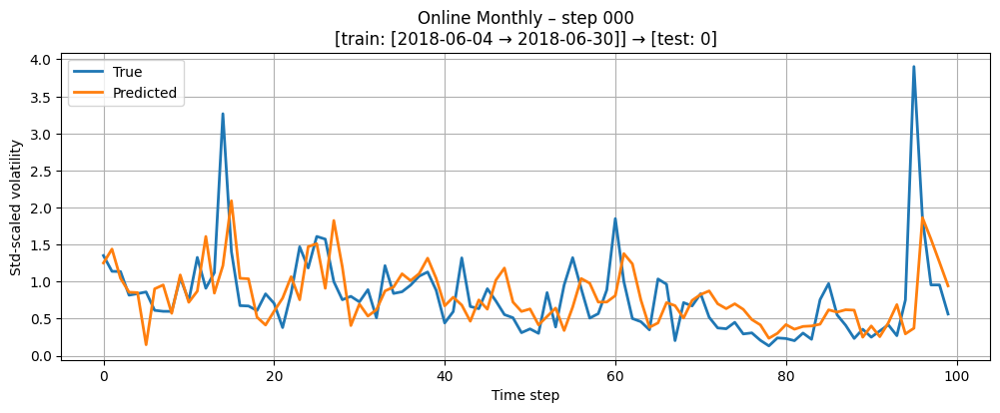

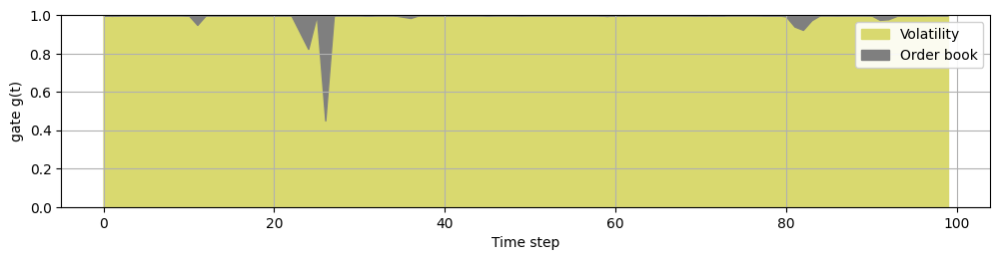

[online-monthly] Step 1: Train [2018-06-08 23:00:00 -> 2018-07-08 23:00:00], Test [2018-07-08 23:00:00 -> 2018-07-13 23:00:00]
Dataset created: 645 total points, 581 valid points after AR order 64
Target date range: 2018-06-11 17:00:00 to 2018-07-08 23:00:00
Dataset created: 117 total points, 117 valid points after AR order 64
Target date range: 2018-07-09 00:00:00 to 2018-07-13 23:00:00
[online-monthly] step 001  RMSE=0.4691  MAE=0.3117
Model saved to saved_models/online_monthly/normal/model.pt
Saving 117 predictions from 2018-07-09 00:00:00 to 2018-07-13 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_1.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


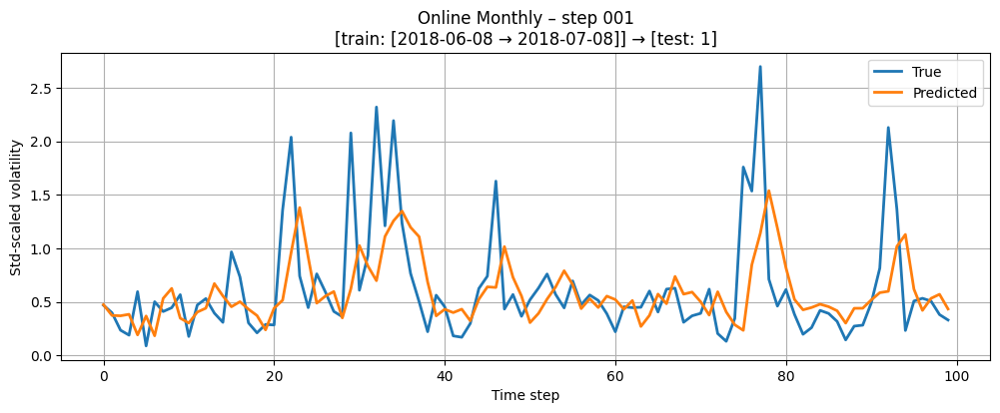

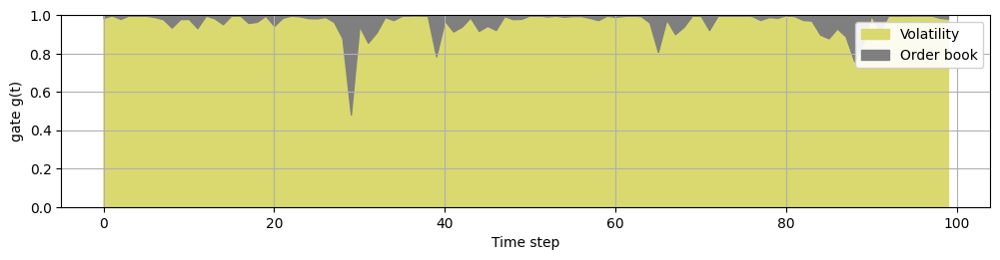

[online-monthly] Step 2: Train [2018-06-13 23:00:00 -> 2018-07-13 23:00:00], Test [2018-07-13 23:00:00 -> 2018-07-18 23:00:00]
Dataset created: 644 total points, 580 valid points after AR order 64
Target date range: 2018-06-16 15:00:00 to 2018-07-13 23:00:00
Dataset created: 103 total points, 103 valid points after AR order 64
Target date range: 2018-07-14 00:00:00 to 2018-07-18 23:00:00
[online-monthly] step 002  RMSE=3.1569  MAE=0.9023
Model saved to saved_models/online_monthly/normal/model.pt
Saving 103 predictions from 2018-07-14 00:00:00 to 2018-07-18 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_2.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


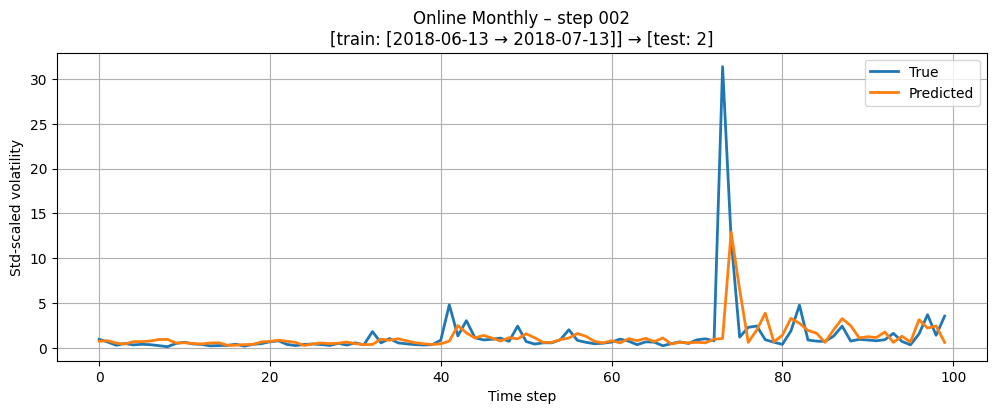

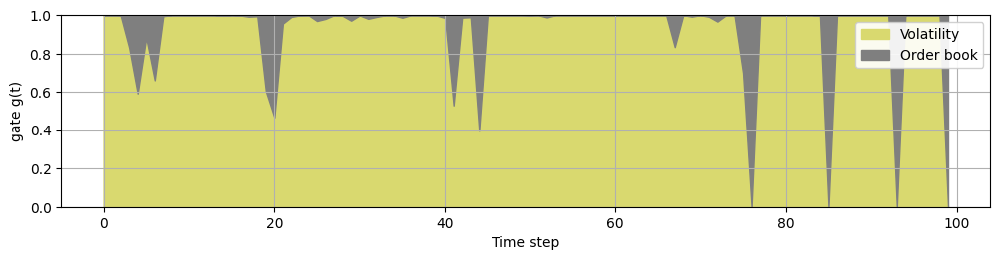

[online-monthly] Step 3: Train [2018-06-18 23:00:00 -> 2018-07-18 23:00:00], Test [2018-07-18 23:00:00 -> 2018-07-23 23:00:00]
Dataset created: 627 total points, 563 valid points after AR order 64
Target date range: 2018-06-21 15:00:00 to 2018-07-18 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-19 00:00:00 to 2018-07-23 23:00:00
[online-monthly] step 003  RMSE=0.5932  MAE=0.3470
Model saved to saved_models/online_monthly/normal/model.pt
Saving 119 predictions from 2018-07-19 00:00:00 to 2018-07-23 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_3.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


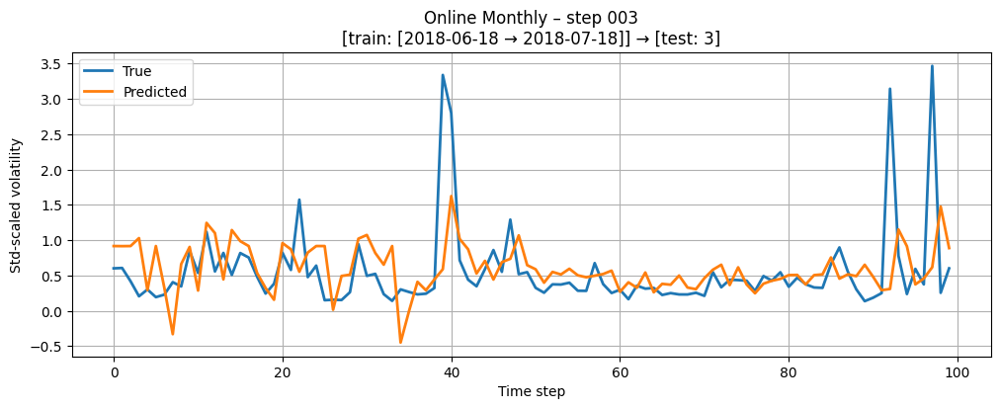

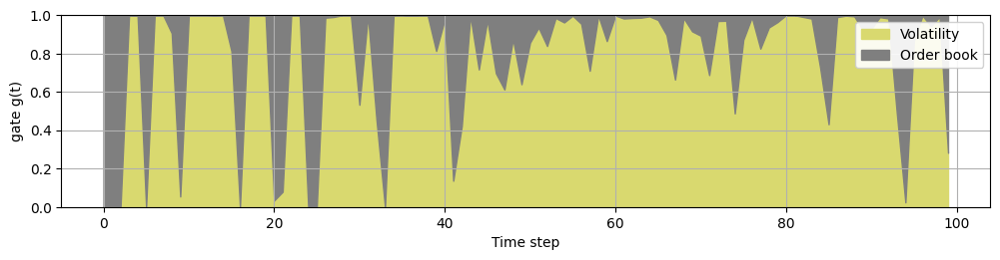

[online-monthly] Step 4: Train [2018-06-23 23:00:00 -> 2018-07-23 23:00:00], Test [2018-07-23 23:00:00 -> 2018-07-28 23:00:00]
Dataset created: 626 total points, 562 valid points after AR order 64
Target date range: 2018-06-26 15:00:00 to 2018-07-23 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-24 00:00:00 to 2018-07-28 23:00:00
[online-monthly] step 004  RMSE=0.4721  MAE=0.2923
Model saved to saved_models/online_monthly/normal/model.pt
Saving 119 predictions from 2018-07-24 00:00:00 to 2018-07-28 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_4.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


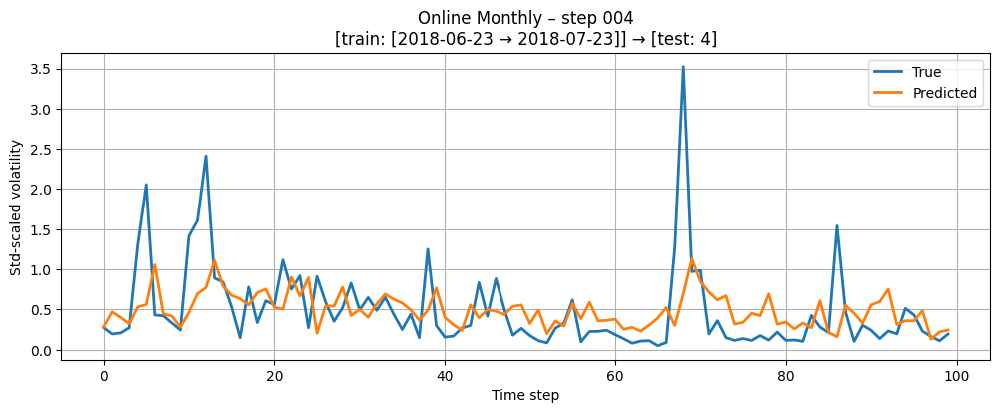

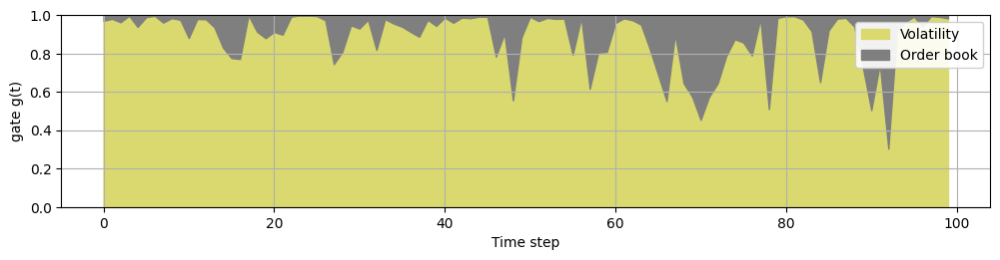

[online-monthly] Step 5: Train [2018-06-28 23:00:00 -> 2018-07-28 23:00:00], Test [2018-07-28 23:00:00 -> 2018-08-03 23:00:00]
Dataset created: 625 total points, 561 valid points after AR order 64
Target date range: 2018-07-04 16:00:00 to 2018-07-28 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-07-29 00:00:00 to 2018-08-03 23:00:00
[online-monthly] step 005  RMSE=0.3790  MAE=0.2113
Model saved to saved_models/online_monthly/normal/model.pt
Saving 72 predictions from 2018-07-29 00:00:00 to 2018-08-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_5.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


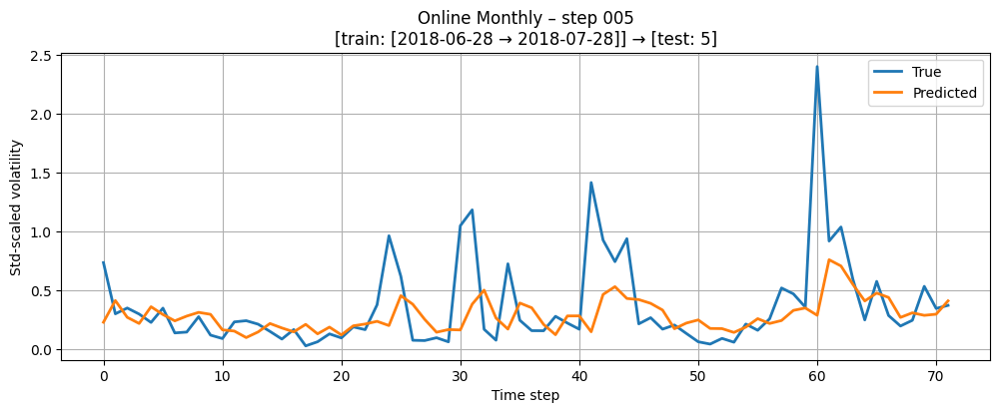

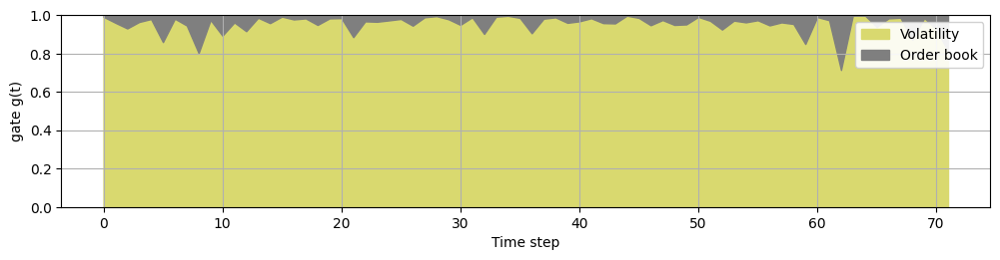

[online-monthly] Step 6: Train [2018-07-03 23:00:00 -> 2018-08-03 23:00:00], Test [2018-08-03 23:00:00 -> 2018-08-07 23:00:00]
Dataset created: 650 total points, 586 valid points after AR order 64
Target date range: 2018-07-06 16:00:00 to 2018-08-03 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-04 00:00:00 to 2018-08-07 23:00:00
[online-monthly] step 006  RMSE=0.5208  MAE=0.2518
Model saved to saved_models/online_monthly/normal/model.pt
Saving 96 predictions from 2018-08-04 00:00:00 to 2018-08-07 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_6.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


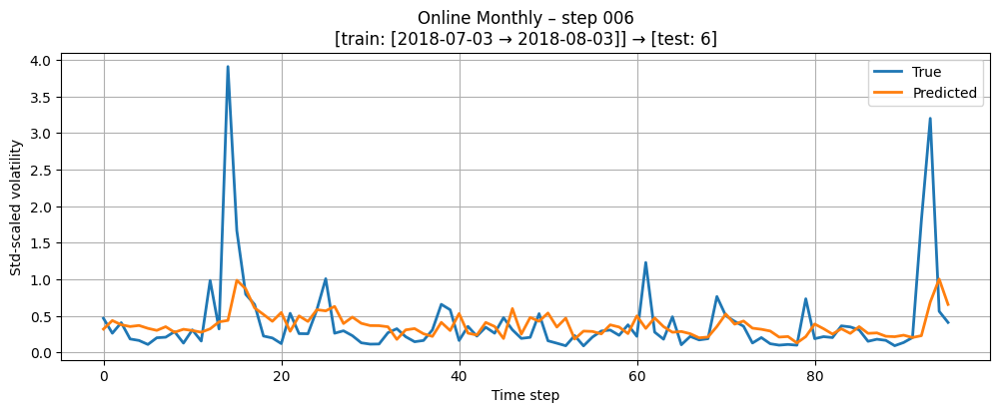

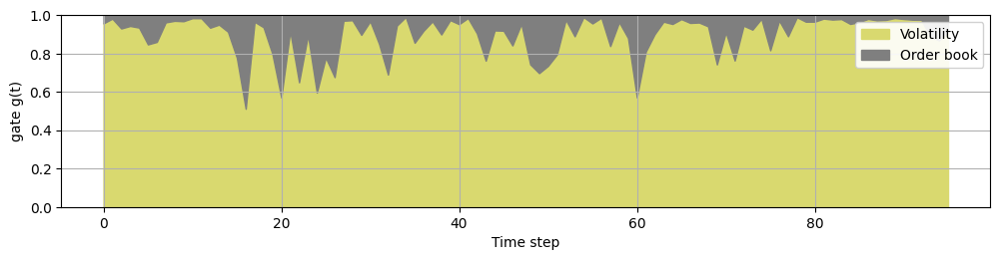

[online-monthly] Step 7: Train [2018-07-07 23:00:00 -> 2018-08-07 23:00:00], Test [2018-08-07 23:00:00 -> 2018-08-12 23:00:00]
Dataset created: 651 total points, 587 valid points after AR order 64
Target date range: 2018-07-10 16:00:00 to 2018-08-07 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-08 00:00:00 to 2018-08-12 23:00:00
[online-monthly] step 007  RMSE=1.3735  MAE=0.6456
Model saved to saved_models/online_monthly/normal/model.pt
Saving 120 predictions from 2018-08-08 00:00:00 to 2018-08-12 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_7.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


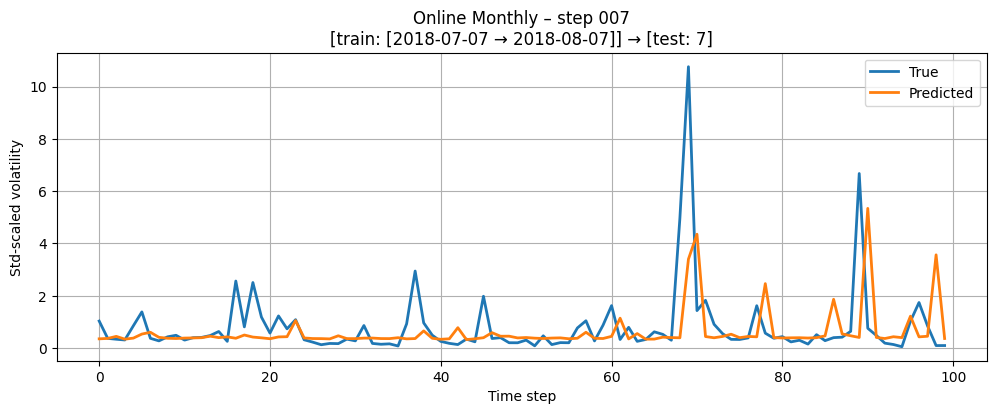

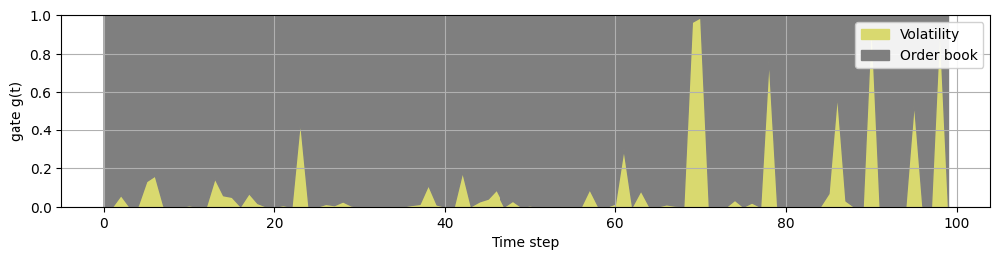

[online-monthly] Step 8: Train [2018-07-12 23:00:00 -> 2018-08-12 23:00:00], Test [2018-08-12 23:00:00 -> 2018-08-17 23:00:00]
Dataset created: 654 total points, 590 valid points after AR order 64
Target date range: 2018-07-15 15:00:00 to 2018-08-12 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-13 00:00:00 to 2018-08-17 23:00:00
[online-monthly] step 008  RMSE=0.4157  MAE=0.2987
Model saved to saved_models/online_monthly/normal/model.pt
Saving 119 predictions from 2018-08-13 00:00:00 to 2018-08-17 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_8.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


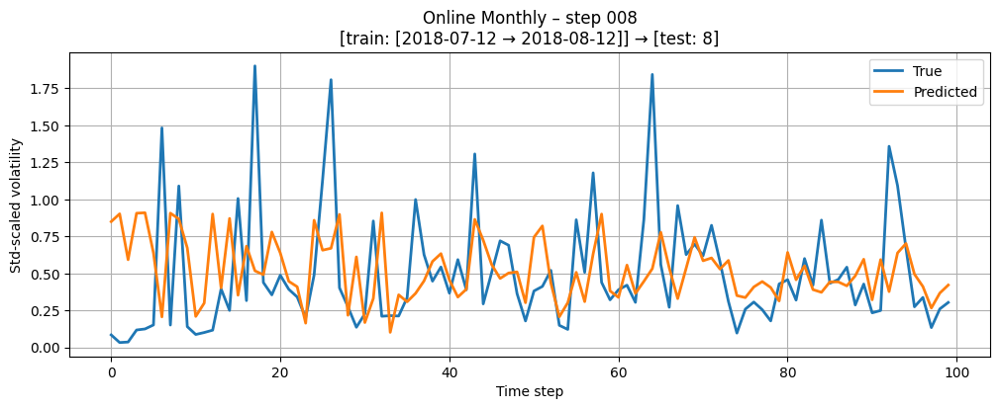

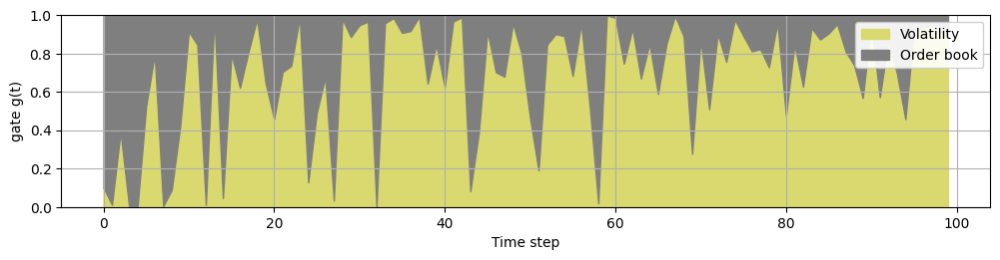

[online-monthly] Step 9: Train [2018-07-17 23:00:00 -> 2018-08-17 23:00:00], Test [2018-08-17 23:00:00 -> 2018-08-22 23:00:00]
Dataset created: 670 total points, 606 valid points after AR order 64
Target date range: 2018-07-20 16:00:00 to 2018-08-17 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-18 00:00:00 to 2018-08-22 23:00:00
[online-monthly] step 009  RMSE=2.1831  MAE=0.7569
Model saved to saved_models/online_monthly/normal/model.pt
Saving 120 predictions from 2018-08-18 00:00:00 to 2018-08-22 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_9.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


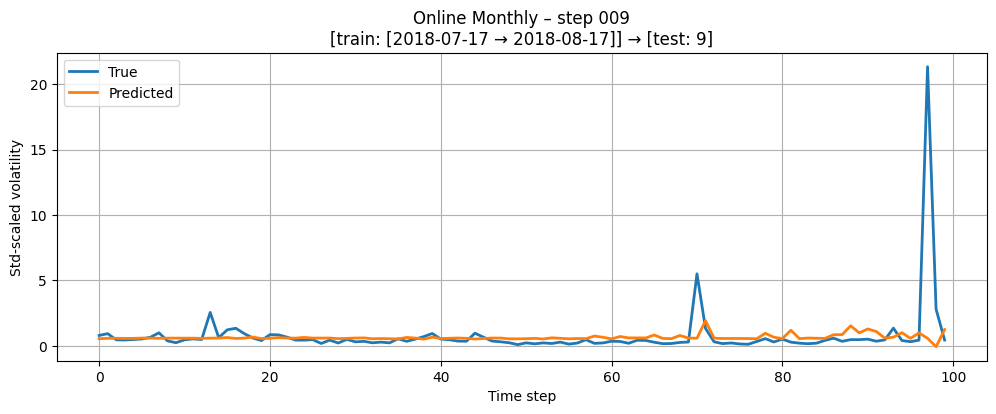

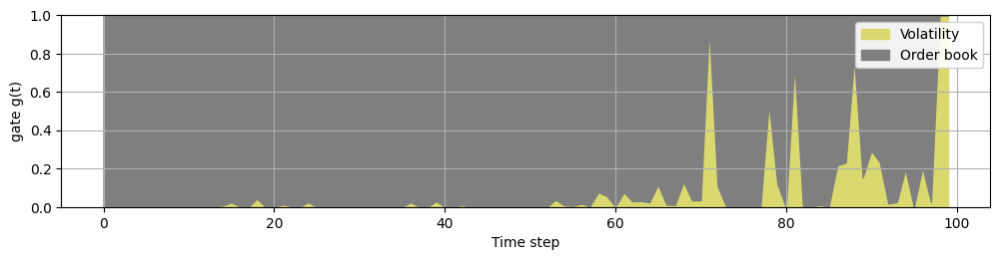

[online-monthly] Step 10: Train [2018-07-22 23:00:00 -> 2018-08-22 23:00:00], Test [2018-08-22 23:00:00 -> 2018-08-27 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-25 16:00:00 to 2018-08-22 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-23 00:00:00 to 2018-08-27 23:00:00
[online-monthly] step 010  RMSE=0.5298  MAE=0.3059
Model saved to saved_models/online_monthly/normal/model.pt
Saving 119 predictions from 2018-08-23 00:00:00 to 2018-08-27 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_10.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


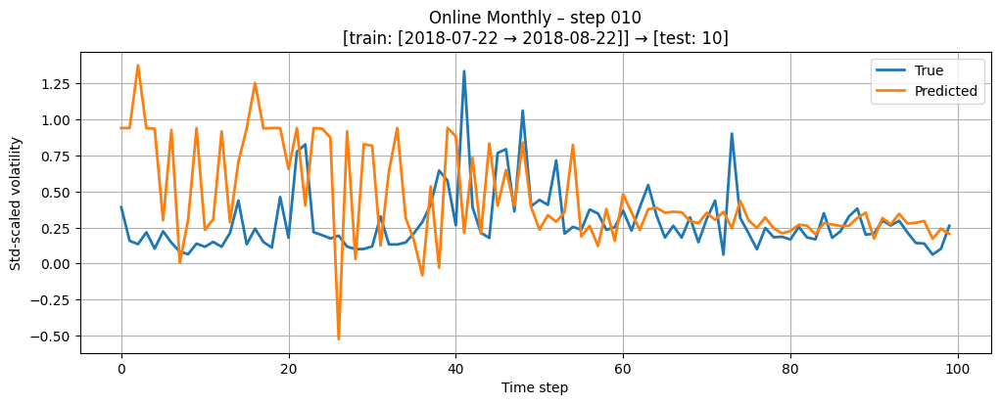

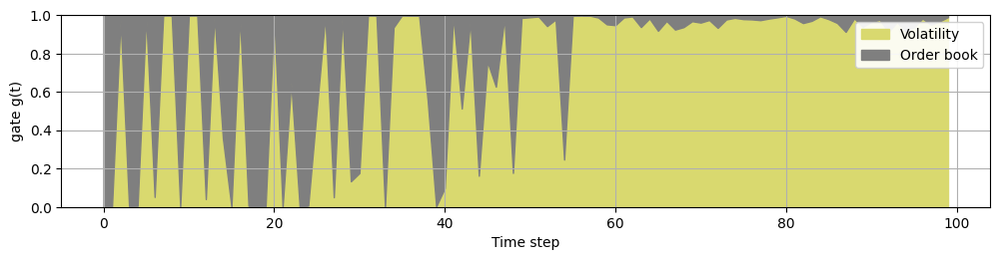

[online-monthly] Step 11: Train [2018-07-27 23:00:00 -> 2018-08-27 23:00:00], Test [2018-08-27 23:00:00 -> 2018-09-03 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-30 15:00:00 to 2018-08-27 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-28 00:00:00 to 2018-09-03 23:00:00
[online-monthly] step 011  RMSE=0.3467  MAE=0.1916
Model saved to saved_models/online_monthly/normal/model.pt
Saving 96 predictions from 2018-08-28 00:00:00 to 2018-09-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_11.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


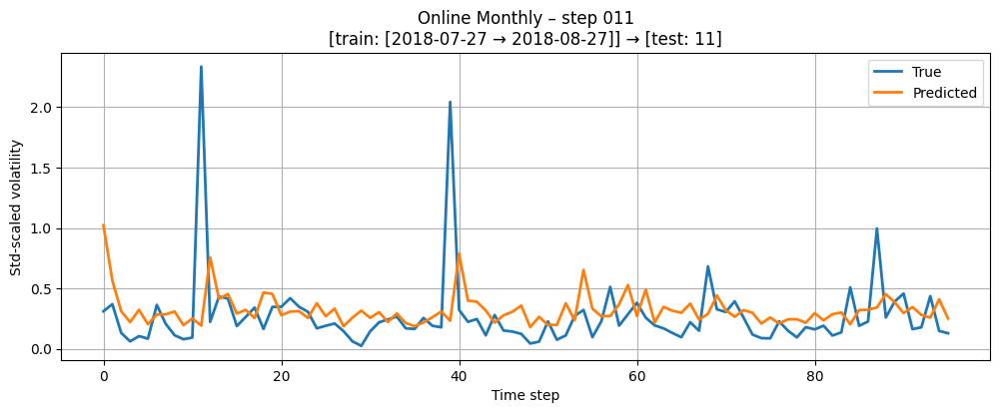

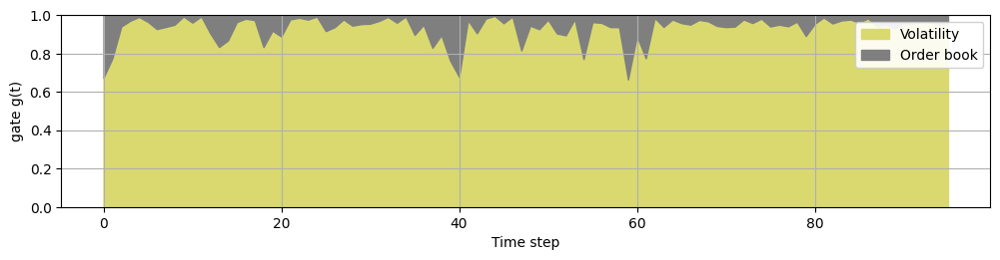

[online-monthly] Step 12: Train [2018-08-03 23:00:00 -> 2018-09-03 23:00:00], Test [2018-09-03 23:00:00 -> 2018-09-06 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-06 15:00:00 to 2018-09-03 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-09-04 00:00:00 to 2018-09-06 23:00:00
[online-monthly] step 012  RMSE=2.4652  MAE=0.7778
Model saved to saved_models/online_monthly/normal/model.pt
Saving 72 predictions from 2018-09-04 00:00:00 to 2018-09-06 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_12.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


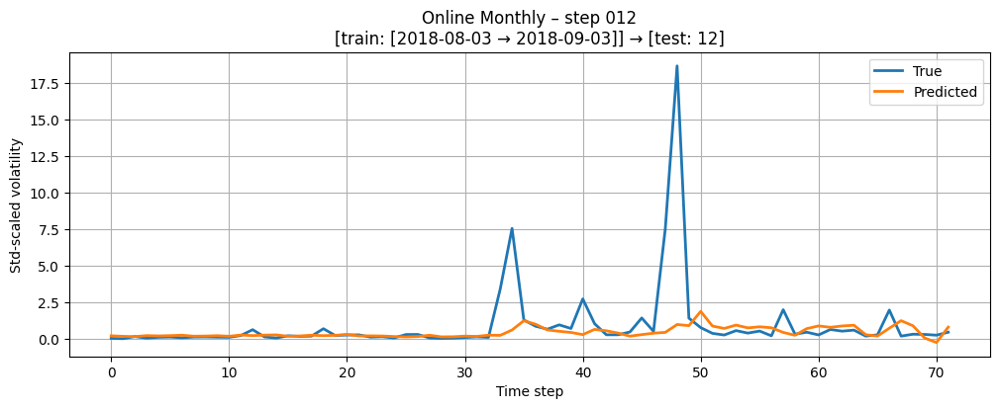

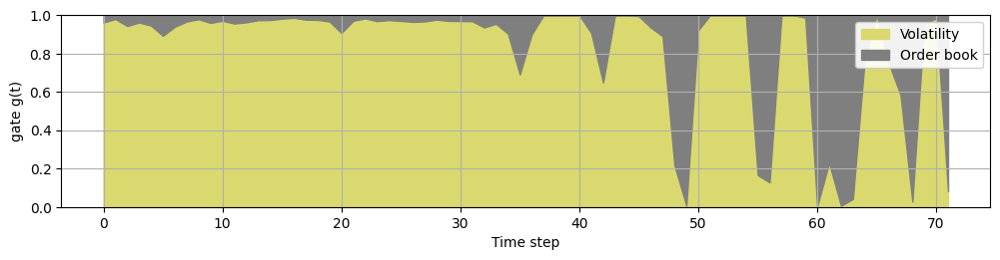

[online-monthly] Step 13: Train [2018-08-06 23:00:00 -> 2018-09-06 23:00:00], Test [2018-09-06 23:00:00 -> 2018-09-11 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-09 15:00:00 to 2018-09-06 23:00:00
Dataset created: 114 total points, 114 valid points after AR order 64
Target date range: 2018-09-07 00:00:00 to 2018-09-11 23:00:00
[online-monthly] step 013  RMSE=0.6034  MAE=0.3159
Model saved to saved_models/online_monthly/normal/model.pt
Saving 114 predictions from 2018-09-07 00:00:00 to 2018-09-11 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_13.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


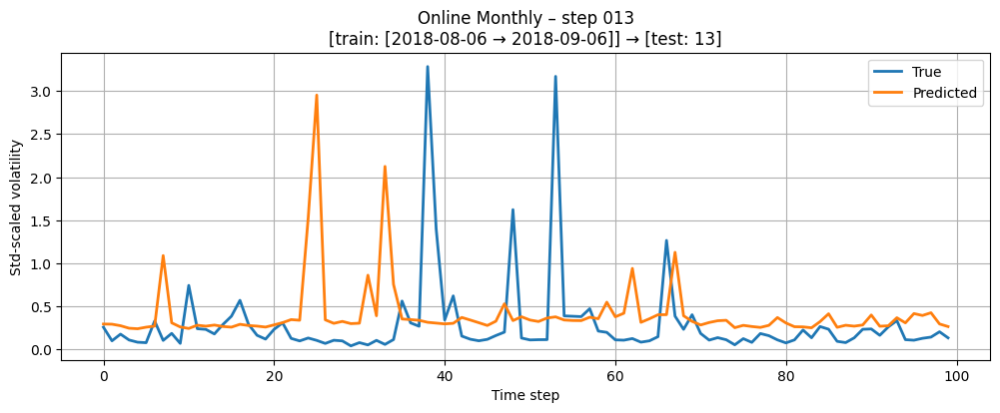

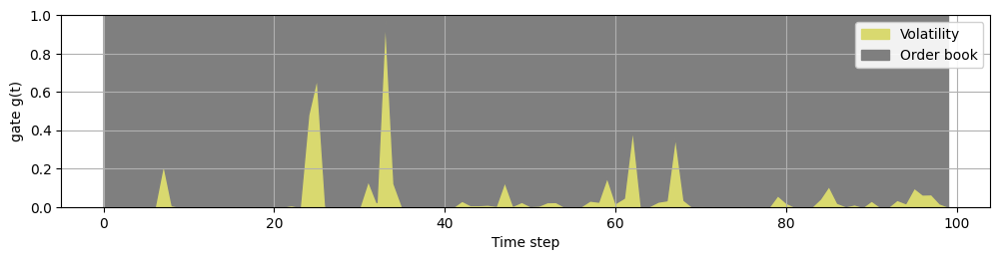

[online-monthly] Step 14: Train [2018-08-11 23:00:00 -> 2018-09-11 23:00:00], Test [2018-09-11 23:00:00 -> 2018-09-16 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-14 15:00:00 to 2018-09-11 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-09-12 00:00:00 to 2018-09-16 23:00:00
[online-monthly] step 014  RMSE=0.1831  MAE=0.0947
Model saved to saved_models/online_monthly/normal/model.pt
Saving 119 predictions from 2018-09-12 00:00:00 to 2018-09-16 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_14.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


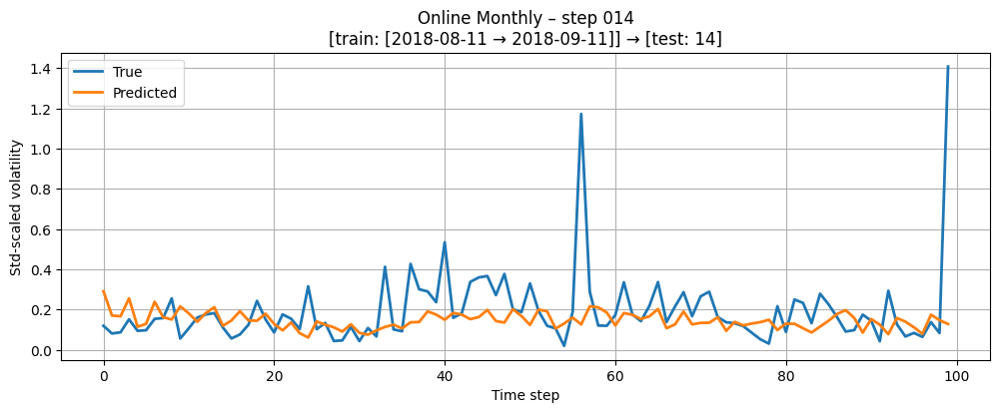

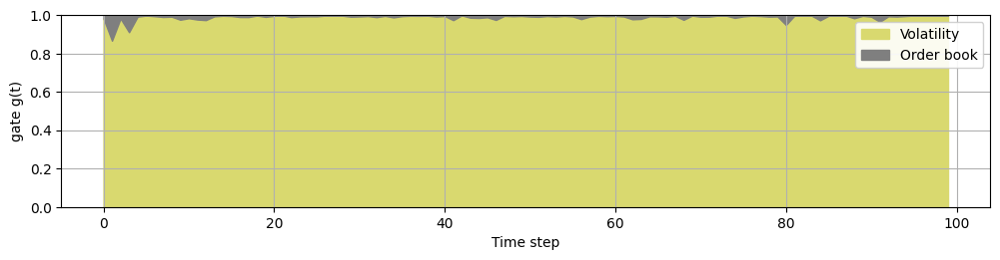

[online-monthly] Step 15: Train [2018-08-16 23:00:00 -> 2018-09-16 23:00:00], Test [2018-09-16 23:00:00 -> 2018-09-21 23:00:00]
Dataset created: 664 total points, 600 valid points after AR order 64
Target date range: 2018-08-19 16:00:00 to 2018-09-16 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-17 00:00:00 to 2018-09-21 23:00:00
[online-monthly] step 015  RMSE=0.5469  MAE=0.2473
Model saved to saved_models/online_monthly/normal/model.pt
Saving 120 predictions from 2018-09-17 00:00:00 to 2018-09-21 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_15.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


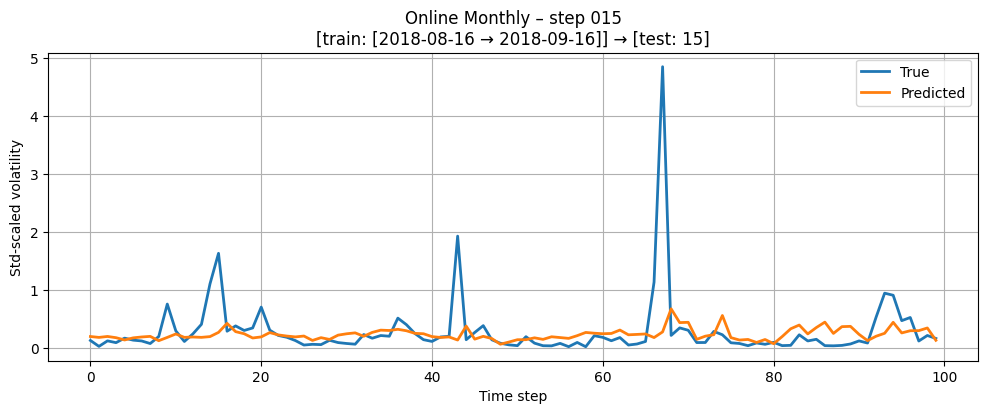

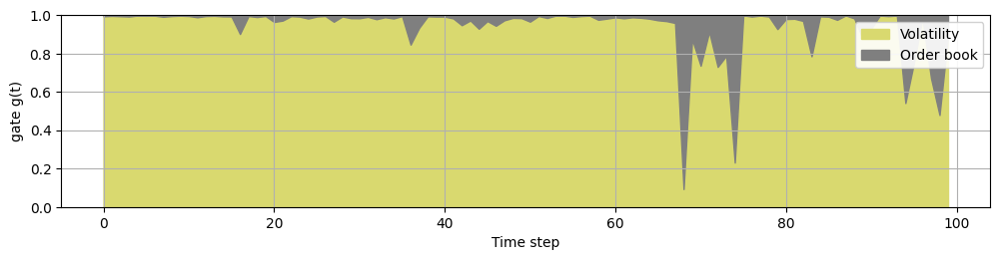

[online-monthly] Step 16: Train [2018-08-21 23:00:00 -> 2018-09-21 23:00:00], Test [2018-09-21 23:00:00 -> 2018-09-26 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-24 15:00:00 to 2018-09-21 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-22 00:00:00 to 2018-09-26 23:00:00
[online-monthly] step 016  RMSE=0.1998  MAE=0.1469
Model saved to saved_models/online_monthly/normal/model.pt
Saving 120 predictions from 2018-09-22 00:00:00 to 2018-09-26 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_16.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


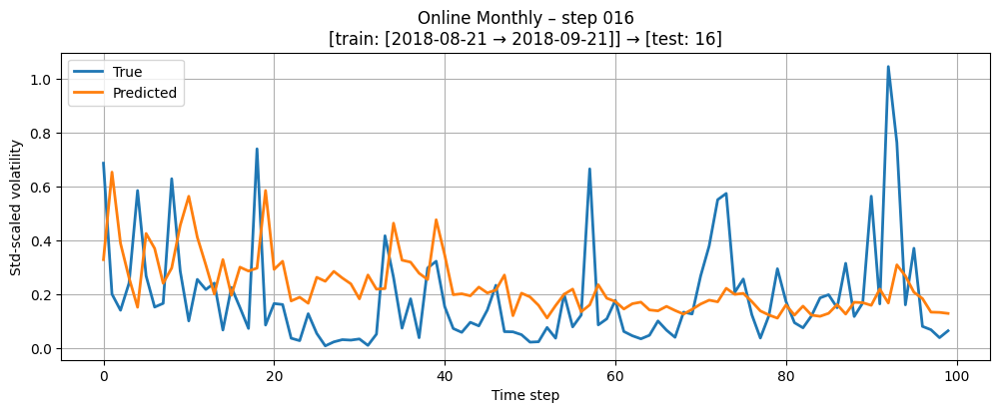

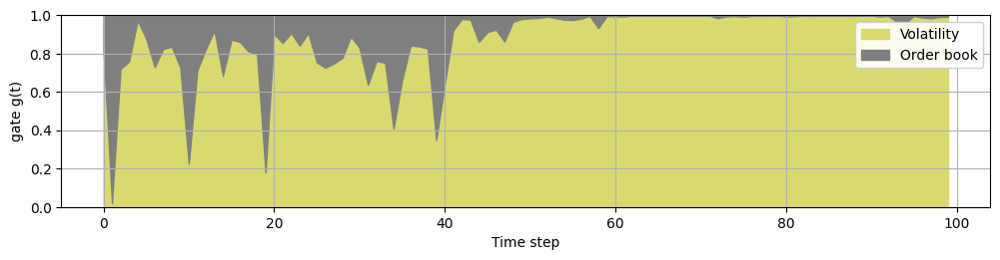

[online-monthly] Step 17: Train [2018-08-26 23:00:00 -> 2018-09-26 23:00:00], Test [2018-09-26 23:00:00 -> 2018-09-30 21:00:00]
Dataset created: 666 total points, 602 valid points after AR order 64
Target date range: 2018-08-29 15:00:00 to 2018-09-26 23:00:00
Dataset created: 93 total points, 93 valid points after AR order 64
Target date range: 2018-09-27 00:00:00 to 2018-09-30 21:00:00
[online-monthly] step 017  RMSE=0.2697  MAE=0.1597
Model saved to saved_models/online_monthly/normal/model.pt
Saving 93 predictions from 2018-09-27 00:00:00 to 2018-09-30 21:00:00
Residuals with dates saved to saved_residuals/online_monthly/normal/residuals_step_17.csv
Predictions saved to saved_predictions/online_monthly/normal/predictions.npy


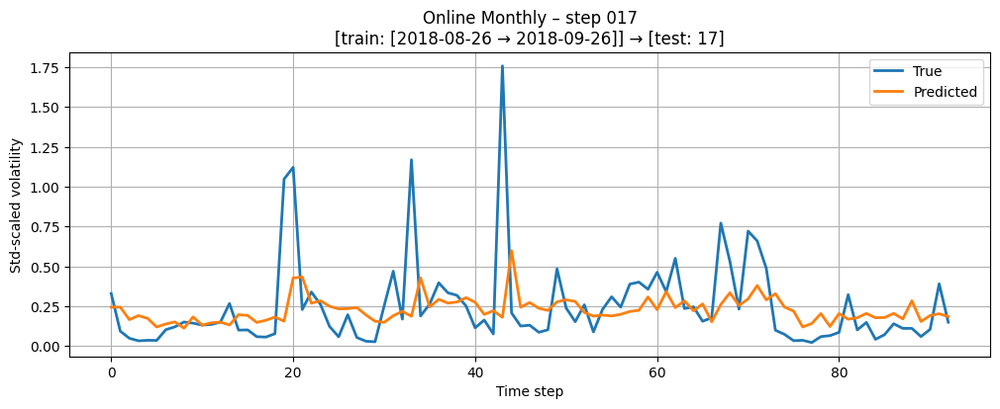

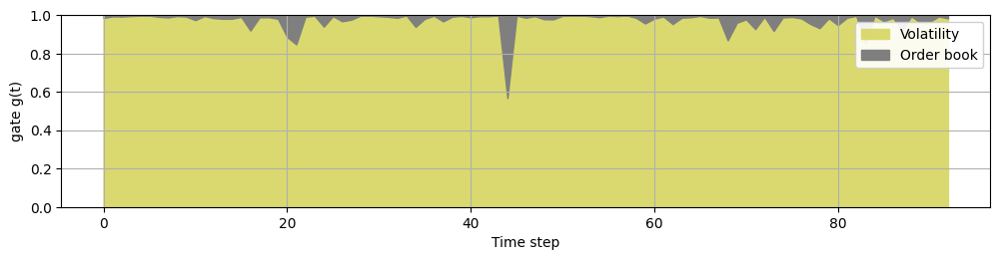

[online-monthly] finished 18 steps.

=== Training model: HINGE ===

[online-monthly] Step 0: Train [2018-06-04 23:00:00 -> 2018-06-30 22:00:00], Test [2018-06-30 22:00:00 -> 2018-07-08 23:00:00]
Dataset created: 621 total points, 621 valid points after AR order 64
Target date range: 2018-06-04 23:00:00 to 2018-06-30 22:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-07-03 23:00:00 to 2018-07-08 23:00:00
[online-monthly] step 000  RMSE=0.4977  MAE=0.3246
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 120 predictions from 2018-07-03 23:00:00 to 2018-07-08 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_0.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


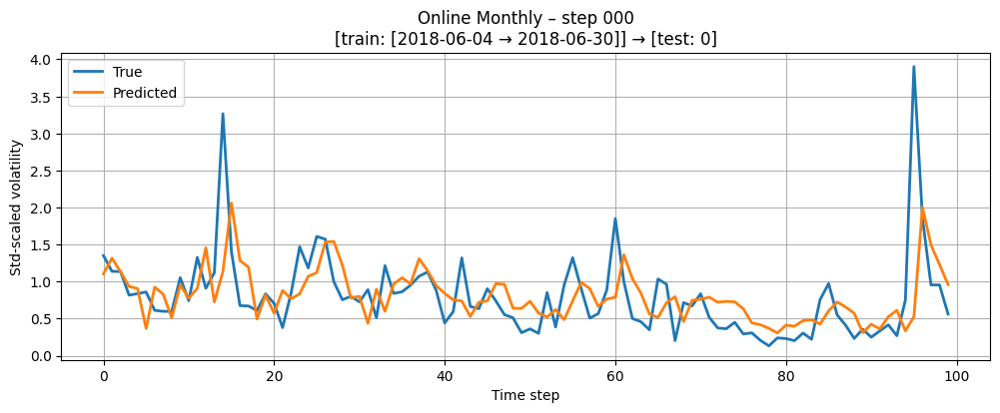

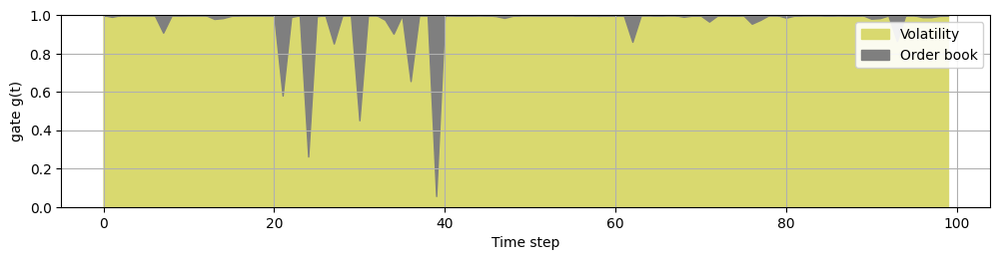

[online-monthly] Step 1: Train [2018-06-08 23:00:00 -> 2018-07-08 23:00:00], Test [2018-07-08 23:00:00 -> 2018-07-13 23:00:00]
Dataset created: 645 total points, 581 valid points after AR order 64
Target date range: 2018-06-11 17:00:00 to 2018-07-08 23:00:00
Dataset created: 117 total points, 117 valid points after AR order 64
Target date range: 2018-07-09 00:00:00 to 2018-07-13 23:00:00
[online-monthly] step 001  RMSE=0.4723  MAE=0.3207
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 117 predictions from 2018-07-09 00:00:00 to 2018-07-13 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_1.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


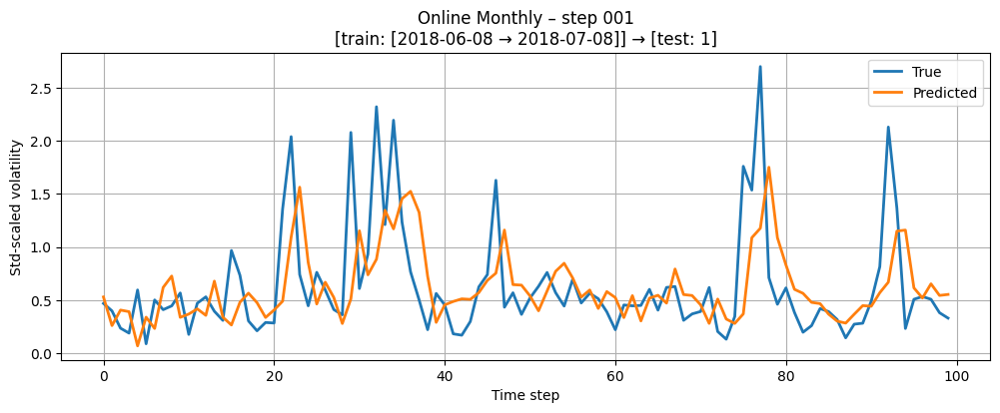

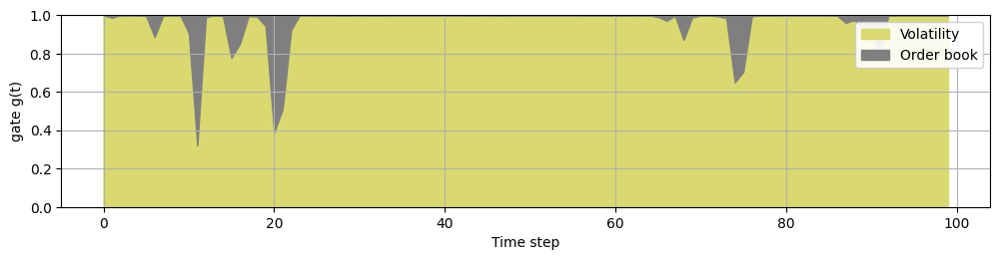

[online-monthly] Step 2: Train [2018-06-13 23:00:00 -> 2018-07-13 23:00:00], Test [2018-07-13 23:00:00 -> 2018-07-18 23:00:00]
Dataset created: 644 total points, 580 valid points after AR order 64
Target date range: 2018-06-16 15:00:00 to 2018-07-13 23:00:00
Dataset created: 103 total points, 103 valid points after AR order 64
Target date range: 2018-07-14 00:00:00 to 2018-07-18 23:00:00
[online-monthly] step 002  RMSE=3.1970  MAE=0.9315
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 103 predictions from 2018-07-14 00:00:00 to 2018-07-18 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_2.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


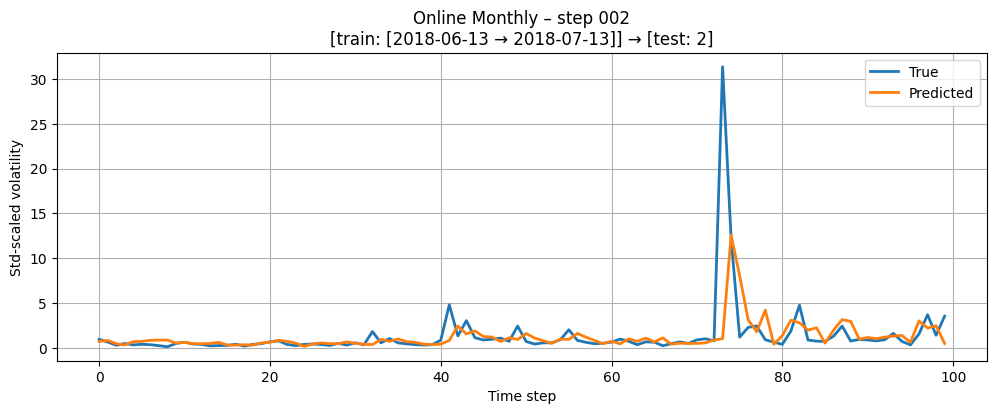

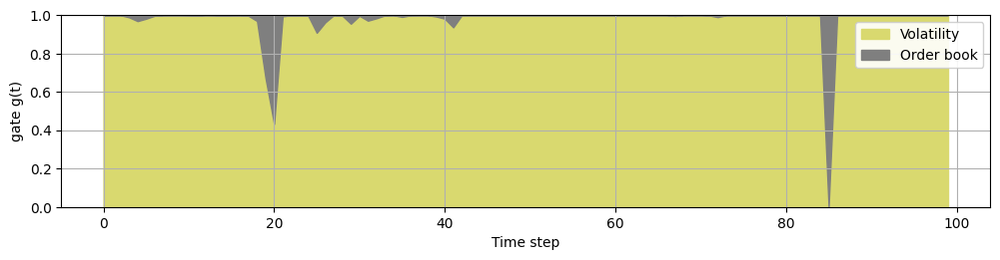

[online-monthly] Step 3: Train [2018-06-18 23:00:00 -> 2018-07-18 23:00:00], Test [2018-07-18 23:00:00 -> 2018-07-23 23:00:00]
Dataset created: 627 total points, 563 valid points after AR order 64
Target date range: 2018-06-21 15:00:00 to 2018-07-18 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-19 00:00:00 to 2018-07-23 23:00:00
[online-monthly] step 003  RMSE=0.6195  MAE=0.3593
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 119 predictions from 2018-07-19 00:00:00 to 2018-07-23 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_3.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


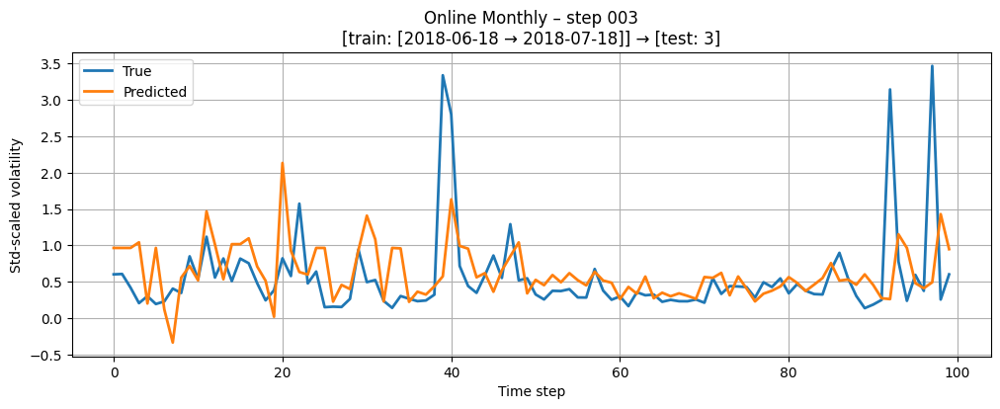

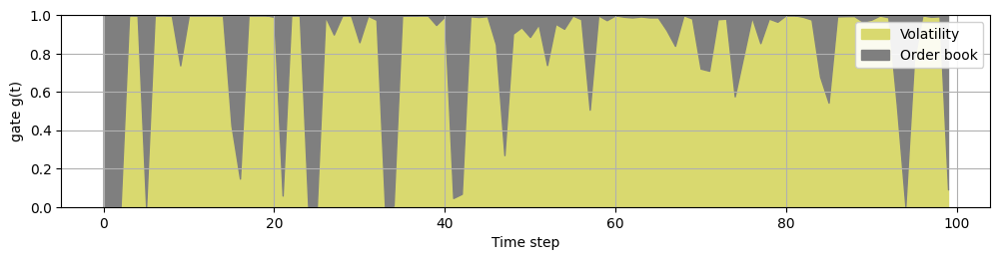

[online-monthly] Step 4: Train [2018-06-23 23:00:00 -> 2018-07-23 23:00:00], Test [2018-07-23 23:00:00 -> 2018-07-28 23:00:00]
Dataset created: 626 total points, 562 valid points after AR order 64
Target date range: 2018-06-26 15:00:00 to 2018-07-23 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-24 00:00:00 to 2018-07-28 23:00:00
[online-monthly] step 004  RMSE=0.4758  MAE=0.2872
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 119 predictions from 2018-07-24 00:00:00 to 2018-07-28 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_4.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


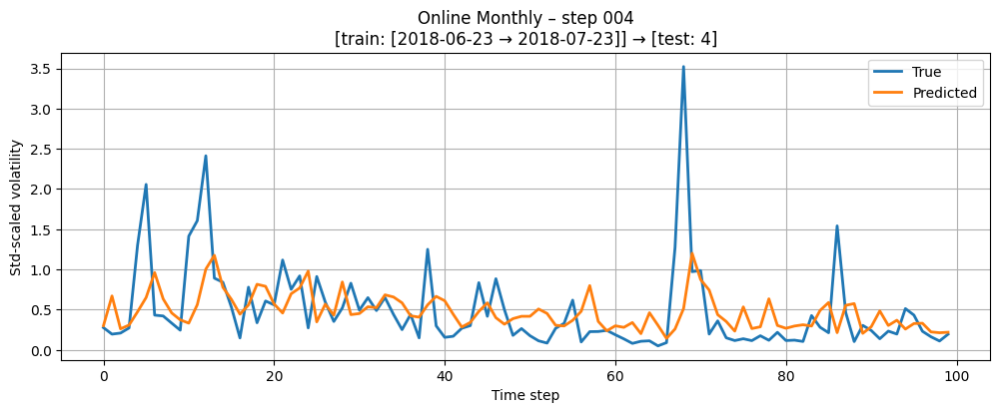

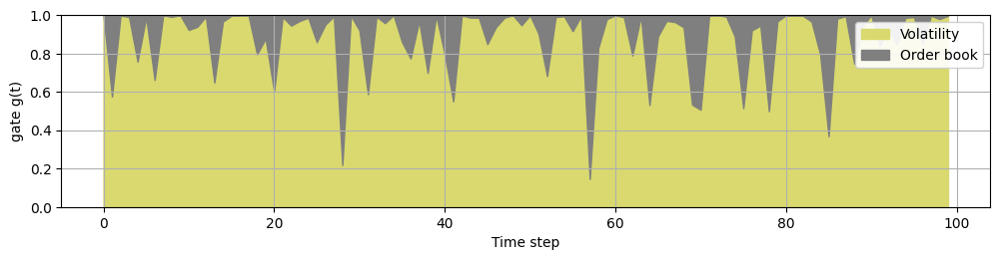

[online-monthly] Step 5: Train [2018-06-28 23:00:00 -> 2018-07-28 23:00:00], Test [2018-07-28 23:00:00 -> 2018-08-03 23:00:00]
Dataset created: 625 total points, 561 valid points after AR order 64
Target date range: 2018-07-04 16:00:00 to 2018-07-28 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-07-29 00:00:00 to 2018-08-03 23:00:00
[online-monthly] step 005  RMSE=0.3903  MAE=0.2154
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 72 predictions from 2018-07-29 00:00:00 to 2018-08-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_5.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


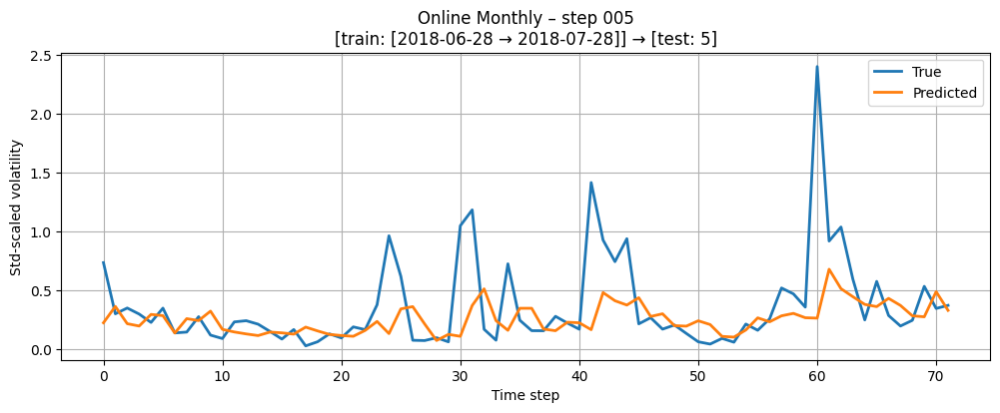

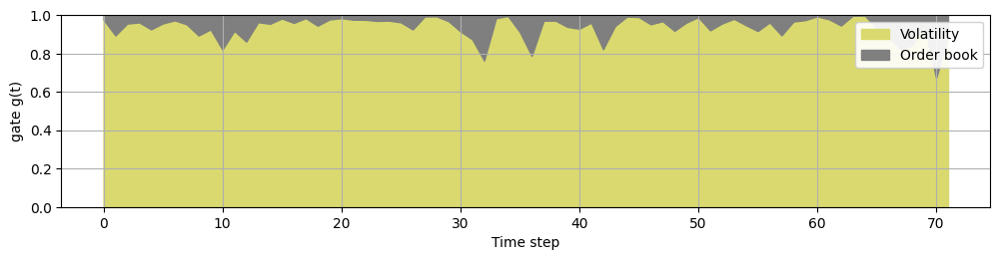

[online-monthly] Step 6: Train [2018-07-03 23:00:00 -> 2018-08-03 23:00:00], Test [2018-08-03 23:00:00 -> 2018-08-07 23:00:00]
Dataset created: 650 total points, 586 valid points after AR order 64
Target date range: 2018-07-06 16:00:00 to 2018-08-03 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-04 00:00:00 to 2018-08-07 23:00:00
[online-monthly] step 006  RMSE=0.5299  MAE=0.3340
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 96 predictions from 2018-08-04 00:00:00 to 2018-08-07 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_6.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


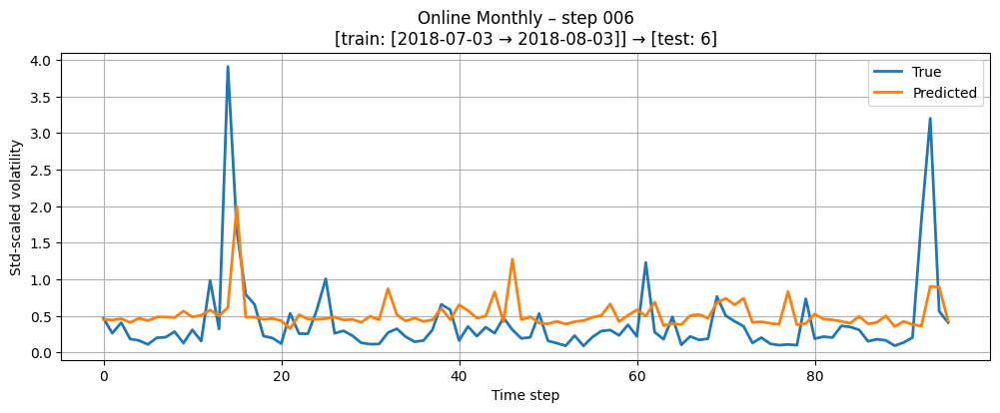

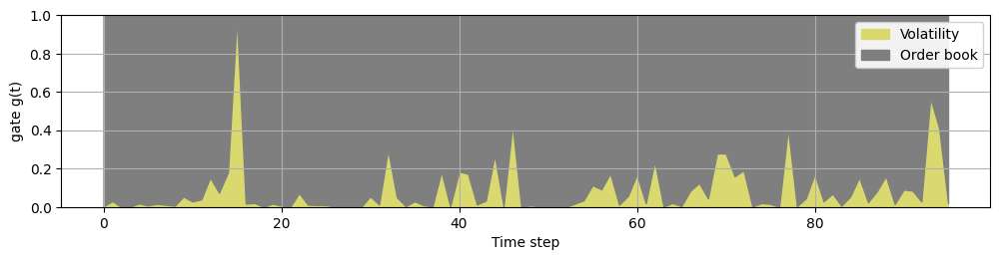

[online-monthly] Step 7: Train [2018-07-07 23:00:00 -> 2018-08-07 23:00:00], Test [2018-08-07 23:00:00 -> 2018-08-12 23:00:00]
Dataset created: 651 total points, 587 valid points after AR order 64
Target date range: 2018-07-10 16:00:00 to 2018-08-07 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-08 00:00:00 to 2018-08-12 23:00:00
[online-monthly] step 007  RMSE=1.3318  MAE=0.5965
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 120 predictions from 2018-08-08 00:00:00 to 2018-08-12 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_7.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


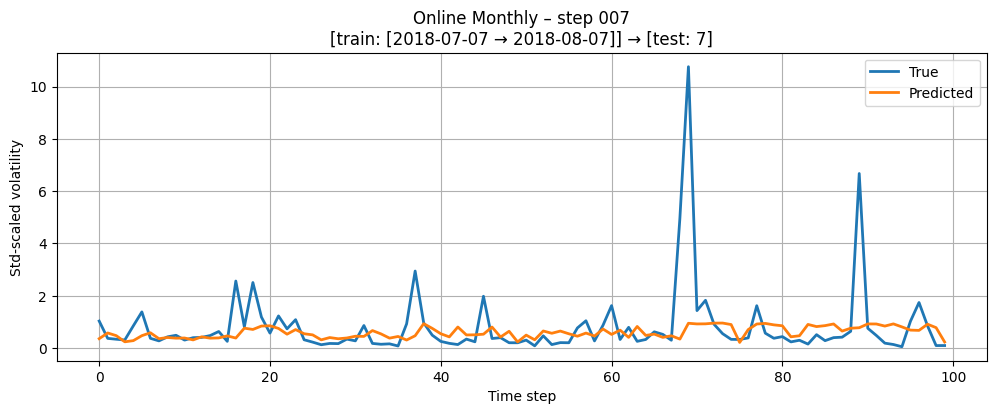

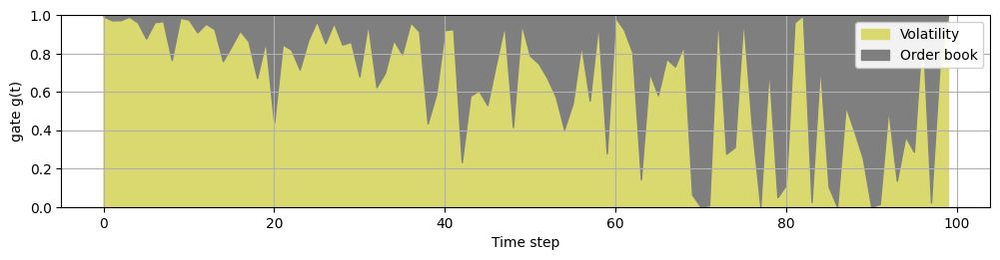

[online-monthly] Step 8: Train [2018-07-12 23:00:00 -> 2018-08-12 23:00:00], Test [2018-08-12 23:00:00 -> 2018-08-17 23:00:00]
Dataset created: 654 total points, 590 valid points after AR order 64
Target date range: 2018-07-15 15:00:00 to 2018-08-12 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-13 00:00:00 to 2018-08-17 23:00:00
[online-monthly] step 008  RMSE=0.8551  MAE=0.4331
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 119 predictions from 2018-08-13 00:00:00 to 2018-08-17 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_8.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


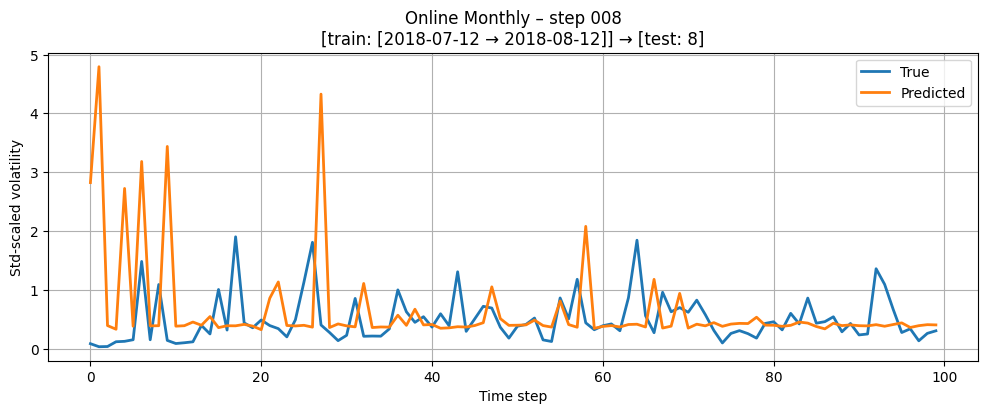

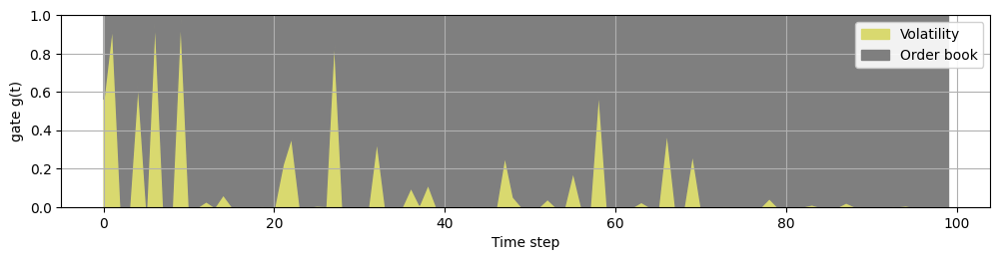

[online-monthly] Step 9: Train [2018-07-17 23:00:00 -> 2018-08-17 23:00:00], Test [2018-08-17 23:00:00 -> 2018-08-22 23:00:00]
Dataset created: 670 total points, 606 valid points after AR order 64
Target date range: 2018-07-20 16:00:00 to 2018-08-17 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-18 00:00:00 to 2018-08-22 23:00:00
[online-monthly] step 009  RMSE=2.1719  MAE=0.7222
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 120 predictions from 2018-08-18 00:00:00 to 2018-08-22 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_9.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


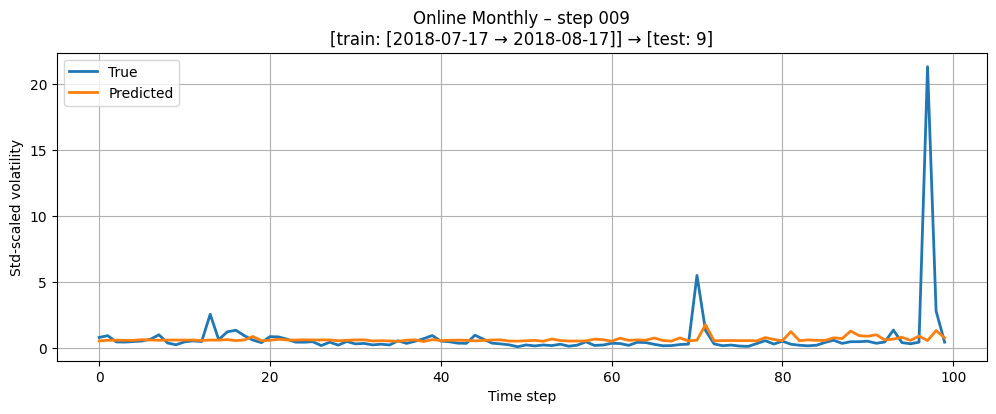

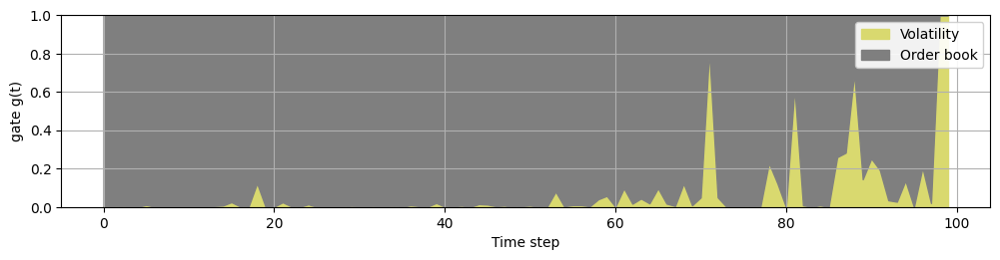

[online-monthly] Step 10: Train [2018-07-22 23:00:00 -> 2018-08-22 23:00:00], Test [2018-08-22 23:00:00 -> 2018-08-27 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-25 16:00:00 to 2018-08-22 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-23 00:00:00 to 2018-08-27 23:00:00
[online-monthly] step 010  RMSE=0.5218  MAE=0.3024
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 119 predictions from 2018-08-23 00:00:00 to 2018-08-27 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_10.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


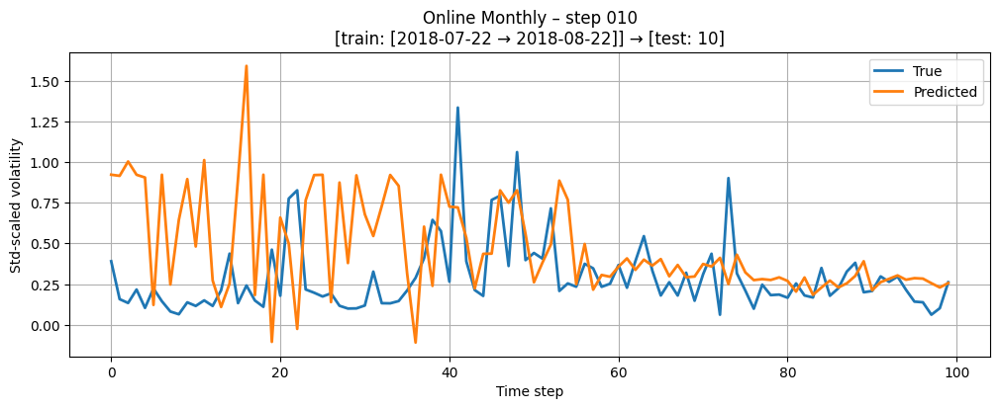

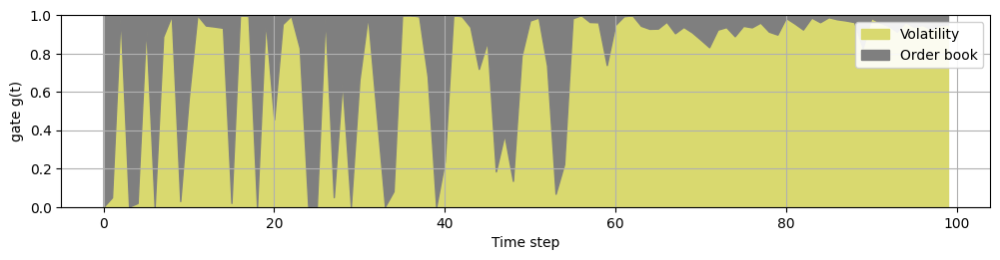

[online-monthly] Step 11: Train [2018-07-27 23:00:00 -> 2018-08-27 23:00:00], Test [2018-08-27 23:00:00 -> 2018-09-03 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-30 15:00:00 to 2018-08-27 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-28 00:00:00 to 2018-09-03 23:00:00
[online-monthly] step 011  RMSE=0.4115  MAE=0.3059
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 96 predictions from 2018-08-28 00:00:00 to 2018-09-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_11.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


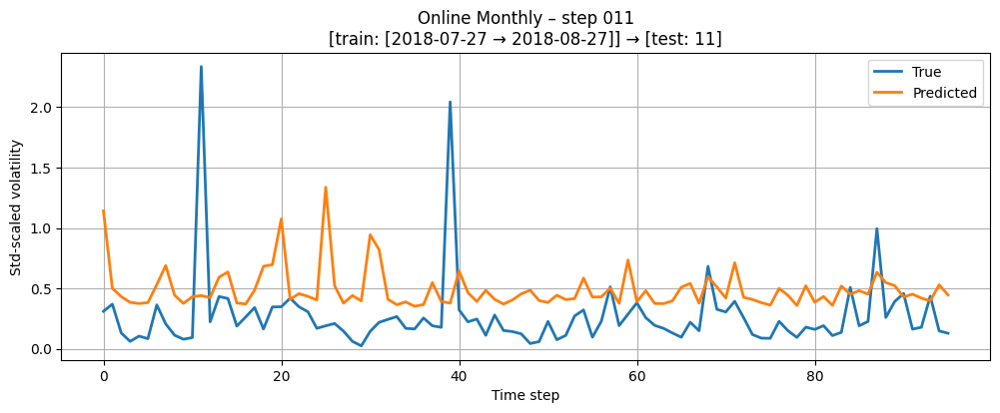

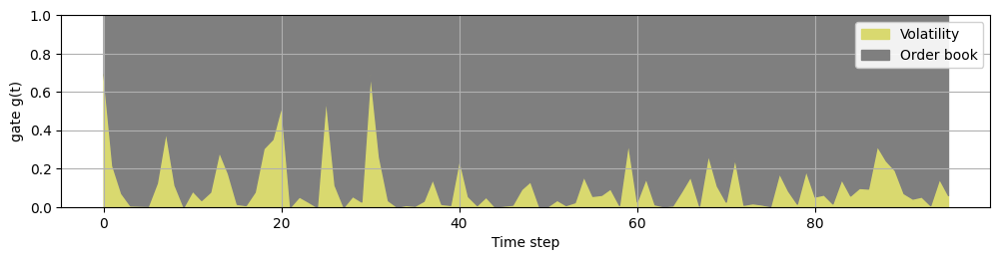

[online-monthly] Step 12: Train [2018-08-03 23:00:00 -> 2018-09-03 23:00:00], Test [2018-09-03 23:00:00 -> 2018-09-06 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-06 15:00:00 to 2018-09-03 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-09-04 00:00:00 to 2018-09-06 23:00:00
[online-monthly] step 012  RMSE=2.4907  MAE=0.7850
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 72 predictions from 2018-09-04 00:00:00 to 2018-09-06 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_12.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


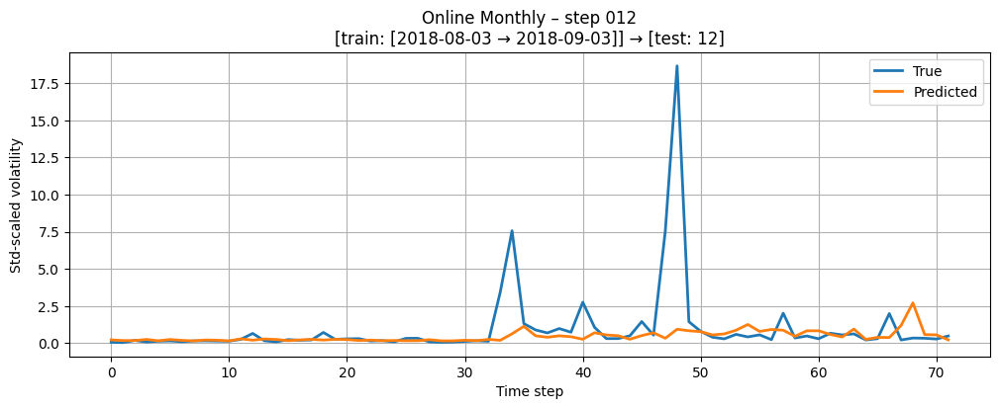

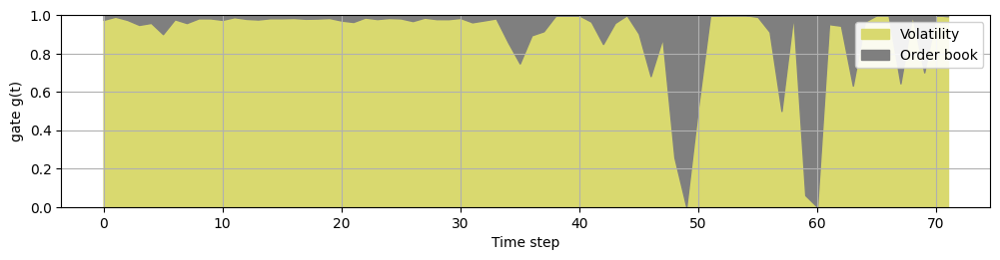

[online-monthly] Step 13: Train [2018-08-06 23:00:00 -> 2018-09-06 23:00:00], Test [2018-09-06 23:00:00 -> 2018-09-11 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-09 15:00:00 to 2018-09-06 23:00:00
Dataset created: 114 total points, 114 valid points after AR order 64
Target date range: 2018-09-07 00:00:00 to 2018-09-11 23:00:00
[online-monthly] step 013  RMSE=0.6022  MAE=0.3108
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 114 predictions from 2018-09-07 00:00:00 to 2018-09-11 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_13.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


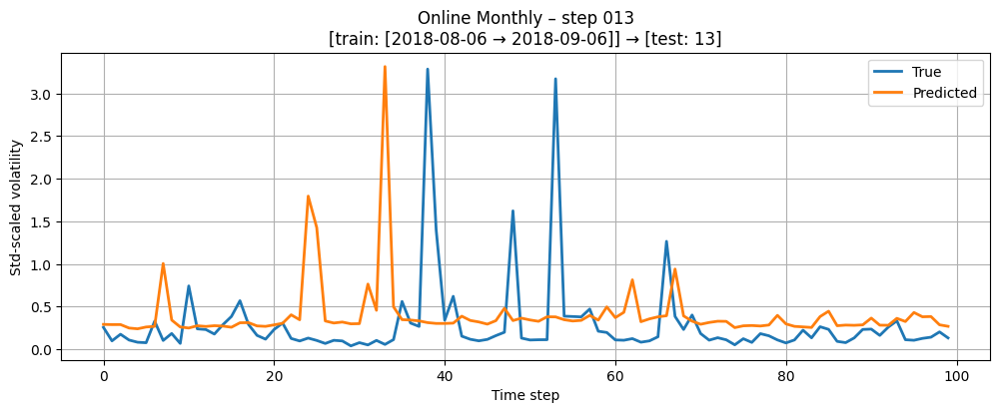

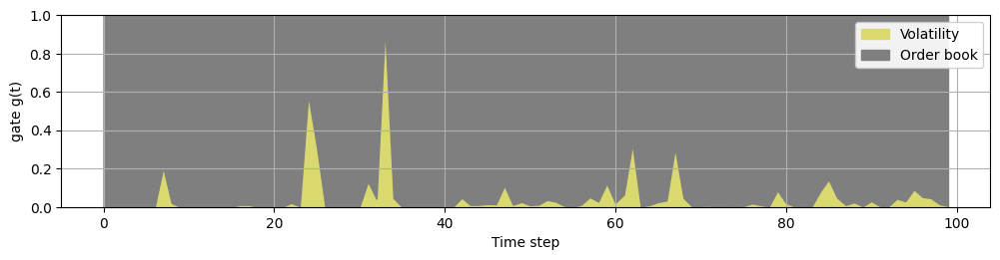

[online-monthly] Step 14: Train [2018-08-11 23:00:00 -> 2018-09-11 23:00:00], Test [2018-09-11 23:00:00 -> 2018-09-16 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-14 15:00:00 to 2018-09-11 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-09-12 00:00:00 to 2018-09-16 23:00:00
[online-monthly] step 014  RMSE=0.2198  MAE=0.1774
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 119 predictions from 2018-09-12 00:00:00 to 2018-09-16 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_14.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


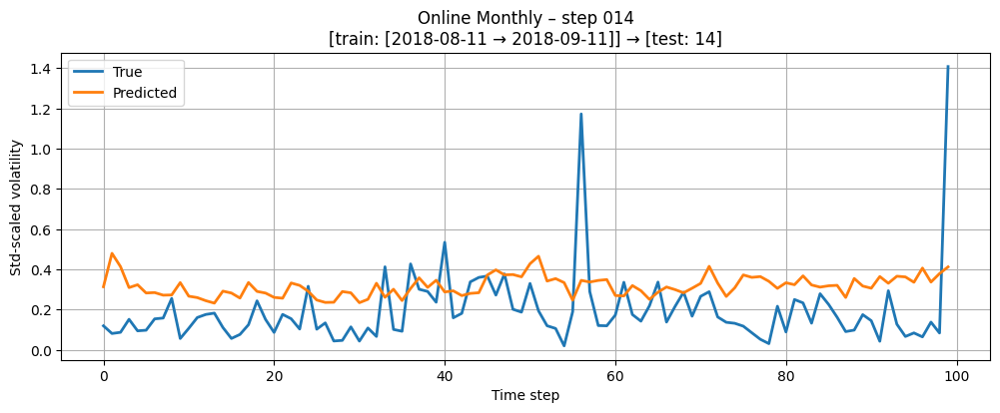

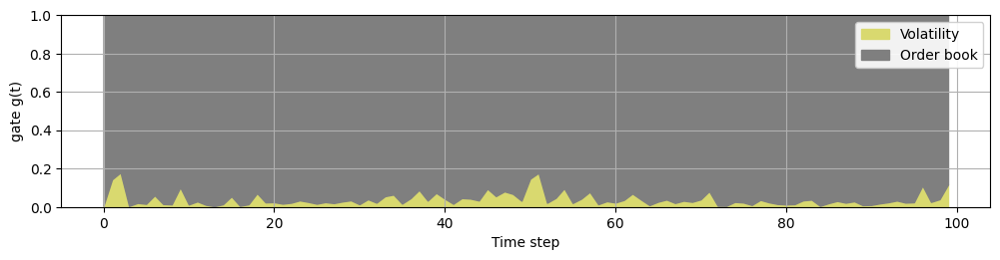

[online-monthly] Step 15: Train [2018-08-16 23:00:00 -> 2018-09-16 23:00:00], Test [2018-09-16 23:00:00 -> 2018-09-21 23:00:00]
Dataset created: 664 total points, 600 valid points after AR order 64
Target date range: 2018-08-19 16:00:00 to 2018-09-16 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-17 00:00:00 to 2018-09-21 23:00:00
[online-monthly] step 015  RMSE=0.5707  MAE=0.2788
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 120 predictions from 2018-09-17 00:00:00 to 2018-09-21 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_15.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


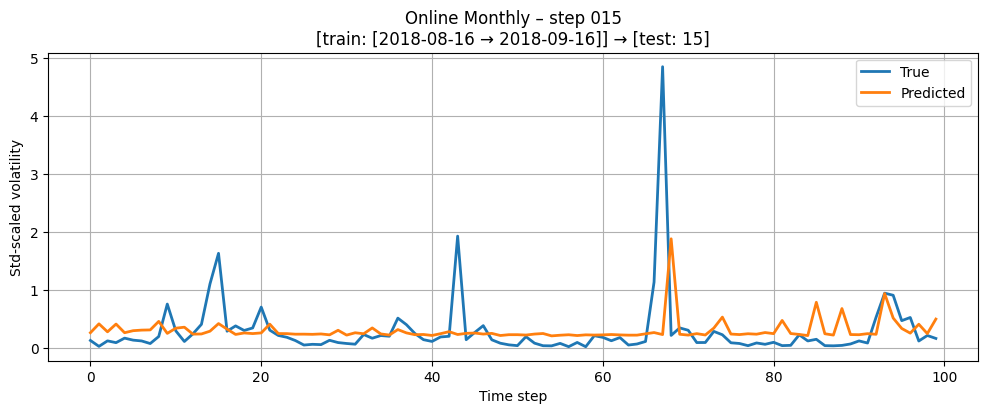

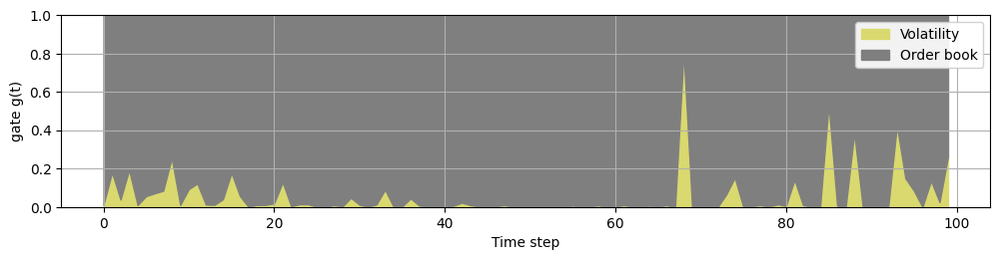

[online-monthly] Step 16: Train [2018-08-21 23:00:00 -> 2018-09-21 23:00:00], Test [2018-09-21 23:00:00 -> 2018-09-26 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-24 15:00:00 to 2018-09-21 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-22 00:00:00 to 2018-09-26 23:00:00
[online-monthly] step 016  RMSE=0.2038  MAE=0.1479
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 120 predictions from 2018-09-22 00:00:00 to 2018-09-26 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_16.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


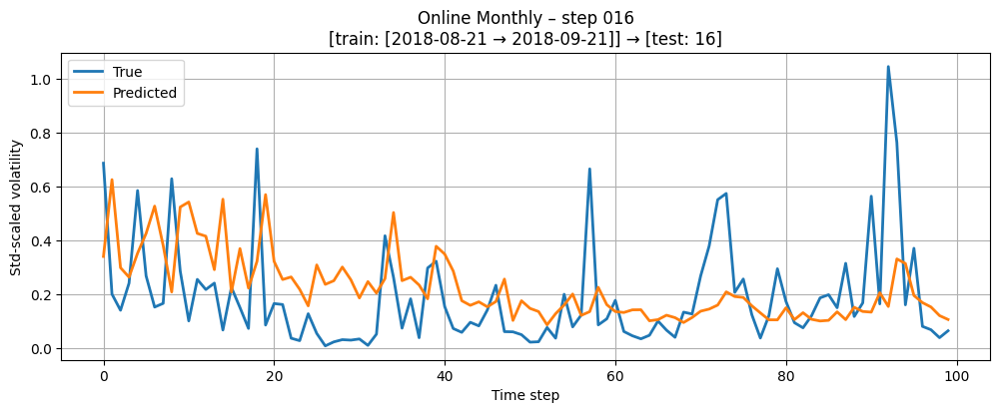

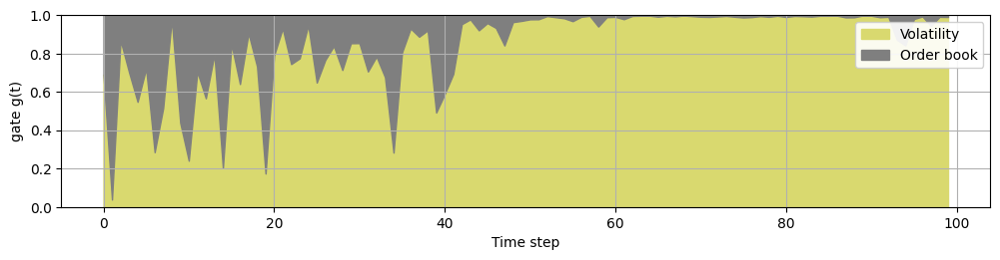

[online-monthly] Step 17: Train [2018-08-26 23:00:00 -> 2018-09-26 23:00:00], Test [2018-09-26 23:00:00 -> 2018-09-30 21:00:00]
Dataset created: 666 total points, 602 valid points after AR order 64
Target date range: 2018-08-29 15:00:00 to 2018-09-26 23:00:00
Dataset created: 93 total points, 93 valid points after AR order 64
Target date range: 2018-09-27 00:00:00 to 2018-09-30 21:00:00
[online-monthly] step 017  RMSE=0.2795  MAE=0.1630
Model saved to saved_models/online_monthly/hinge/model.pt
Saving 93 predictions from 2018-09-27 00:00:00 to 2018-09-30 21:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge/residuals_step_17.csv
Predictions saved to saved_predictions/online_monthly/hinge/predictions.npy


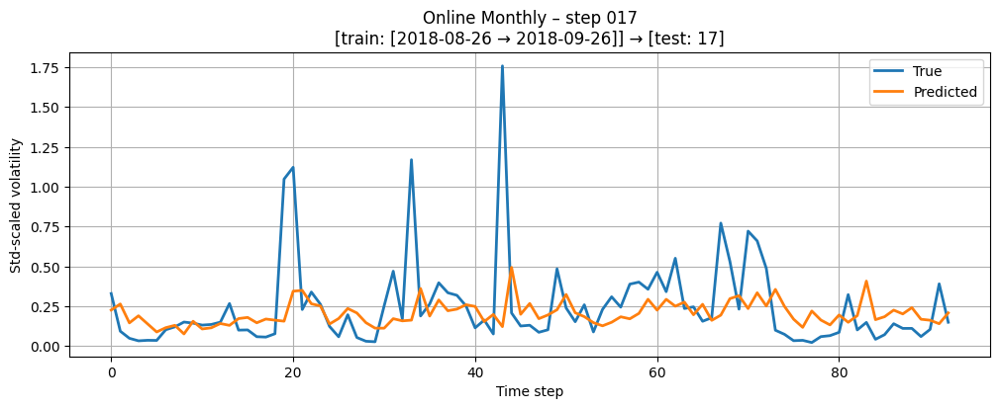

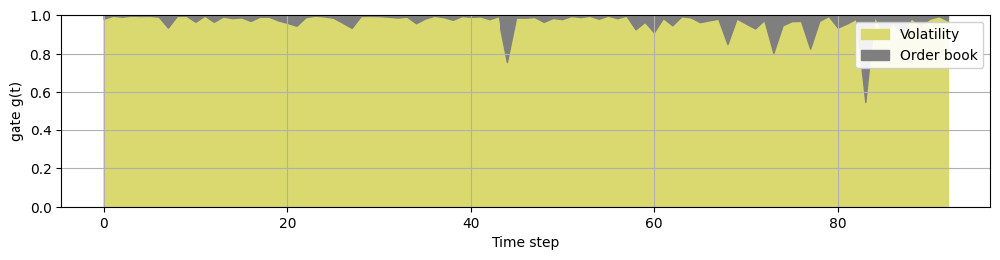

[online-monthly] finished 18 steps.

=== Training model: LOGNORMAL ===

[online-monthly] Step 0: Train [2018-06-04 23:00:00 -> 2018-06-30 22:00:00], Test [2018-06-30 22:00:00 -> 2018-07-08 23:00:00]
Dataset created: 621 total points, 621 valid points after AR order 64
Target date range: 2018-06-04 23:00:00 to 2018-06-30 22:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-07-03 23:00:00 to 2018-07-08 23:00:00
[online-monthly] step 000  RMSE=0.6100  MAE=0.4448
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 120 predictions from 2018-07-03 23:00:00 to 2018-07-08 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_0.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


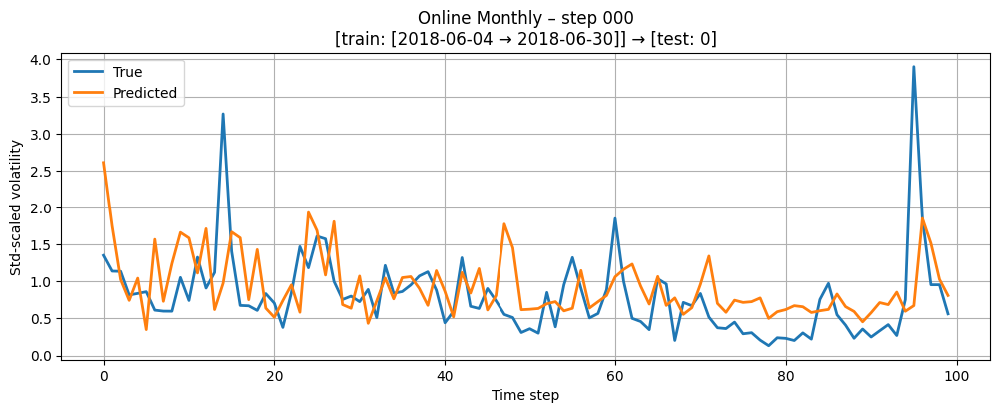

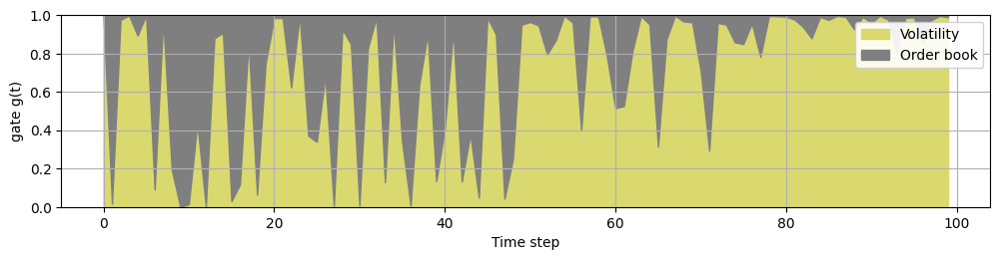

[online-monthly] Step 1: Train [2018-06-08 23:00:00 -> 2018-07-08 23:00:00], Test [2018-07-08 23:00:00 -> 2018-07-13 23:00:00]
Dataset created: 645 total points, 581 valid points after AR order 64
Target date range: 2018-06-11 17:00:00 to 2018-07-08 23:00:00
Dataset created: 117 total points, 117 valid points after AR order 64
Target date range: 2018-07-09 00:00:00 to 2018-07-13 23:00:00
[online-monthly] step 001  RMSE=0.5372  MAE=0.4330
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 117 predictions from 2018-07-09 00:00:00 to 2018-07-13 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_1.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


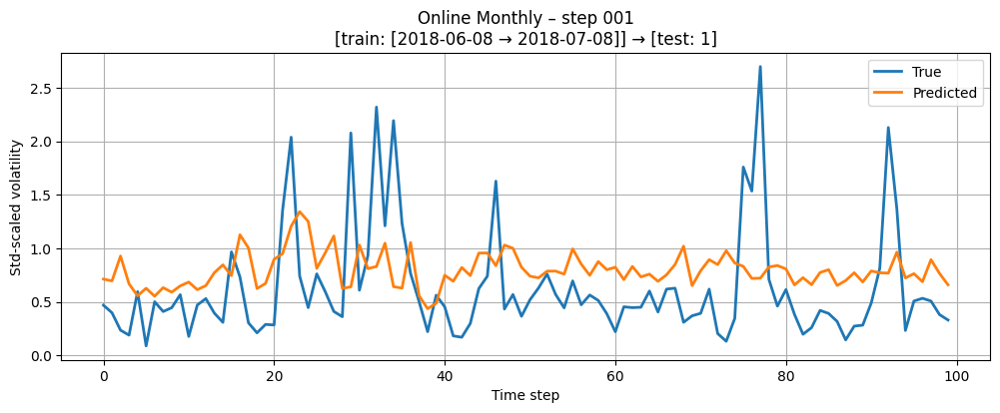

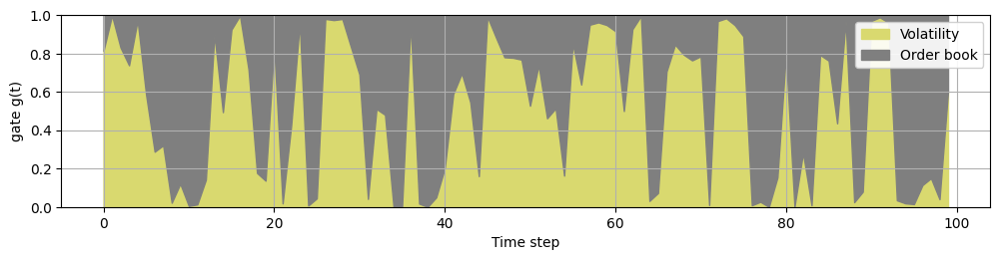

[online-monthly] Step 2: Train [2018-06-13 23:00:00 -> 2018-07-13 23:00:00], Test [2018-07-13 23:00:00 -> 2018-07-18 23:00:00]
Dataset created: 644 total points, 580 valid points after AR order 64
Target date range: 2018-06-16 15:00:00 to 2018-07-13 23:00:00
Dataset created: 103 total points, 103 valid points after AR order 64
Target date range: 2018-07-14 00:00:00 to 2018-07-18 23:00:00
[online-monthly] step 002  RMSE=3.3770  MAE=1.1618
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 103 predictions from 2018-07-14 00:00:00 to 2018-07-18 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_2.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


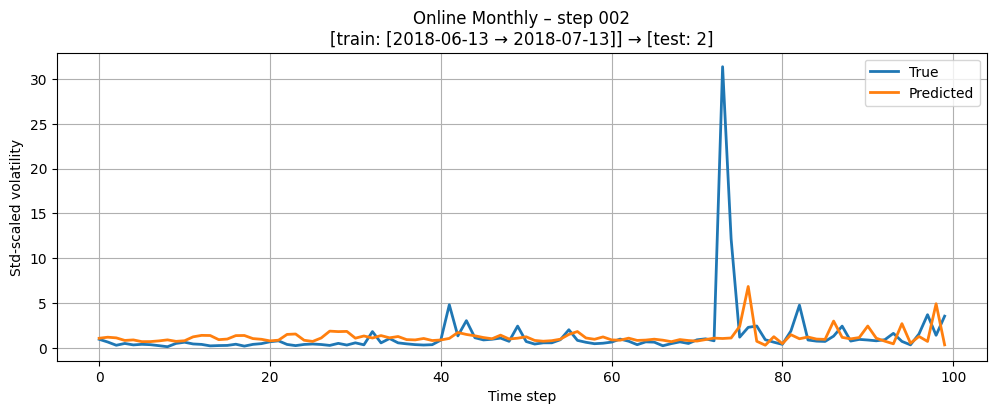

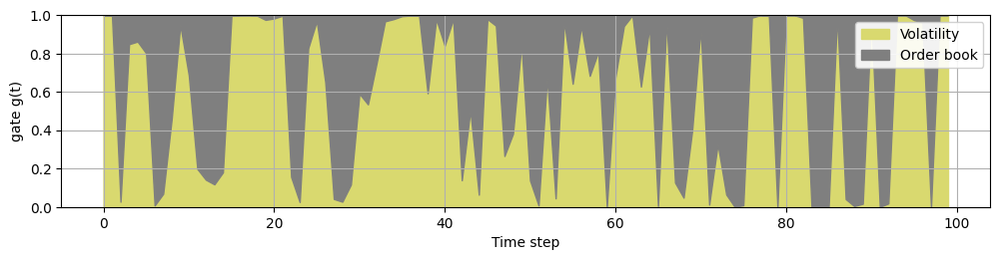

[online-monthly] Step 3: Train [2018-06-18 23:00:00 -> 2018-07-18 23:00:00], Test [2018-07-18 23:00:00 -> 2018-07-23 23:00:00]
Dataset created: 627 total points, 563 valid points after AR order 64
Target date range: 2018-06-21 15:00:00 to 2018-07-18 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-19 00:00:00 to 2018-07-23 23:00:00
[online-monthly] step 003  RMSE=74200.9295  MAE=9185.2512
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 119 predictions from 2018-07-19 00:00:00 to 2018-07-23 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_3.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


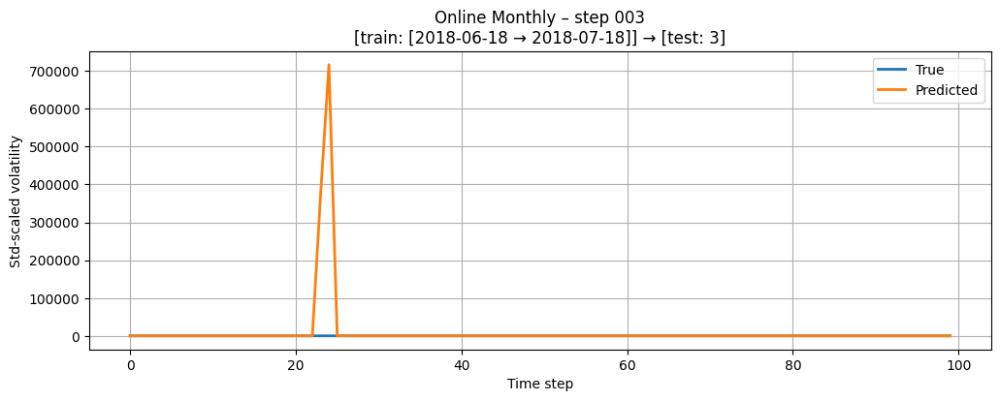

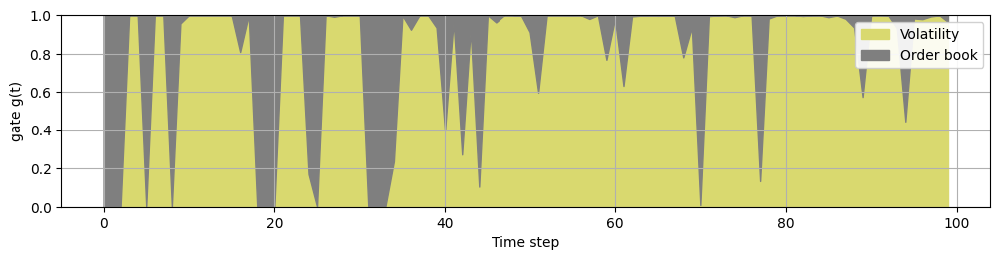

[online-monthly] Step 4: Train [2018-06-23 23:00:00 -> 2018-07-23 23:00:00], Test [2018-07-23 23:00:00 -> 2018-07-28 23:00:00]
Dataset created: 626 total points, 562 valid points after AR order 64
Target date range: 2018-06-26 15:00:00 to 2018-07-23 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-24 00:00:00 to 2018-07-28 23:00:00
[online-monthly] step 004  RMSE=0.4904  MAE=0.3421
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 119 predictions from 2018-07-24 00:00:00 to 2018-07-28 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_4.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


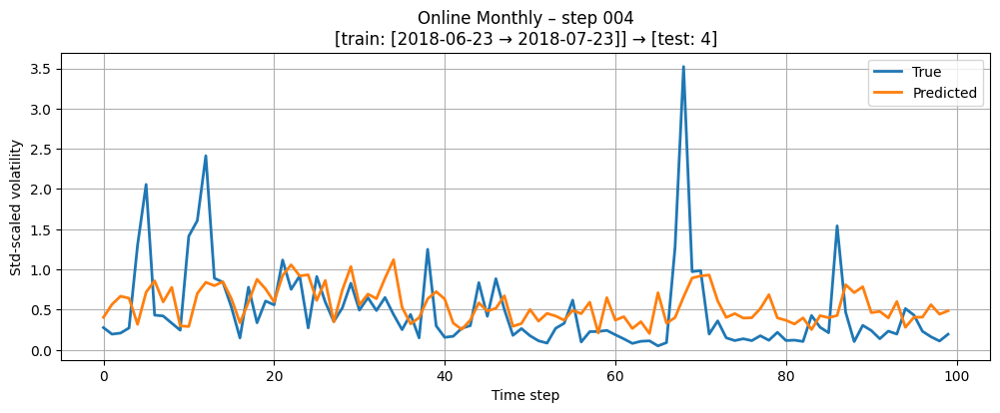

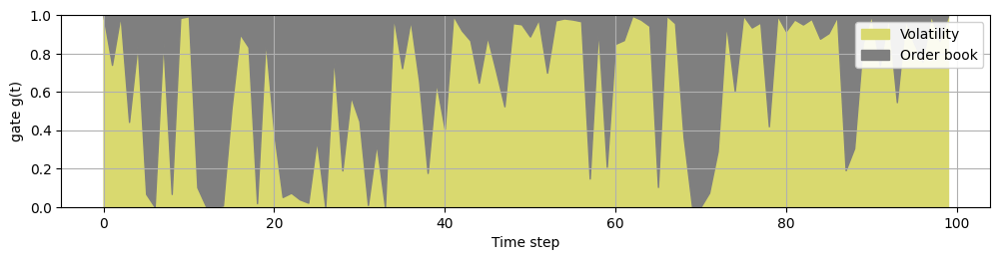

[online-monthly] Step 5: Train [2018-06-28 23:00:00 -> 2018-07-28 23:00:00], Test [2018-07-28 23:00:00 -> 2018-08-03 23:00:00]
Dataset created: 625 total points, 561 valid points after AR order 64
Target date range: 2018-07-04 16:00:00 to 2018-07-28 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-07-29 00:00:00 to 2018-08-03 23:00:00
[online-monthly] step 005  RMSE=0.4053  MAE=0.3217
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 72 predictions from 2018-07-29 00:00:00 to 2018-08-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_5.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


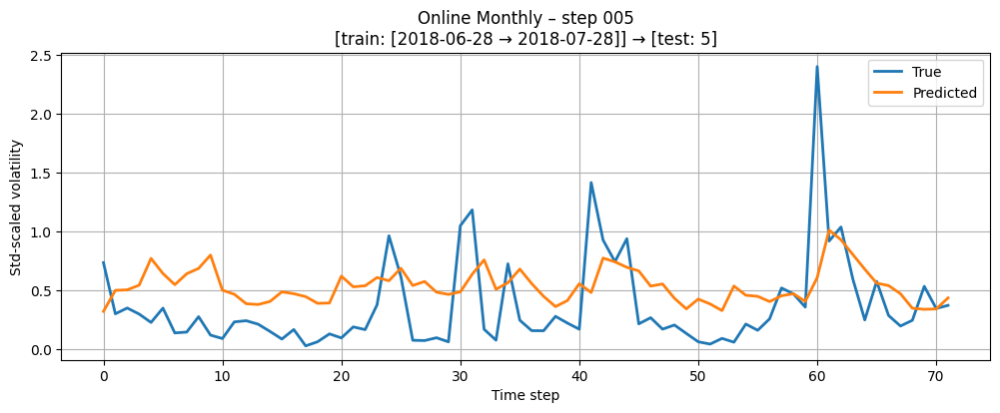

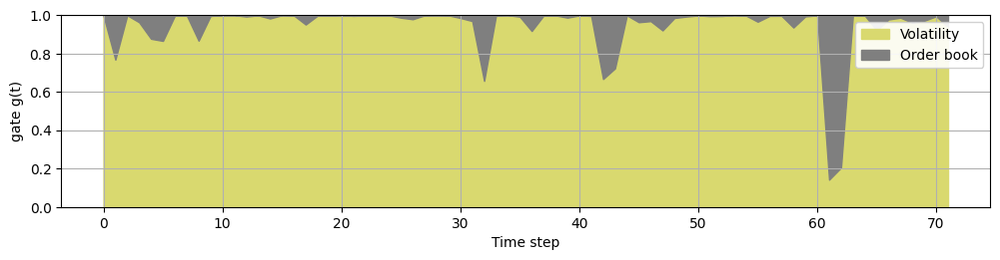

[online-monthly] Step 6: Train [2018-07-03 23:00:00 -> 2018-08-03 23:00:00], Test [2018-08-03 23:00:00 -> 2018-08-07 23:00:00]
Dataset created: 650 total points, 586 valid points after AR order 64
Target date range: 2018-07-06 16:00:00 to 2018-08-03 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-04 00:00:00 to 2018-08-07 23:00:00
[online-monthly] step 006  RMSE=0.5698  MAE=0.3783
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 96 predictions from 2018-08-04 00:00:00 to 2018-08-07 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_6.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


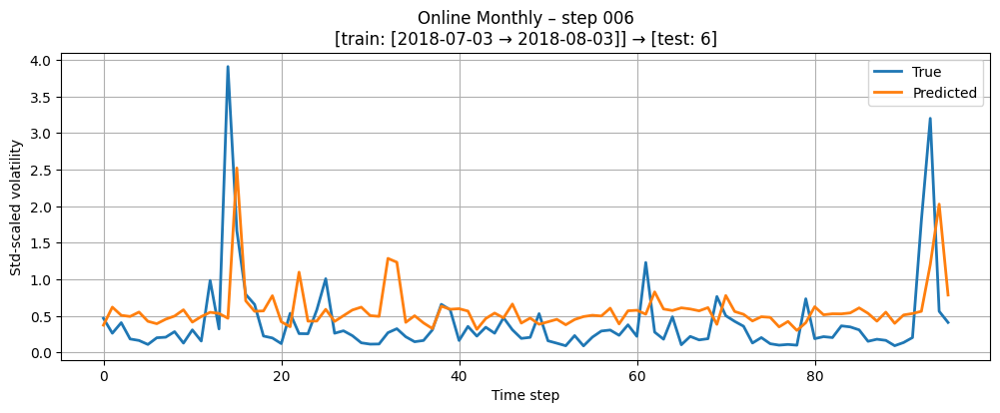

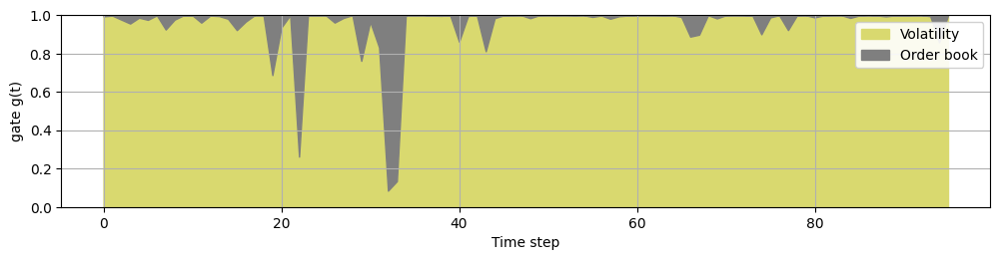

[online-monthly] Step 7: Train [2018-07-07 23:00:00 -> 2018-08-07 23:00:00], Test [2018-08-07 23:00:00 -> 2018-08-12 23:00:00]
Dataset created: 651 total points, 587 valid points after AR order 64
Target date range: 2018-07-10 16:00:00 to 2018-08-07 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-08 00:00:00 to 2018-08-12 23:00:00
[online-monthly] step 007  RMSE=1.6601  MAE=0.6971
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 120 predictions from 2018-08-08 00:00:00 to 2018-08-12 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_7.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


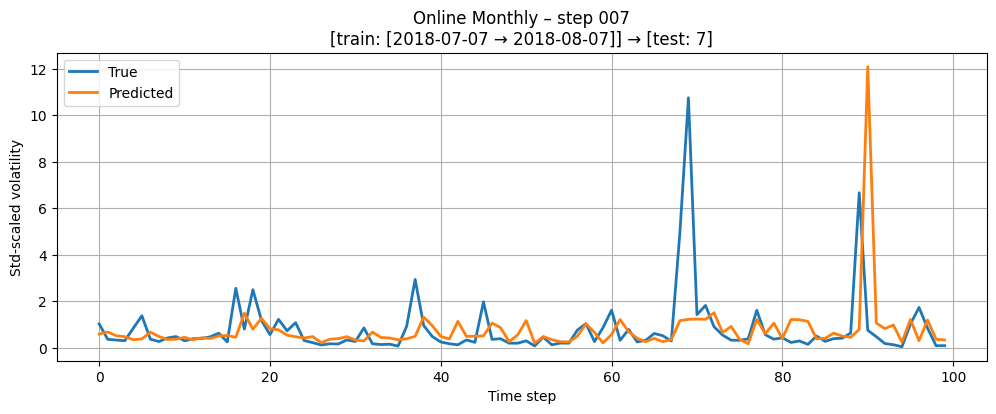

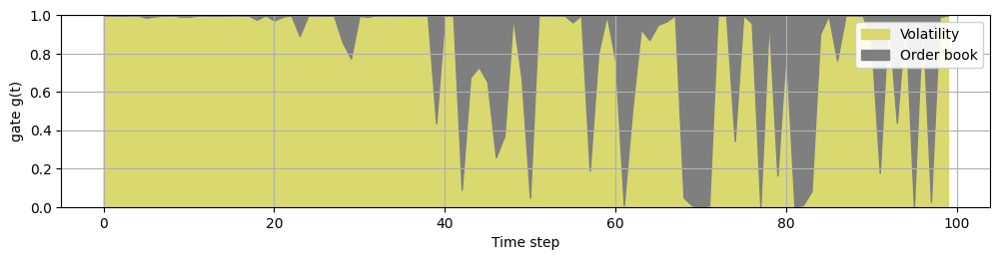

[online-monthly] Step 8: Train [2018-07-12 23:00:00 -> 2018-08-12 23:00:00], Test [2018-08-12 23:00:00 -> 2018-08-17 23:00:00]
Dataset created: 654 total points, 590 valid points after AR order 64
Target date range: 2018-07-15 15:00:00 to 2018-08-12 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-13 00:00:00 to 2018-08-17 23:00:00
[online-monthly] step 008  RMSE=0.4512  MAE=0.3446
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 119 predictions from 2018-08-13 00:00:00 to 2018-08-17 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_8.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


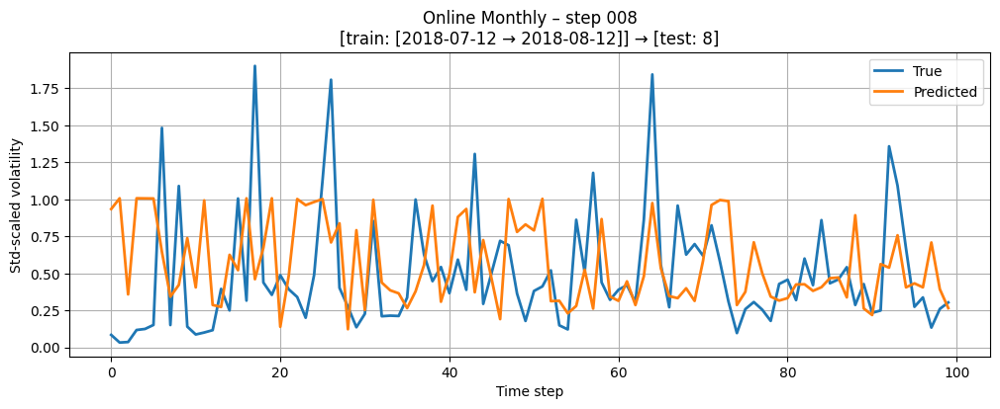

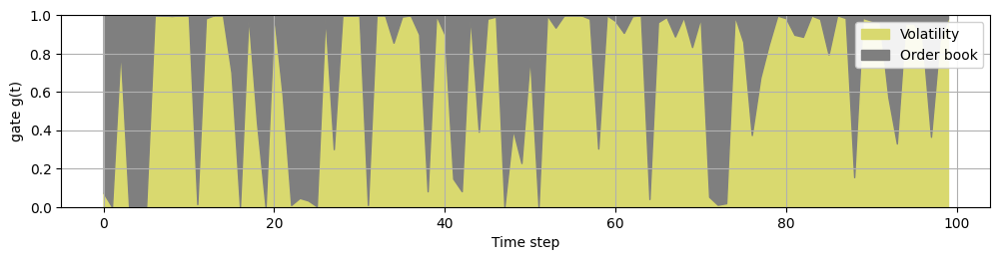

[online-monthly] Step 9: Train [2018-07-17 23:00:00 -> 2018-08-17 23:00:00], Test [2018-08-17 23:00:00 -> 2018-08-22 23:00:00]
Dataset created: 670 total points, 606 valid points after AR order 64
Target date range: 2018-07-20 16:00:00 to 2018-08-17 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-18 00:00:00 to 2018-08-22 23:00:00
[online-monthly] step 009  RMSE=66.3687  MAE=6.7980
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 120 predictions from 2018-08-18 00:00:00 to 2018-08-22 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_9.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


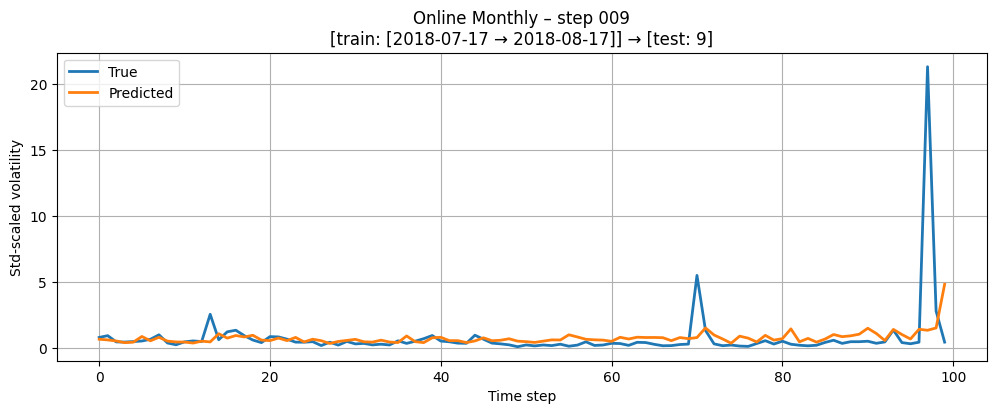

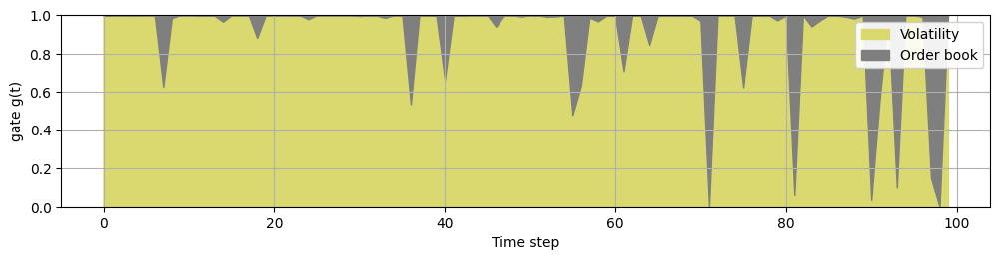

[online-monthly] Step 10: Train [2018-07-22 23:00:00 -> 2018-08-22 23:00:00], Test [2018-08-22 23:00:00 -> 2018-08-27 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-25 16:00:00 to 2018-08-22 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-23 00:00:00 to 2018-08-27 23:00:00
[online-monthly] step 010  RMSE=inf  MAE=3813649761059094528.0000
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 119 predictions from 2018-08-23 00:00:00 to 2018-08-27 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_10.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


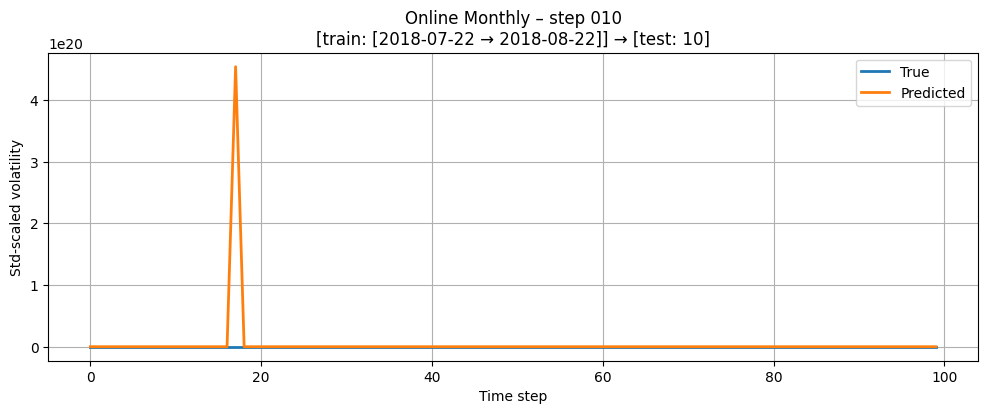

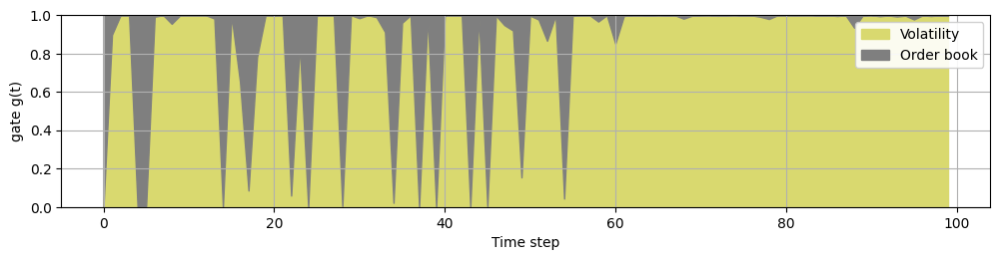

[online-monthly] Step 11: Train [2018-07-27 23:00:00 -> 2018-08-27 23:00:00], Test [2018-08-27 23:00:00 -> 2018-09-03 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-30 15:00:00 to 2018-08-27 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-28 00:00:00 to 2018-09-03 23:00:00
[online-monthly] step 011  RMSE=0.5683  MAE=0.4528
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 96 predictions from 2018-08-28 00:00:00 to 2018-09-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_11.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


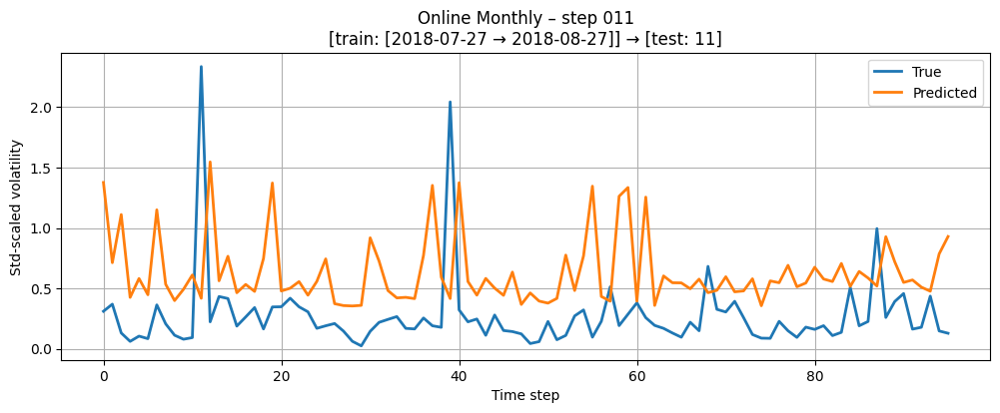

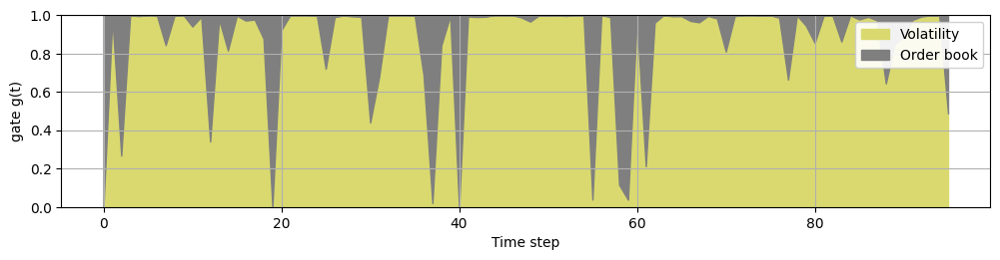

[online-monthly] Step 12: Train [2018-08-03 23:00:00 -> 2018-09-03 23:00:00], Test [2018-09-03 23:00:00 -> 2018-09-06 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-06 15:00:00 to 2018-09-03 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-09-04 00:00:00 to 2018-09-06 23:00:00
[online-monthly] step 012  RMSE=18.0850  MAE=2.9610
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 72 predictions from 2018-09-04 00:00:00 to 2018-09-06 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_12.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


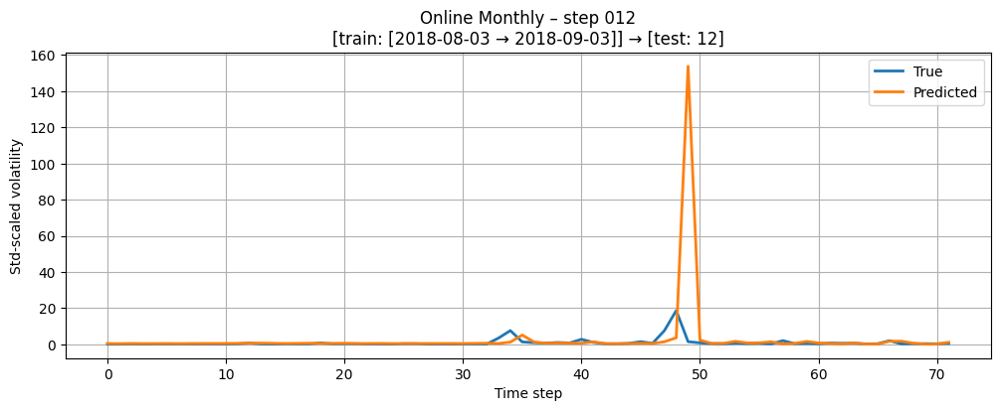

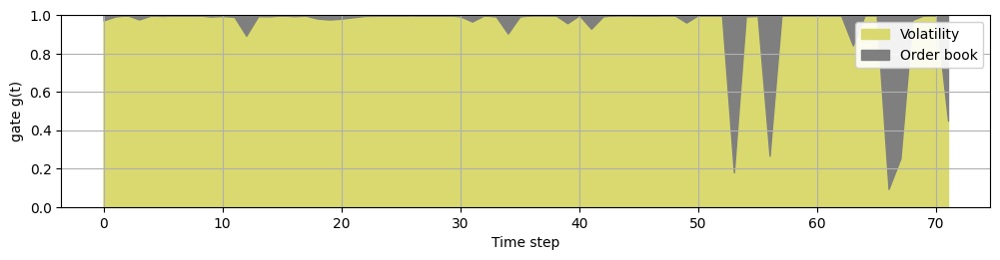

[online-monthly] Step 13: Train [2018-08-06 23:00:00 -> 2018-09-06 23:00:00], Test [2018-09-06 23:00:00 -> 2018-09-11 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-09 15:00:00 to 2018-09-06 23:00:00
Dataset created: 114 total points, 114 valid points after AR order 64
Target date range: 2018-09-07 00:00:00 to 2018-09-11 23:00:00
[online-monthly] step 013  RMSE=4.0100  MAE=0.8395
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 114 predictions from 2018-09-07 00:00:00 to 2018-09-11 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_13.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


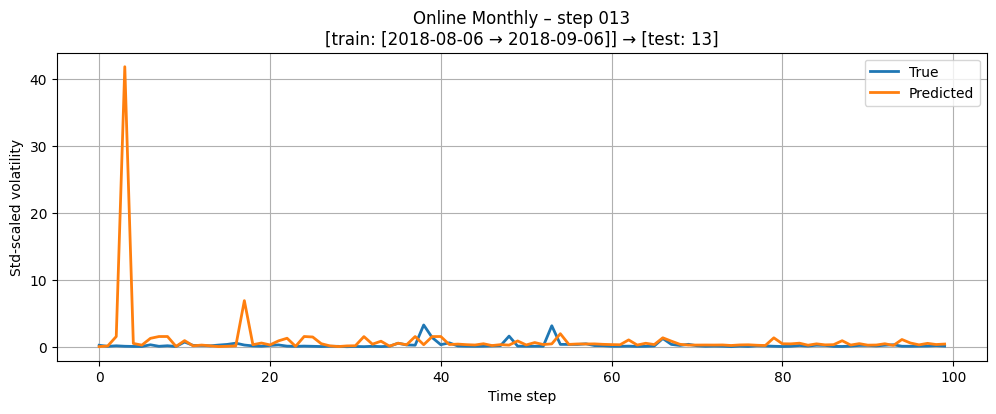

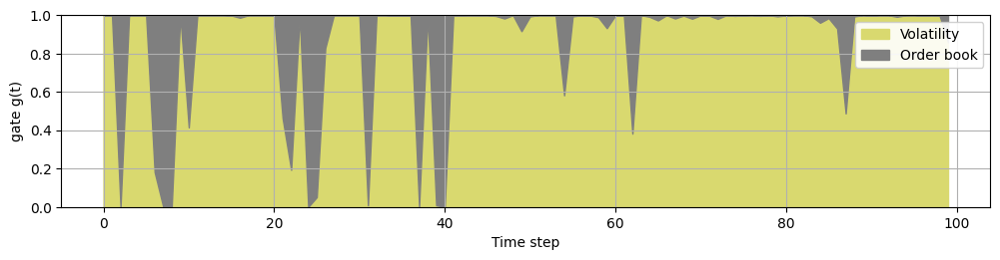

[online-monthly] Step 14: Train [2018-08-11 23:00:00 -> 2018-09-11 23:00:00], Test [2018-09-11 23:00:00 -> 2018-09-16 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-14 15:00:00 to 2018-09-11 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-09-12 00:00:00 to 2018-09-16 23:00:00
[online-monthly] step 014  RMSE=0.2946  MAE=0.2670
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 119 predictions from 2018-09-12 00:00:00 to 2018-09-16 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_14.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


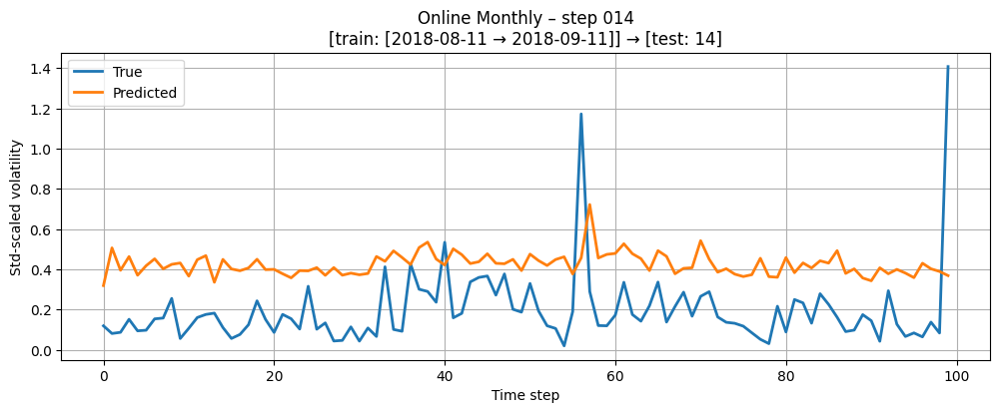

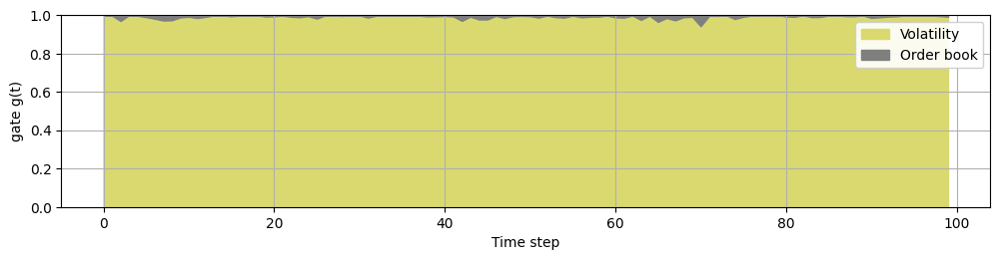

[online-monthly] Step 15: Train [2018-08-16 23:00:00 -> 2018-09-16 23:00:00], Test [2018-09-16 23:00:00 -> 2018-09-21 23:00:00]
Dataset created: 664 total points, 600 valid points after AR order 64
Target date range: 2018-08-19 16:00:00 to 2018-09-16 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-17 00:00:00 to 2018-09-21 23:00:00
[online-monthly] step 015  RMSE=0.5878  MAE=0.3273
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 120 predictions from 2018-09-17 00:00:00 to 2018-09-21 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_15.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


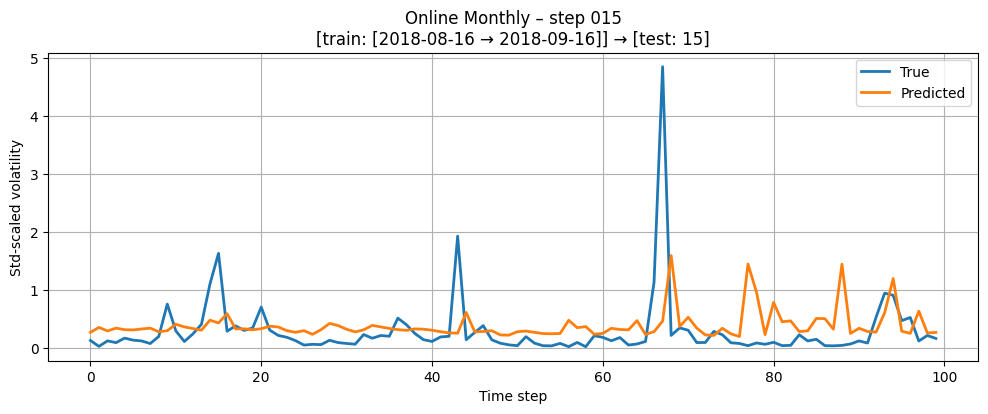

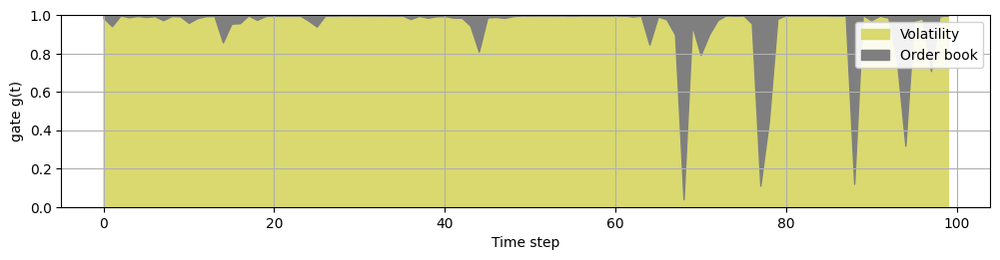

[online-monthly] Step 16: Train [2018-08-21 23:00:00 -> 2018-09-21 23:00:00], Test [2018-09-21 23:00:00 -> 2018-09-26 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-24 15:00:00 to 2018-09-21 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-22 00:00:00 to 2018-09-26 23:00:00
[online-monthly] step 016  RMSE=0.2490  MAE=0.1944
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 120 predictions from 2018-09-22 00:00:00 to 2018-09-26 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_16.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


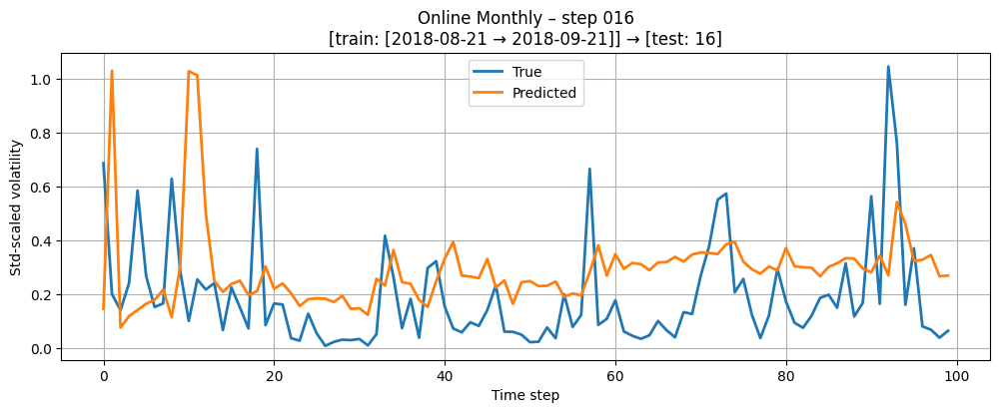

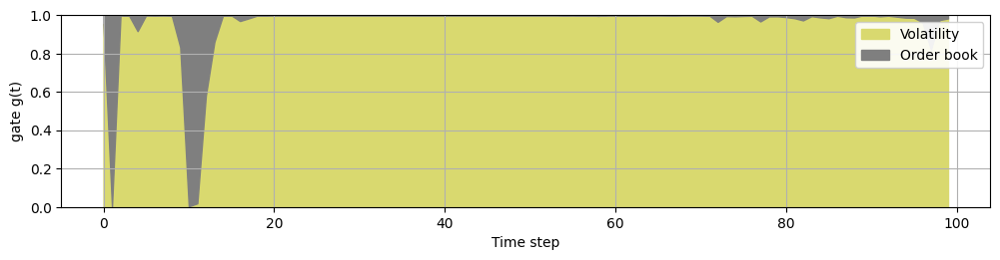

[online-monthly] Step 17: Train [2018-08-26 23:00:00 -> 2018-09-26 23:00:00], Test [2018-09-26 23:00:00 -> 2018-09-30 21:00:00]
Dataset created: 666 total points, 602 valid points after AR order 64
Target date range: 2018-08-29 15:00:00 to 2018-09-26 23:00:00
Dataset created: 93 total points, 93 valid points after AR order 64
Target date range: 2018-09-27 00:00:00 to 2018-09-30 21:00:00
[online-monthly] step 017  RMSE=0.2819  MAE=0.2040
Model saved to saved_models/online_monthly/lognormal/model.pt
Saving 93 predictions from 2018-09-27 00:00:00 to 2018-09-30 21:00:00
Residuals with dates saved to saved_residuals/online_monthly/lognormal/residuals_step_17.csv
Predictions saved to saved_predictions/online_monthly/lognormal/predictions.npy


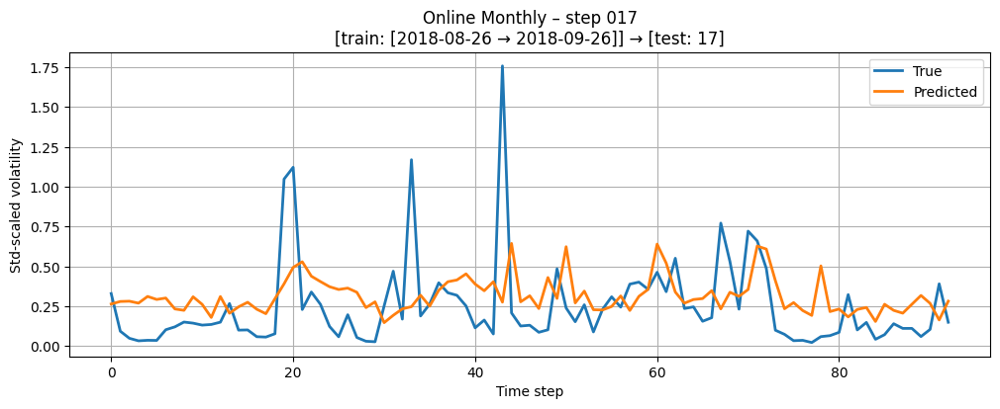

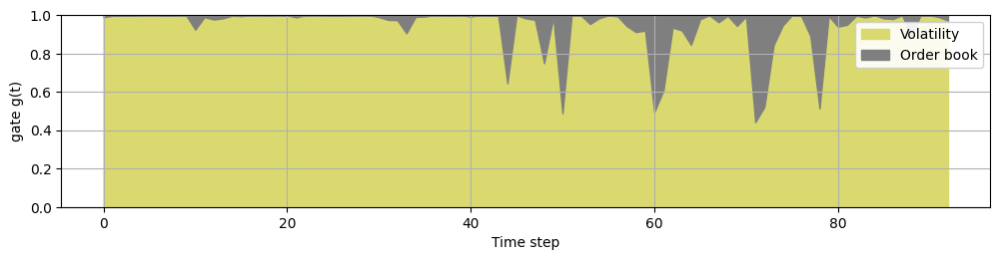

[online-monthly] finished 18 steps.

=== Training model: INVERSE_GAUSSIAN ===

[online-monthly] Step 0: Train [2018-06-04 23:00:00 -> 2018-06-30 22:00:00], Test [2018-06-30 22:00:00 -> 2018-07-08 23:00:00]
Dataset created: 621 total points, 621 valid points after AR order 64
Target date range: 2018-06-04 23:00:00 to 2018-06-30 22:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-07-03 23:00:00 to 2018-07-08 23:00:00
[online-monthly] step 000  RMSE=0.5099  MAE=0.3360
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 120 predictions from 2018-07-03 23:00:00 to 2018-07-08 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_0.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


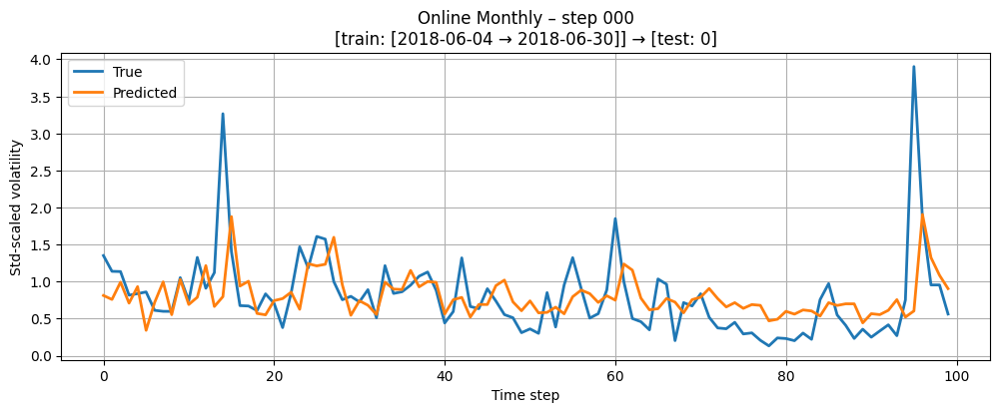

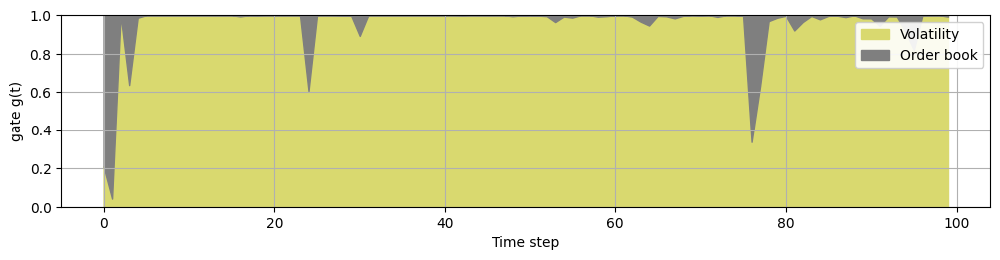

[online-monthly] Step 1: Train [2018-06-08 23:00:00 -> 2018-07-08 23:00:00], Test [2018-07-08 23:00:00 -> 2018-07-13 23:00:00]
Dataset created: 645 total points, 581 valid points after AR order 64
Target date range: 2018-06-11 17:00:00 to 2018-07-08 23:00:00
Dataset created: 117 total points, 117 valid points after AR order 64
Target date range: 2018-07-09 00:00:00 to 2018-07-13 23:00:00
[online-monthly] step 001  RMSE=0.4960  MAE=0.3578
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 117 predictions from 2018-07-09 00:00:00 to 2018-07-13 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_1.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


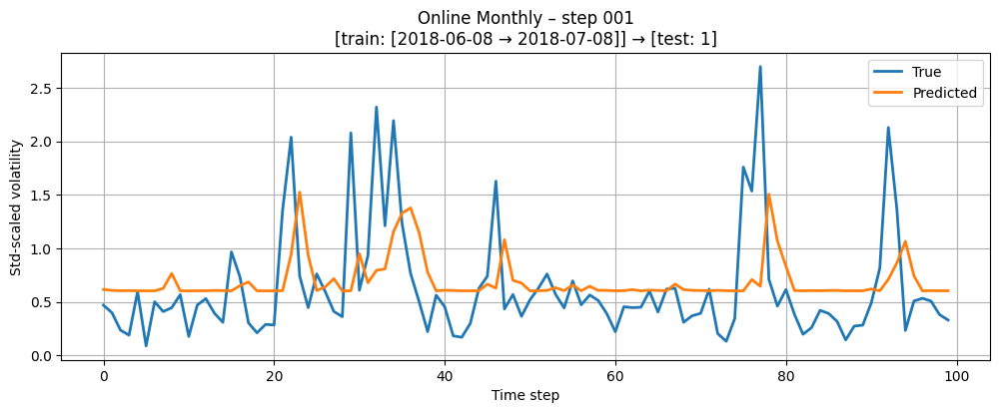

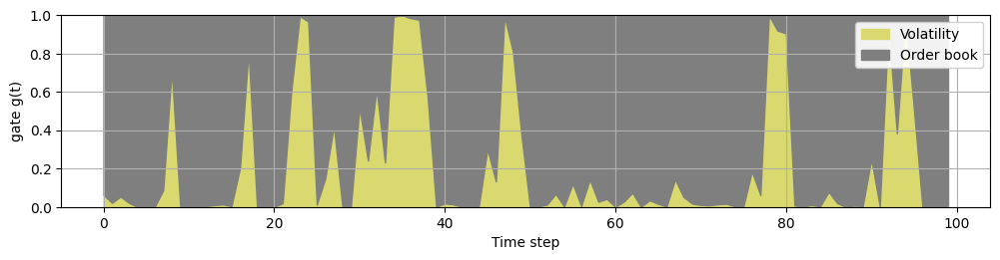

[online-monthly] Step 2: Train [2018-06-13 23:00:00 -> 2018-07-13 23:00:00], Test [2018-07-13 23:00:00 -> 2018-07-18 23:00:00]
Dataset created: 644 total points, 580 valid points after AR order 64
Target date range: 2018-06-16 15:00:00 to 2018-07-13 23:00:00
Dataset created: 103 total points, 103 valid points after AR order 64
Target date range: 2018-07-14 00:00:00 to 2018-07-18 23:00:00
[online-monthly] step 002  RMSE=3.2508  MAE=0.9464
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 103 predictions from 2018-07-14 00:00:00 to 2018-07-18 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_2.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


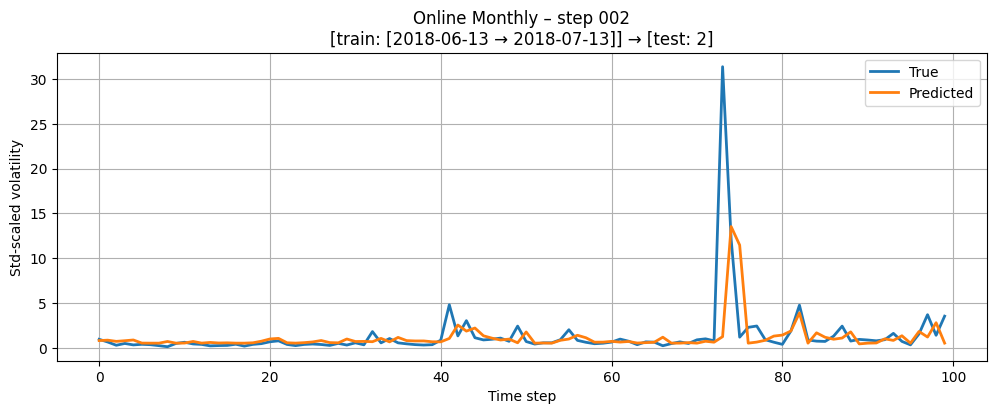

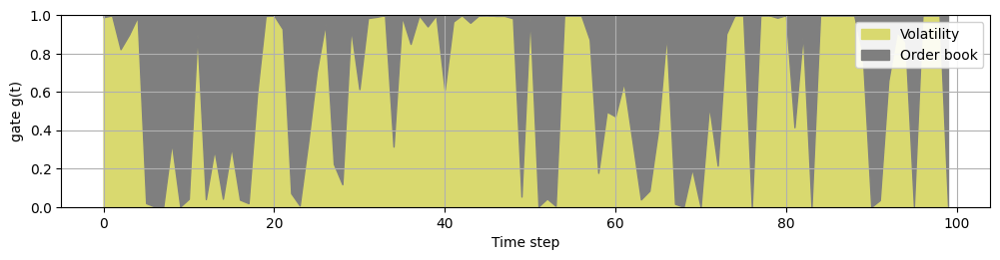

[online-monthly] Step 3: Train [2018-06-18 23:00:00 -> 2018-07-18 23:00:00], Test [2018-07-18 23:00:00 -> 2018-07-23 23:00:00]
Dataset created: 627 total points, 563 valid points after AR order 64
Target date range: 2018-06-21 15:00:00 to 2018-07-18 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-19 00:00:00 to 2018-07-23 23:00:00
[online-monthly] step 003  RMSE=0.6868  MAE=0.3857
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 119 predictions from 2018-07-19 00:00:00 to 2018-07-23 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_3.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


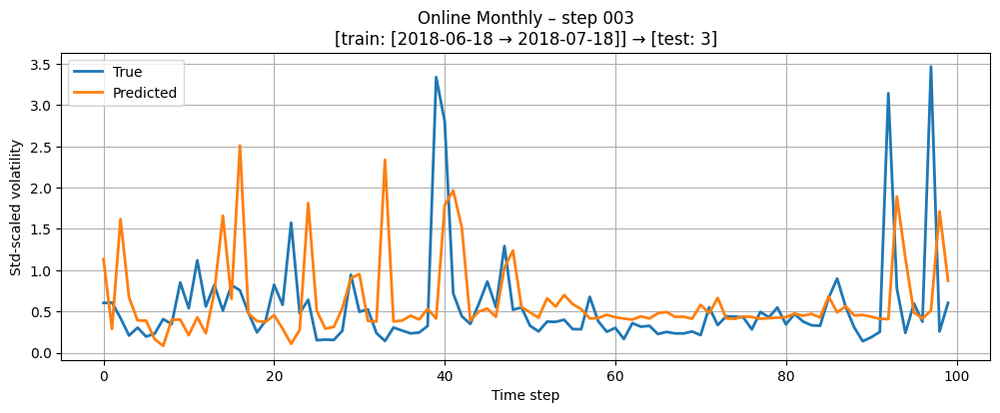

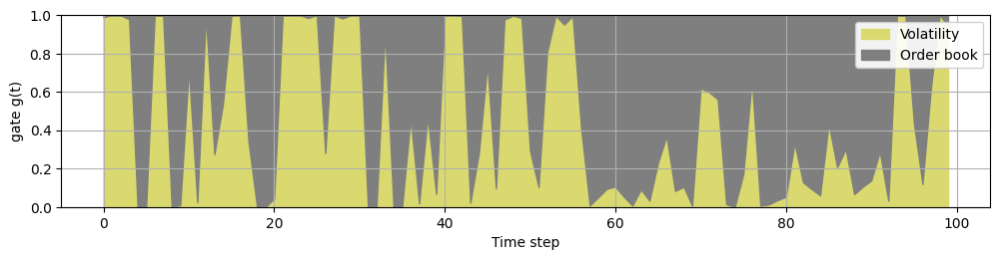

[online-monthly] Step 4: Train [2018-06-23 23:00:00 -> 2018-07-23 23:00:00], Test [2018-07-23 23:00:00 -> 2018-07-28 23:00:00]
Dataset created: 626 total points, 562 valid points after AR order 64
Target date range: 2018-06-26 15:00:00 to 2018-07-23 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-24 00:00:00 to 2018-07-28 23:00:00
[online-monthly] step 004  RMSE=0.4871  MAE=0.3375
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 119 predictions from 2018-07-24 00:00:00 to 2018-07-28 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_4.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


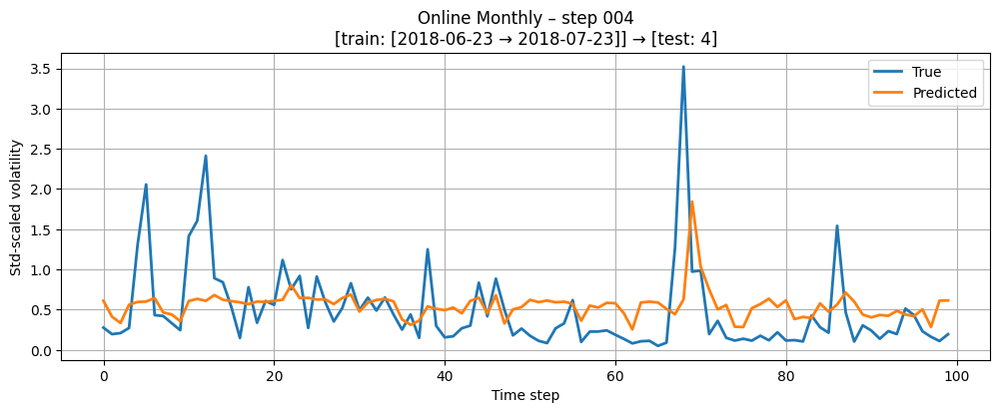

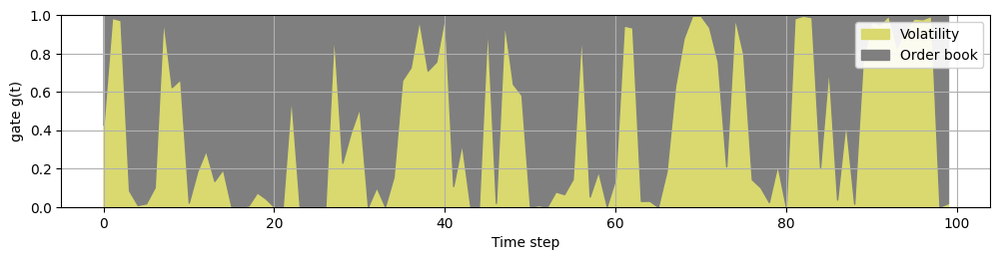

[online-monthly] Step 5: Train [2018-06-28 23:00:00 -> 2018-07-28 23:00:00], Test [2018-07-28 23:00:00 -> 2018-08-03 23:00:00]
Dataset created: 625 total points, 561 valid points after AR order 64
Target date range: 2018-07-04 16:00:00 to 2018-07-28 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-07-29 00:00:00 to 2018-08-03 23:00:00
[online-monthly] step 005  RMSE=0.4161  MAE=0.3432
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 72 predictions from 2018-07-29 00:00:00 to 2018-08-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_5.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


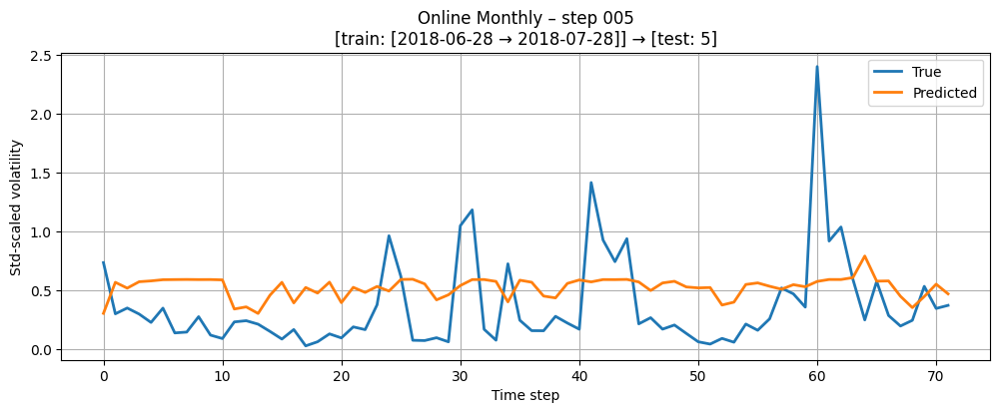

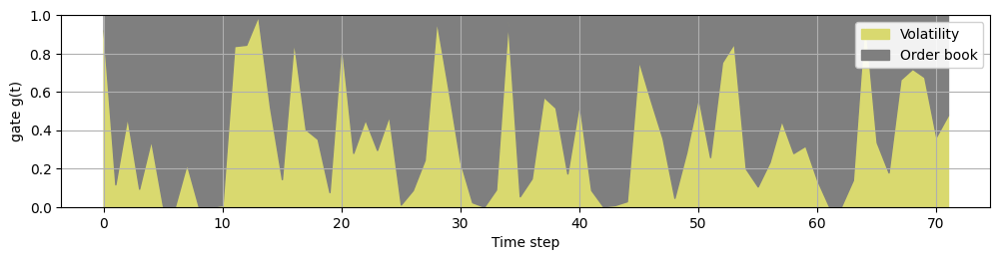

[online-monthly] Step 6: Train [2018-07-03 23:00:00 -> 2018-08-03 23:00:00], Test [2018-08-03 23:00:00 -> 2018-08-07 23:00:00]
Dataset created: 650 total points, 586 valid points after AR order 64
Target date range: 2018-07-06 16:00:00 to 2018-08-03 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-04 00:00:00 to 2018-08-07 23:00:00
[online-monthly] step 006  RMSE=0.5639  MAE=0.3706
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 96 predictions from 2018-08-04 00:00:00 to 2018-08-07 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_6.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


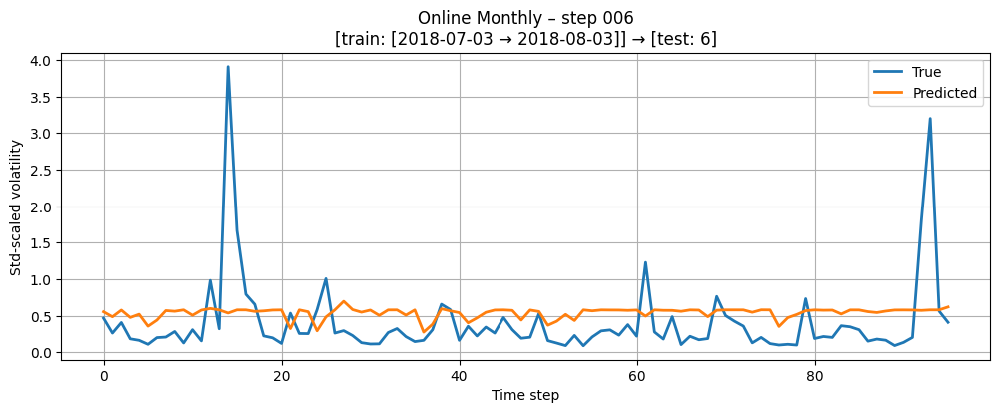

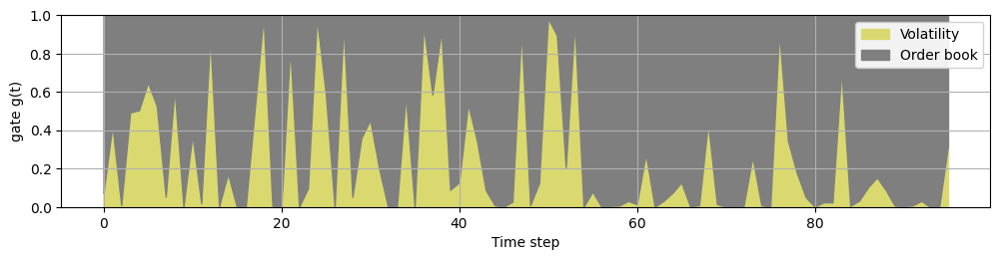

[online-monthly] Step 7: Train [2018-07-07 23:00:00 -> 2018-08-07 23:00:00], Test [2018-08-07 23:00:00 -> 2018-08-12 23:00:00]
Dataset created: 651 total points, 587 valid points after AR order 64
Target date range: 2018-07-10 16:00:00 to 2018-08-07 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-08 00:00:00 to 2018-08-12 23:00:00
[online-monthly] step 007  RMSE=1.3717  MAE=0.5584
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 120 predictions from 2018-08-08 00:00:00 to 2018-08-12 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_7.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


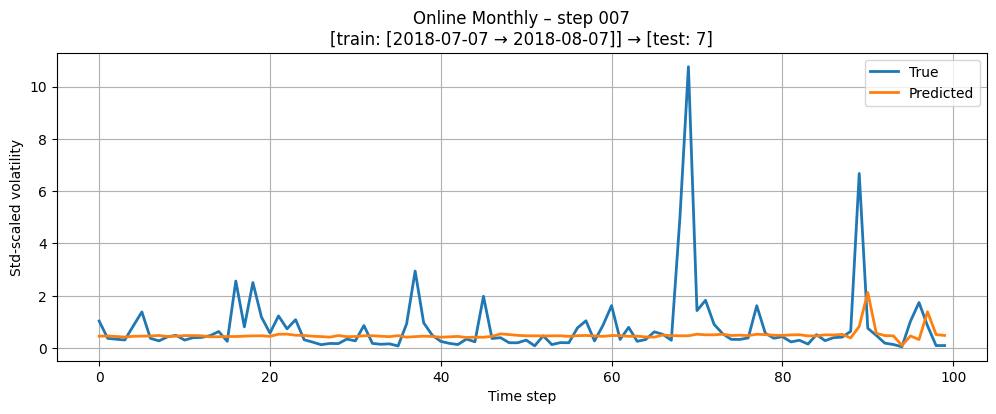

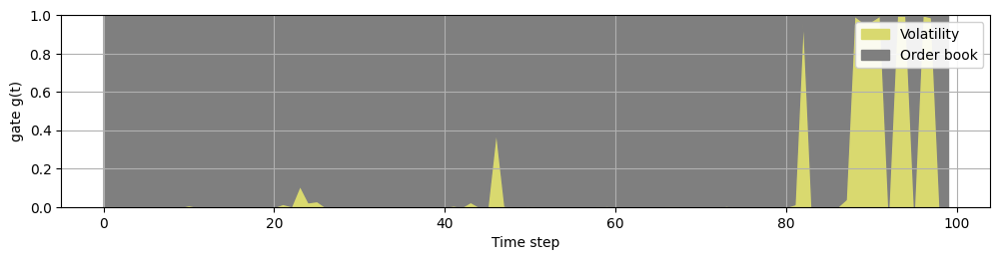

[online-monthly] Step 8: Train [2018-07-12 23:00:00 -> 2018-08-12 23:00:00], Test [2018-08-12 23:00:00 -> 2018-08-17 23:00:00]
Dataset created: 654 total points, 590 valid points after AR order 64
Target date range: 2018-07-15 15:00:00 to 2018-08-12 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-13 00:00:00 to 2018-08-17 23:00:00
[online-monthly] step 008  RMSE=0.3807  MAE=0.2702
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 119 predictions from 2018-08-13 00:00:00 to 2018-08-17 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_8.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


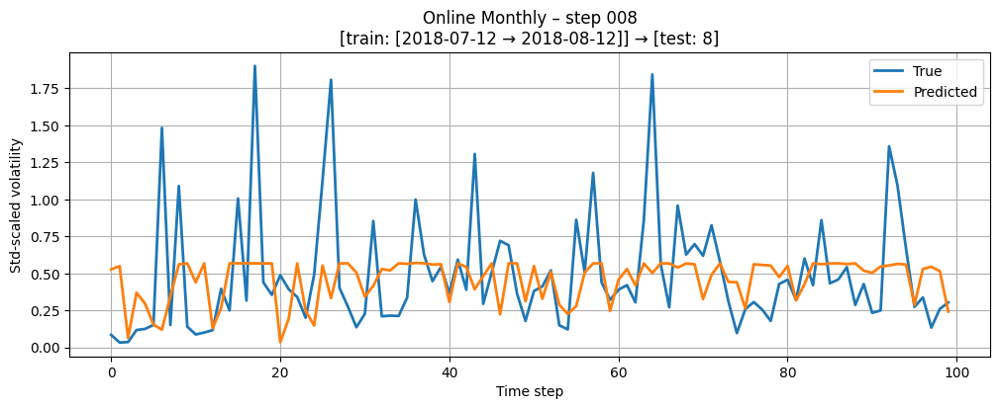

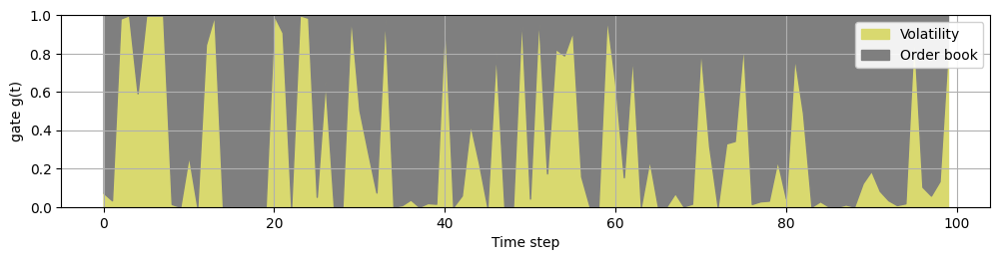

[online-monthly] Step 9: Train [2018-07-17 23:00:00 -> 2018-08-17 23:00:00], Test [2018-08-17 23:00:00 -> 2018-08-22 23:00:00]
Dataset created: 670 total points, 606 valid points after AR order 64
Target date range: 2018-07-20 16:00:00 to 2018-08-17 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-18 00:00:00 to 2018-08-22 23:00:00
[online-monthly] step 009  RMSE=2.1555  MAE=0.6948
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 120 predictions from 2018-08-18 00:00:00 to 2018-08-22 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_9.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


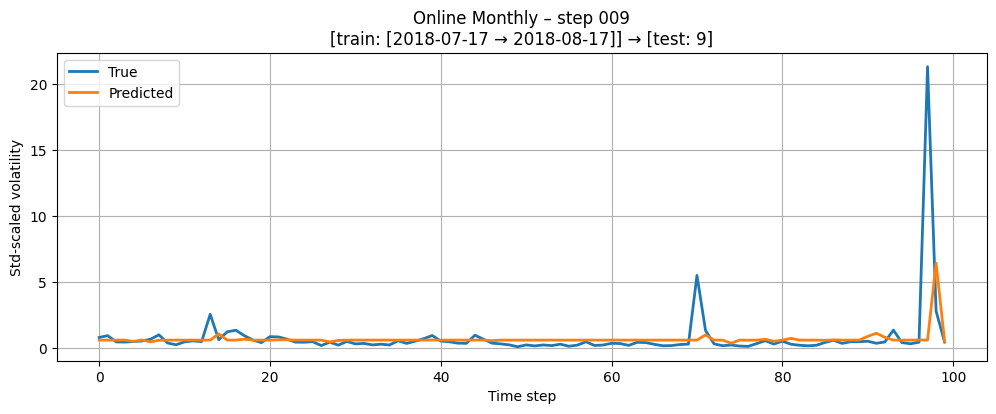

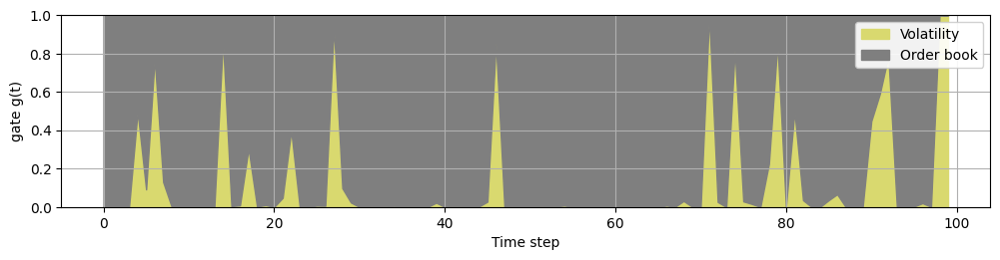

[online-monthly] Step 10: Train [2018-07-22 23:00:00 -> 2018-08-22 23:00:00], Test [2018-08-22 23:00:00 -> 2018-08-27 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-25 16:00:00 to 2018-08-22 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-23 00:00:00 to 2018-08-27 23:00:00
[online-monthly] step 010  RMSE=0.5183  MAE=0.3339
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 119 predictions from 2018-08-23 00:00:00 to 2018-08-27 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_10.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


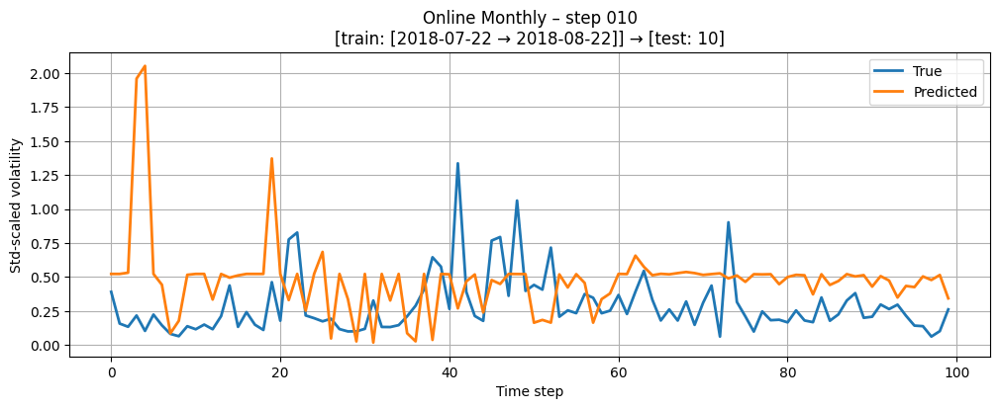

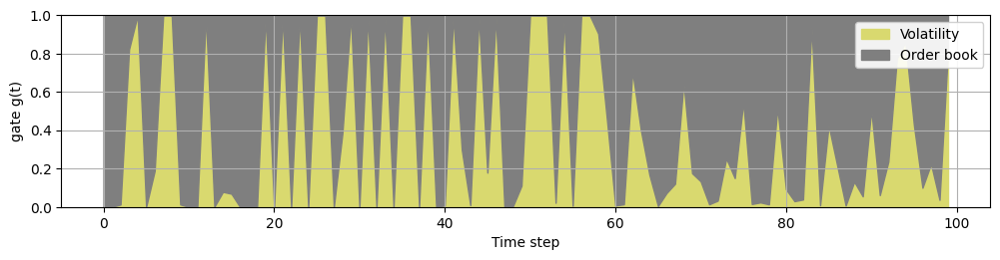

[online-monthly] Step 11: Train [2018-07-27 23:00:00 -> 2018-08-27 23:00:00], Test [2018-08-27 23:00:00 -> 2018-09-03 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-30 15:00:00 to 2018-08-27 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-28 00:00:00 to 2018-09-03 23:00:00
[online-monthly] step 011  RMSE=0.3693  MAE=0.2734
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 96 predictions from 2018-08-28 00:00:00 to 2018-09-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_11.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


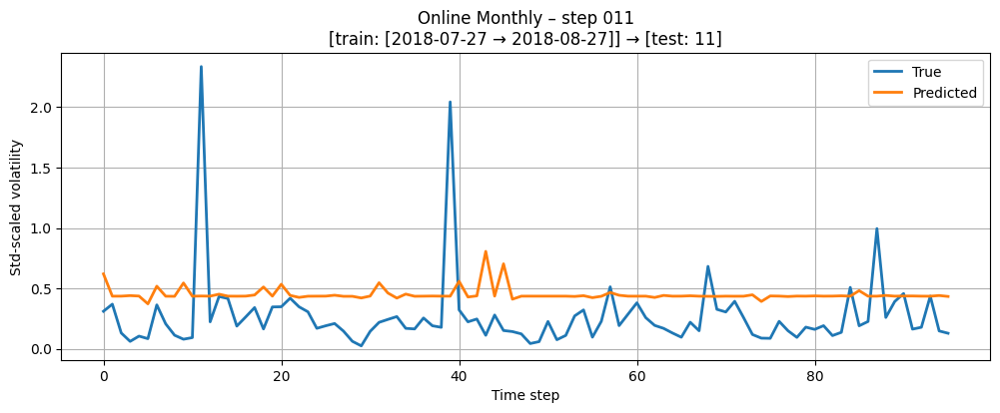

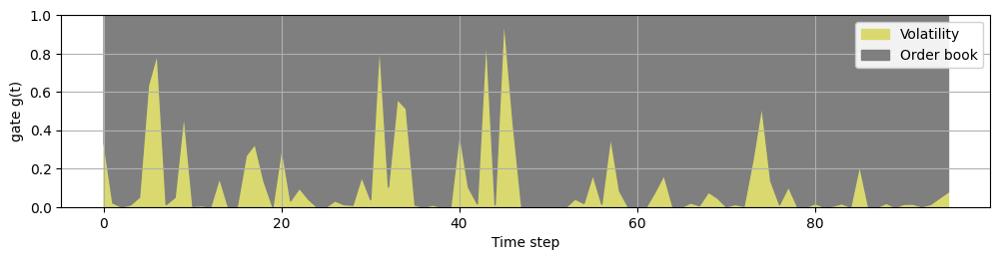

[online-monthly] Step 12: Train [2018-08-03 23:00:00 -> 2018-09-03 23:00:00], Test [2018-09-03 23:00:00 -> 2018-09-06 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-06 15:00:00 to 2018-09-03 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-09-04 00:00:00 to 2018-09-06 23:00:00
[online-monthly] step 012  RMSE=2.3572  MAE=0.8989
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 72 predictions from 2018-09-04 00:00:00 to 2018-09-06 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_12.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


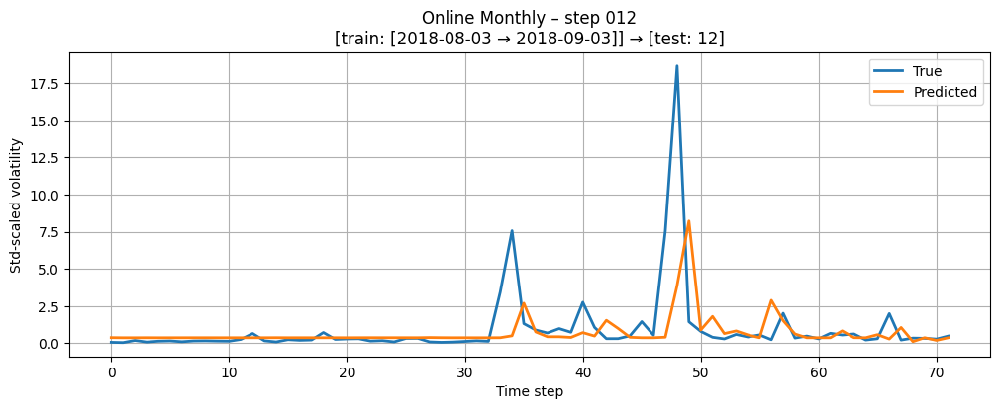

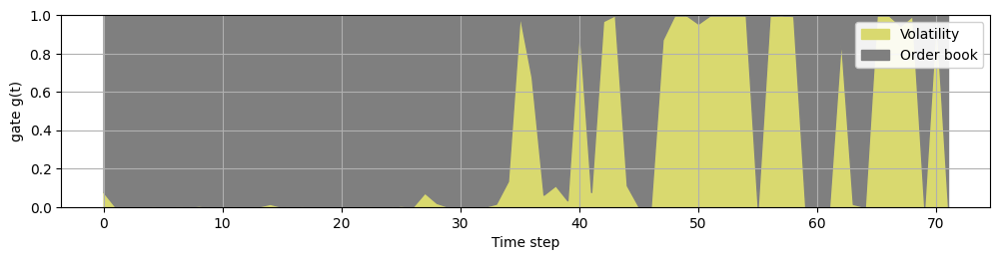

[online-monthly] Step 13: Train [2018-08-06 23:00:00 -> 2018-09-06 23:00:00], Test [2018-09-06 23:00:00 -> 2018-09-11 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-09 15:00:00 to 2018-09-06 23:00:00
Dataset created: 114 total points, 114 valid points after AR order 64
Target date range: 2018-09-07 00:00:00 to 2018-09-11 23:00:00
[online-monthly] step 013  RMSE=0.4712  MAE=0.2509
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 114 predictions from 2018-09-07 00:00:00 to 2018-09-11 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_13.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


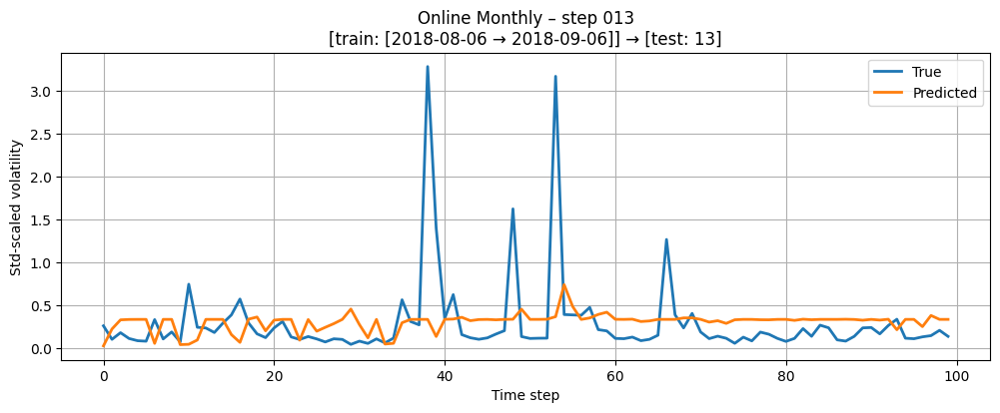

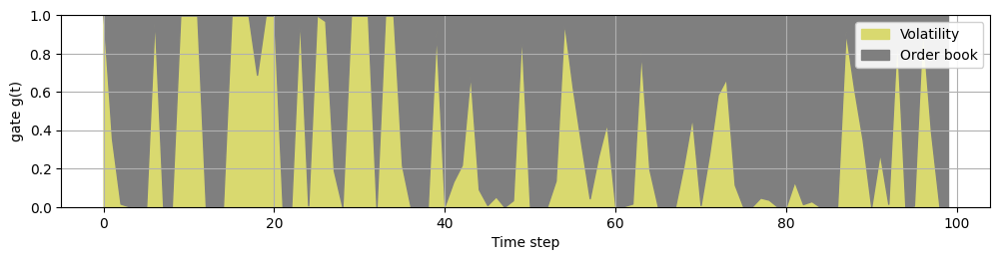

[online-monthly] Step 14: Train [2018-08-11 23:00:00 -> 2018-09-11 23:00:00], Test [2018-09-11 23:00:00 -> 2018-09-16 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-14 15:00:00 to 2018-09-11 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-09-12 00:00:00 to 2018-09-16 23:00:00
[online-monthly] step 014  RMSE=0.1921  MAE=0.1383
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 119 predictions from 2018-09-12 00:00:00 to 2018-09-16 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_14.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


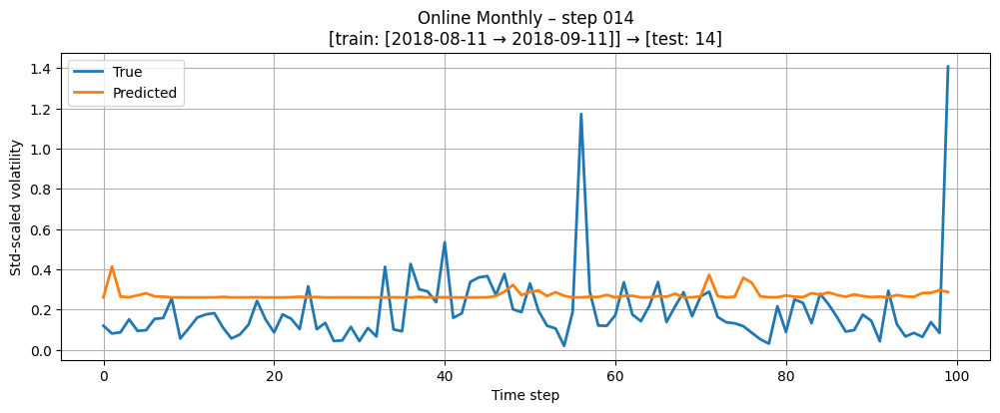

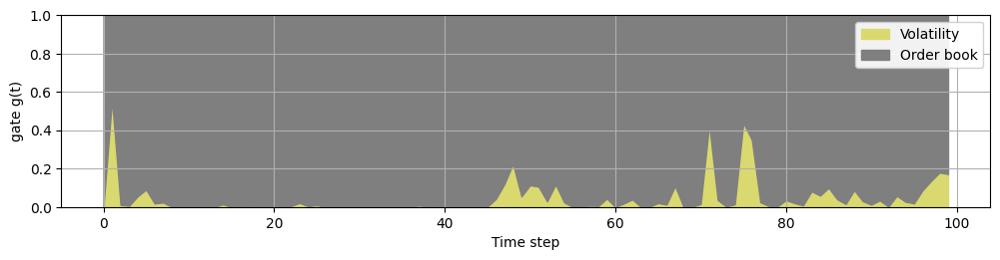

[online-monthly] Step 15: Train [2018-08-16 23:00:00 -> 2018-09-16 23:00:00], Test [2018-09-16 23:00:00 -> 2018-09-21 23:00:00]
Dataset created: 664 total points, 600 valid points after AR order 64
Target date range: 2018-08-19 16:00:00 to 2018-09-16 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-17 00:00:00 to 2018-09-21 23:00:00
[online-monthly] step 015  RMSE=0.5489  MAE=0.2675
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 120 predictions from 2018-09-17 00:00:00 to 2018-09-21 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_15.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


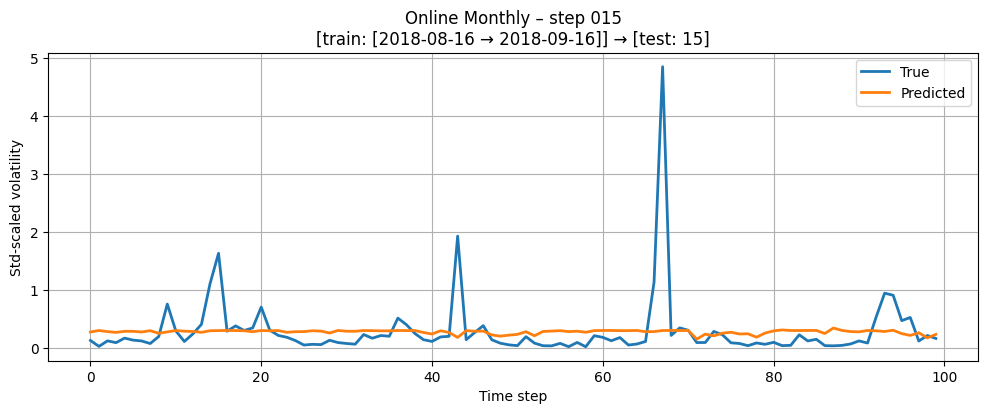

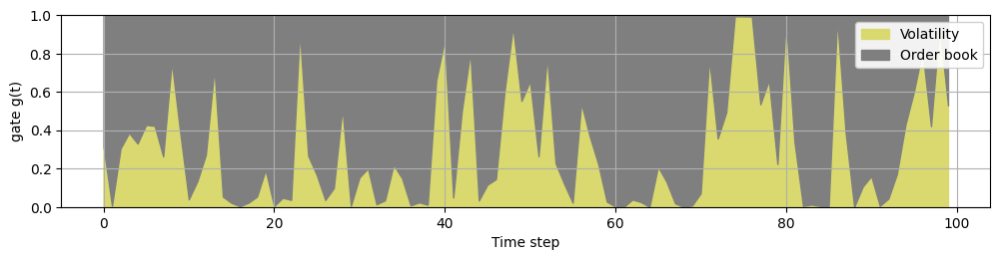

[online-monthly] Step 16: Train [2018-08-21 23:00:00 -> 2018-09-21 23:00:00], Test [2018-09-21 23:00:00 -> 2018-09-26 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-24 15:00:00 to 2018-09-21 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-22 00:00:00 to 2018-09-26 23:00:00
[online-monthly] step 016  RMSE=0.2141  MAE=0.1867
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 120 predictions from 2018-09-22 00:00:00 to 2018-09-26 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_16.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


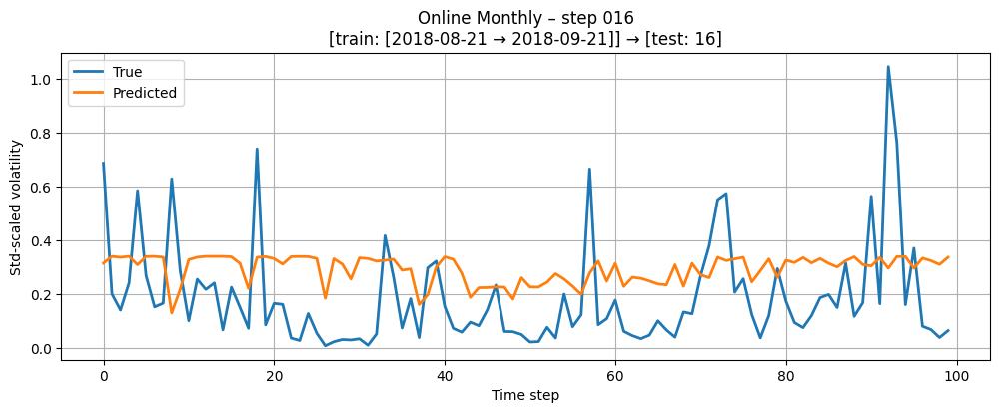

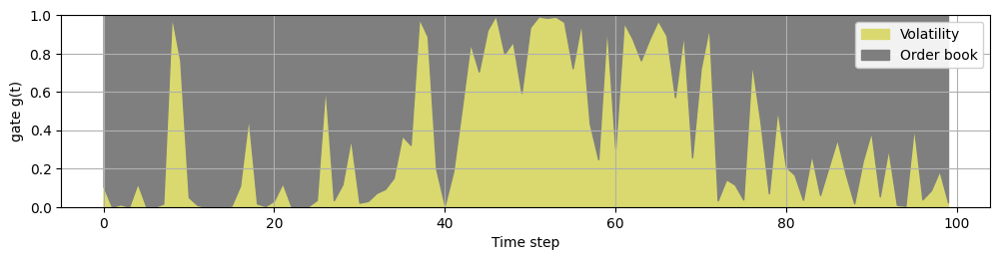

[online-monthly] Step 17: Train [2018-08-26 23:00:00 -> 2018-09-26 23:00:00], Test [2018-09-26 23:00:00 -> 2018-09-30 21:00:00]
Dataset created: 666 total points, 602 valid points after AR order 64
Target date range: 2018-08-29 15:00:00 to 2018-09-26 23:00:00
Dataset created: 93 total points, 93 valid points after AR order 64
Target date range: 2018-09-27 00:00:00 to 2018-09-30 21:00:00
[online-monthly] step 017  RMSE=0.2808  MAE=0.2022
Model saved to saved_models/online_monthly/inverse_gaussian/model.pt
Saving 93 predictions from 2018-09-27 00:00:00 to 2018-09-30 21:00:00
Residuals with dates saved to saved_residuals/online_monthly/inverse_gaussian/residuals_step_17.csv
Predictions saved to saved_predictions/online_monthly/inverse_gaussian/predictions.npy


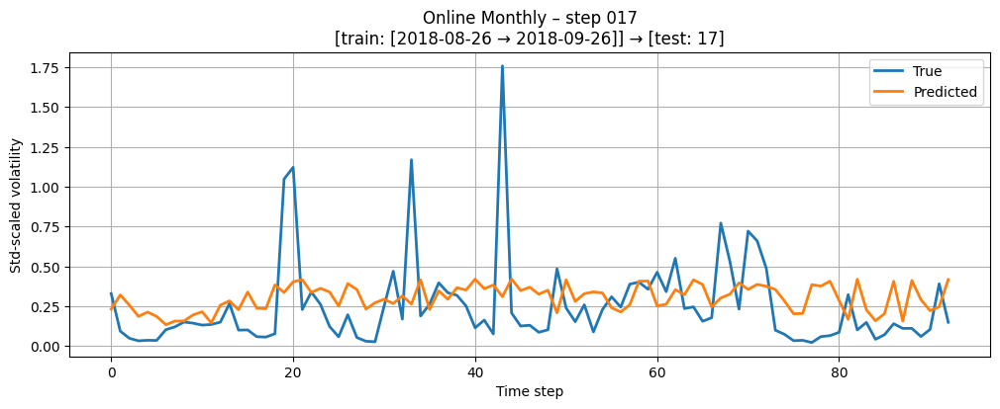

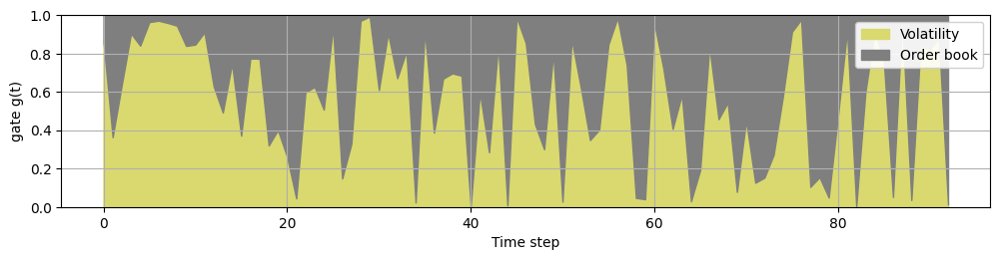

[online-monthly] finished 18 steps.

=== Training model: WEIBULL ===

[online-monthly] Step 0: Train [2018-06-04 23:00:00 -> 2018-06-30 22:00:00], Test [2018-06-30 22:00:00 -> 2018-07-08 23:00:00]
Dataset created: 621 total points, 621 valid points after AR order 64
Target date range: 2018-06-04 23:00:00 to 2018-06-30 22:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-07-03 23:00:00 to 2018-07-08 23:00:00
[online-monthly] step 000  RMSE=0.5386  MAE=0.3746
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 120 predictions from 2018-07-03 23:00:00 to 2018-07-08 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_0.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


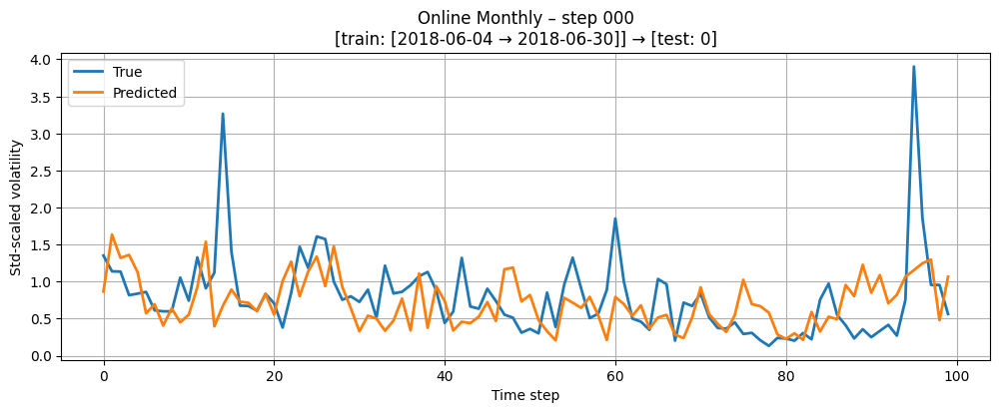

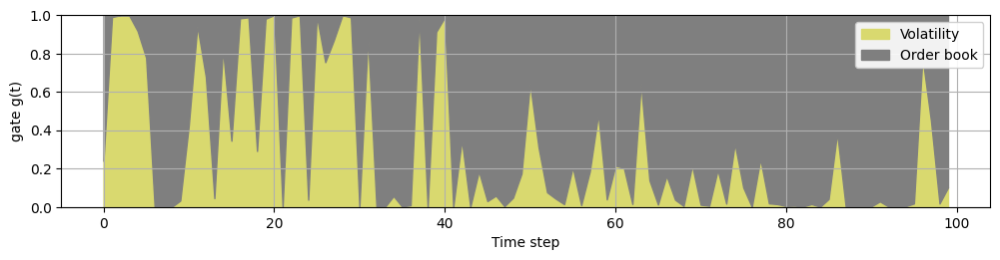

[online-monthly] Step 1: Train [2018-06-08 23:00:00 -> 2018-07-08 23:00:00], Test [2018-07-08 23:00:00 -> 2018-07-13 23:00:00]
Dataset created: 645 total points, 581 valid points after AR order 64
Target date range: 2018-06-11 17:00:00 to 2018-07-08 23:00:00
Dataset created: 117 total points, 117 valid points after AR order 64
Target date range: 2018-07-09 00:00:00 to 2018-07-13 23:00:00
[online-monthly] step 001  RMSE=0.5056  MAE=0.3267
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 117 predictions from 2018-07-09 00:00:00 to 2018-07-13 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_1.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


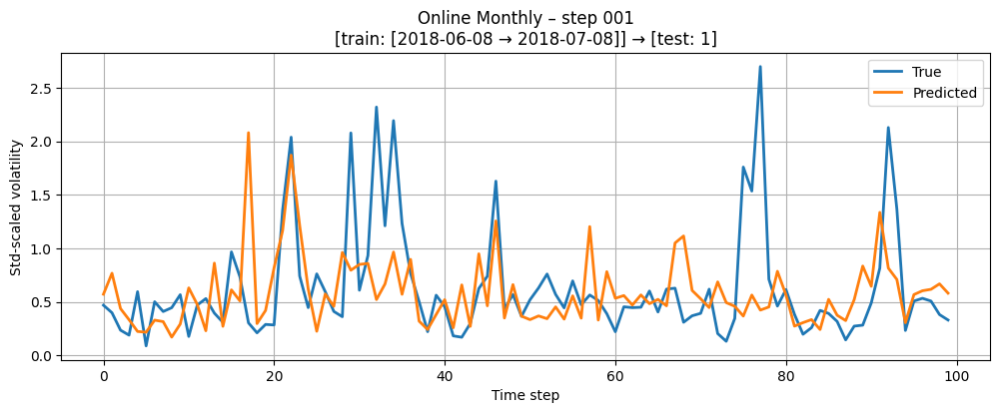

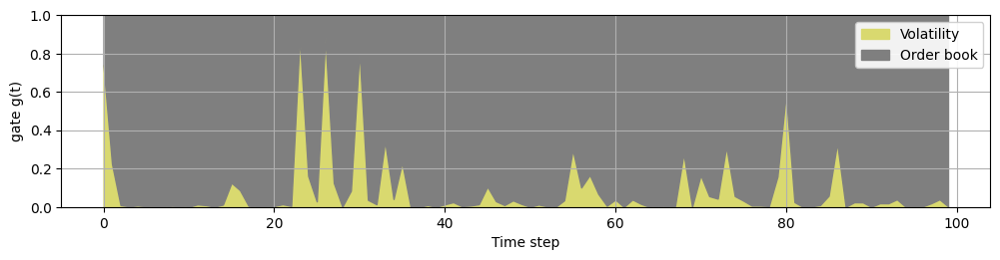

[online-monthly] Step 2: Train [2018-06-13 23:00:00 -> 2018-07-13 23:00:00], Test [2018-07-13 23:00:00 -> 2018-07-18 23:00:00]
Dataset created: 644 total points, 580 valid points after AR order 64
Target date range: 2018-06-16 15:00:00 to 2018-07-13 23:00:00
Dataset created: 103 total points, 103 valid points after AR order 64
Target date range: 2018-07-14 00:00:00 to 2018-07-18 23:00:00
[online-monthly] step 002  RMSE=6.9371  MAE=1.5360
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 103 predictions from 2018-07-14 00:00:00 to 2018-07-18 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_2.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


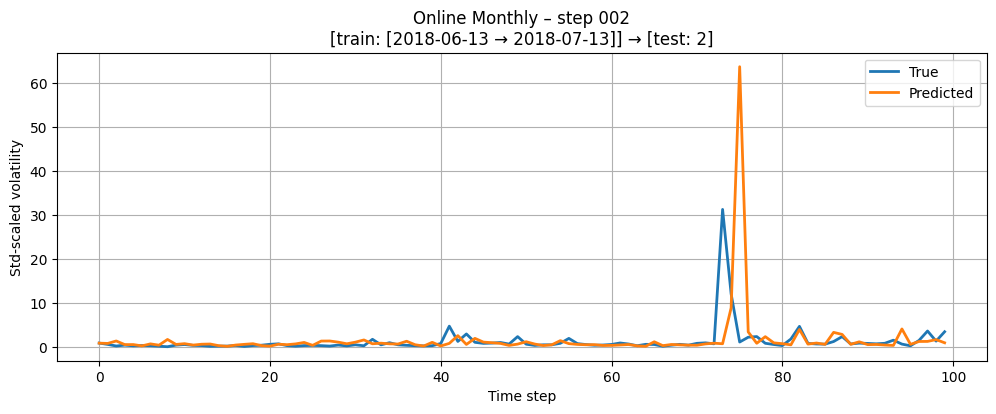

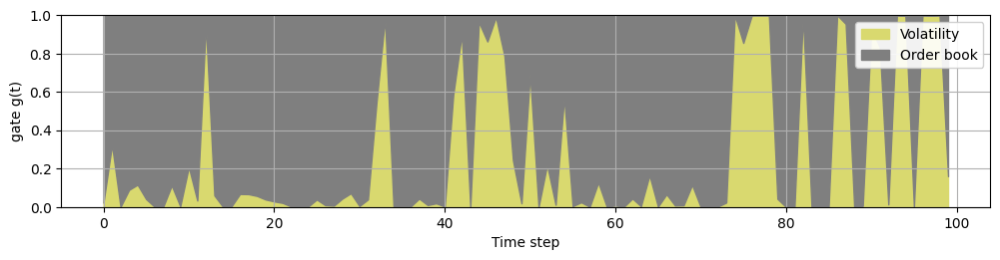

[online-monthly] Step 3: Train [2018-06-18 23:00:00 -> 2018-07-18 23:00:00], Test [2018-07-18 23:00:00 -> 2018-07-23 23:00:00]
Dataset created: 627 total points, 563 valid points after AR order 64
Target date range: 2018-06-21 15:00:00 to 2018-07-18 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-19 00:00:00 to 2018-07-23 23:00:00
[online-monthly] step 003  RMSE=92497.8279  MAE=8479.7295
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 119 predictions from 2018-07-19 00:00:00 to 2018-07-23 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_3.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


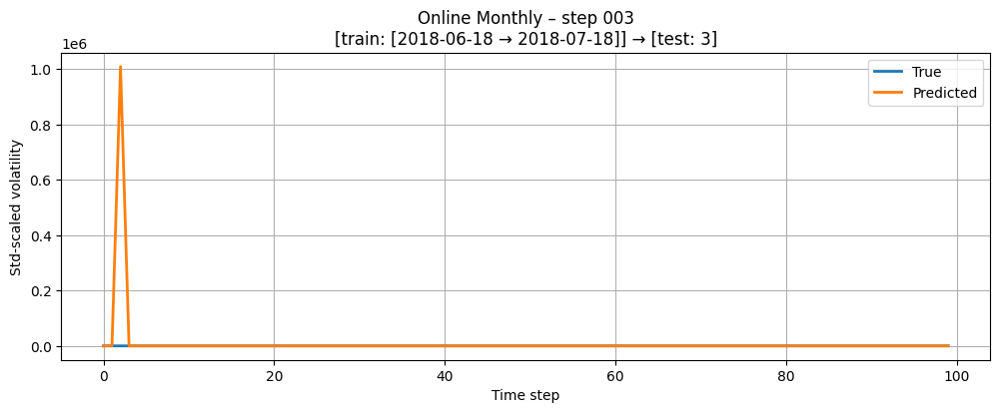

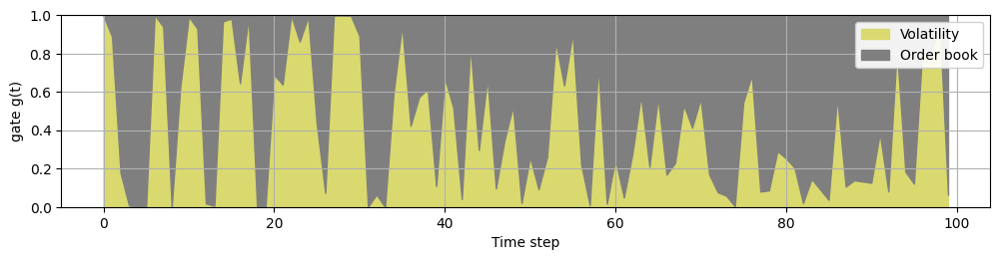

[online-monthly] Step 4: Train [2018-06-23 23:00:00 -> 2018-07-23 23:00:00], Test [2018-07-23 23:00:00 -> 2018-07-28 23:00:00]
Dataset created: 626 total points, 562 valid points after AR order 64
Target date range: 2018-06-26 15:00:00 to 2018-07-23 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-24 00:00:00 to 2018-07-28 23:00:00
[online-monthly] step 004  RMSE=0.5926  MAE=0.3875
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 119 predictions from 2018-07-24 00:00:00 to 2018-07-28 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_4.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


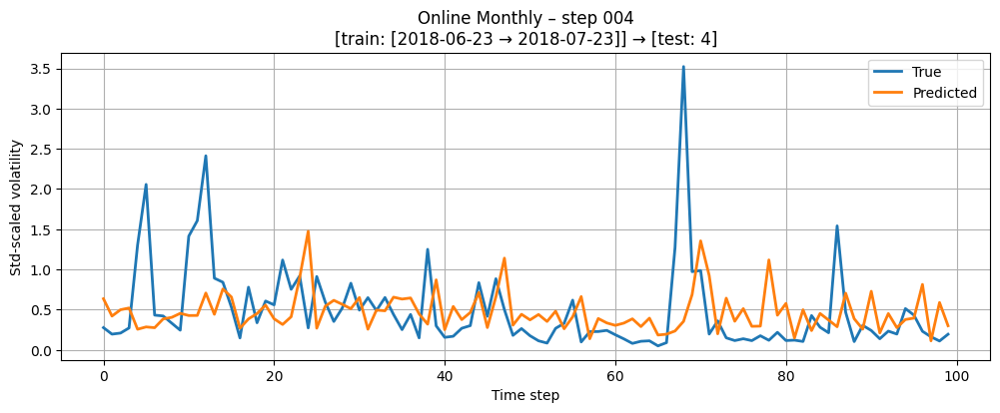

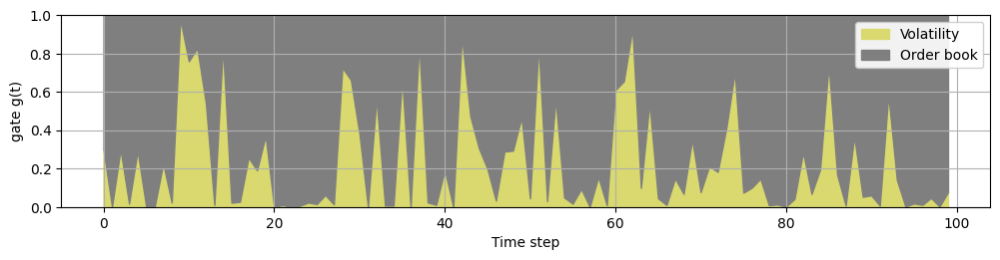

[online-monthly] Step 5: Train [2018-06-28 23:00:00 -> 2018-07-28 23:00:00], Test [2018-07-28 23:00:00 -> 2018-08-03 23:00:00]
Dataset created: 625 total points, 561 valid points after AR order 64
Target date range: 2018-07-04 16:00:00 to 2018-07-28 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-07-29 00:00:00 to 2018-08-03 23:00:00
[online-monthly] step 005  RMSE=0.4655  MAE=0.3175
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 72 predictions from 2018-07-29 00:00:00 to 2018-08-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_5.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


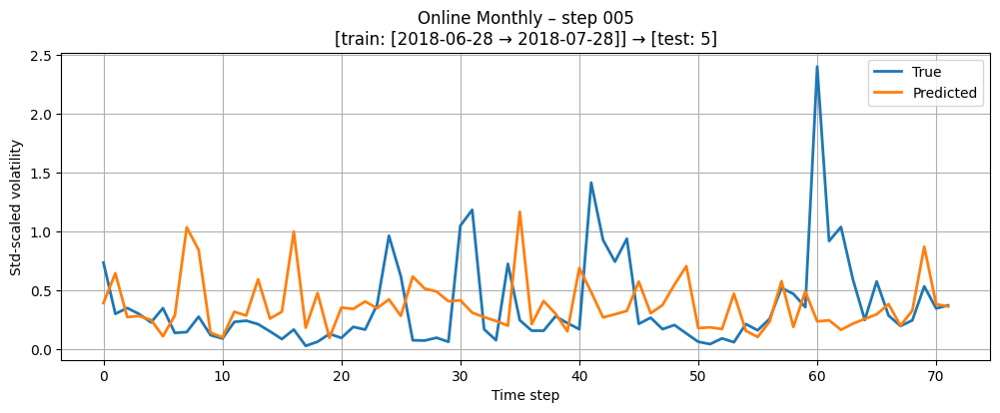

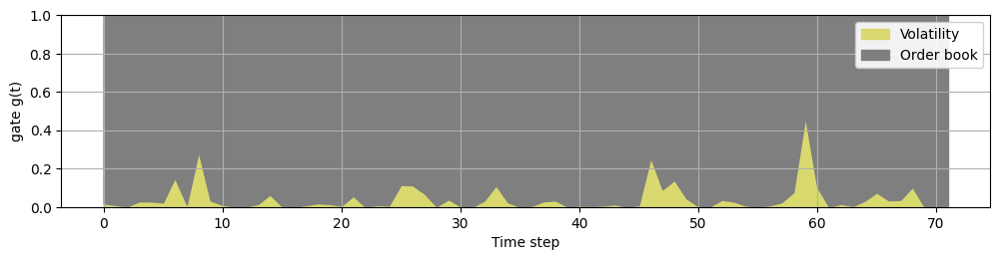

[online-monthly] Step 6: Train [2018-07-03 23:00:00 -> 2018-08-03 23:00:00], Test [2018-08-03 23:00:00 -> 2018-08-07 23:00:00]
Dataset created: 650 total points, 586 valid points after AR order 64
Target date range: 2018-07-06 16:00:00 to 2018-08-03 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-04 00:00:00 to 2018-08-07 23:00:00
[online-monthly] step 006  RMSE=0.5854  MAE=0.3144
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 96 predictions from 2018-08-04 00:00:00 to 2018-08-07 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_6.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


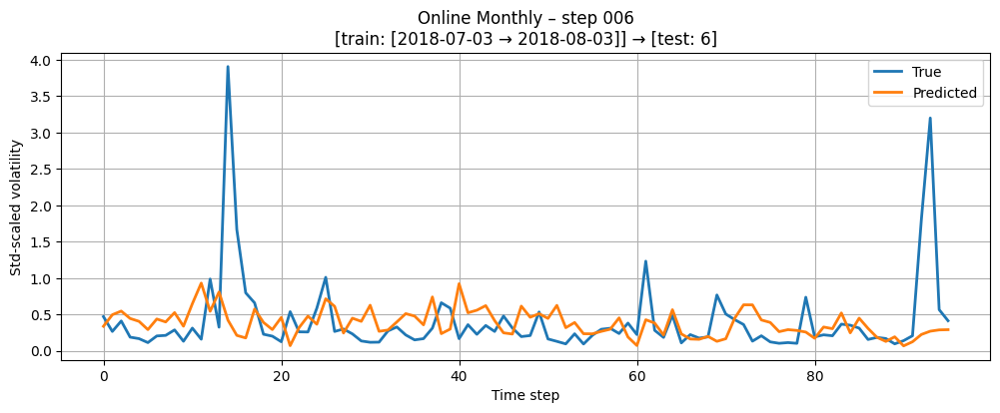

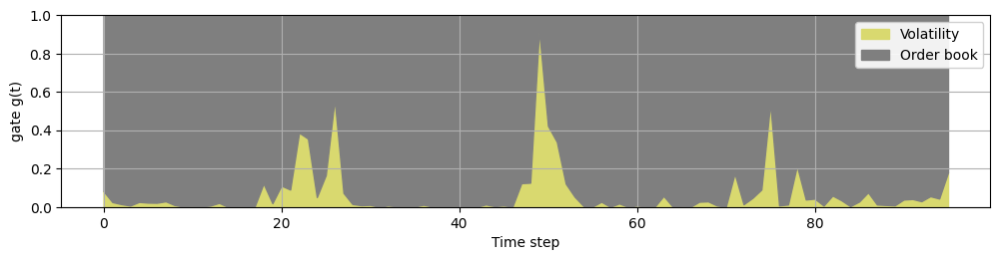

[online-monthly] Step 7: Train [2018-07-07 23:00:00 -> 2018-08-07 23:00:00], Test [2018-08-07 23:00:00 -> 2018-08-12 23:00:00]
Dataset created: 651 total points, 587 valid points after AR order 64
Target date range: 2018-07-10 16:00:00 to 2018-08-07 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-08 00:00:00 to 2018-08-12 23:00:00
[online-monthly] step 007  RMSE=1.4432  MAE=0.5921
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 120 predictions from 2018-08-08 00:00:00 to 2018-08-12 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_7.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


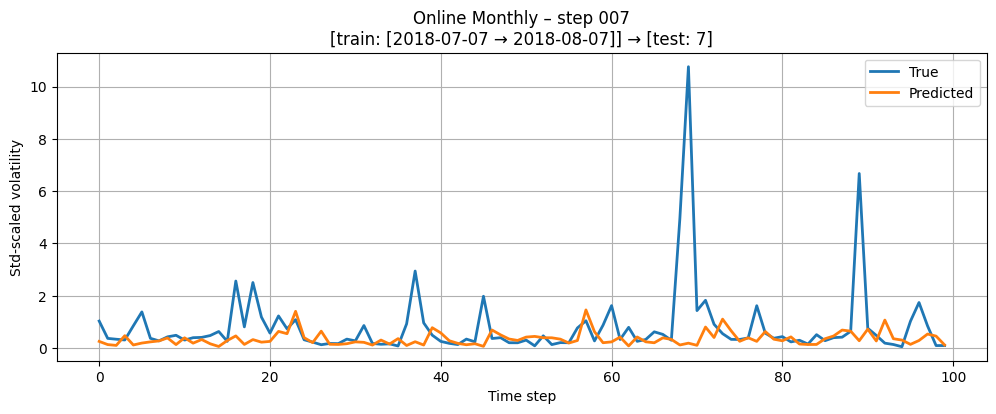

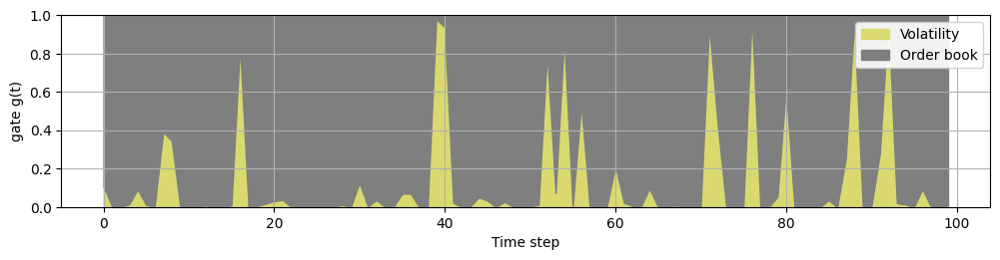

[online-monthly] Step 8: Train [2018-07-12 23:00:00 -> 2018-08-12 23:00:00], Test [2018-08-12 23:00:00 -> 2018-08-17 23:00:00]
Dataset created: 654 total points, 590 valid points after AR order 64
Target date range: 2018-07-15 15:00:00 to 2018-08-12 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-13 00:00:00 to 2018-08-17 23:00:00
[online-monthly] step 008  RMSE=0.4607  MAE=0.3348
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 119 predictions from 2018-08-13 00:00:00 to 2018-08-17 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_8.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


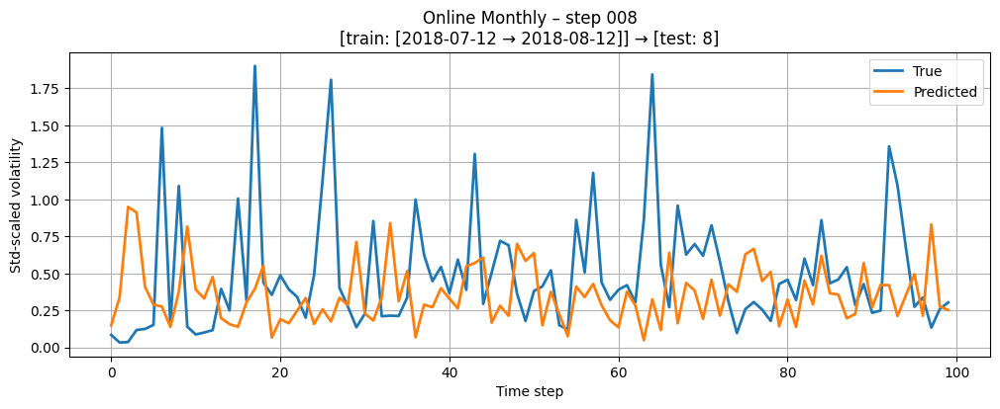

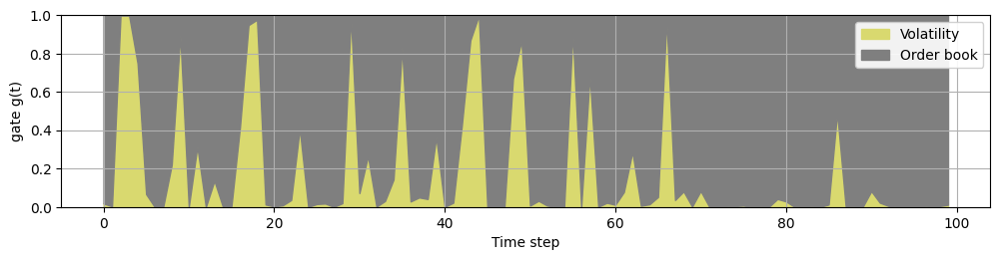

[online-monthly] Step 9: Train [2018-07-17 23:00:00 -> 2018-08-17 23:00:00], Test [2018-08-17 23:00:00 -> 2018-08-22 23:00:00]
Dataset created: 670 total points, 606 valid points after AR order 64
Target date range: 2018-07-20 16:00:00 to 2018-08-17 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-18 00:00:00 to 2018-08-22 23:00:00
[online-monthly] step 009  RMSE=2.4681  MAE=0.7345
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 120 predictions from 2018-08-18 00:00:00 to 2018-08-22 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_9.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


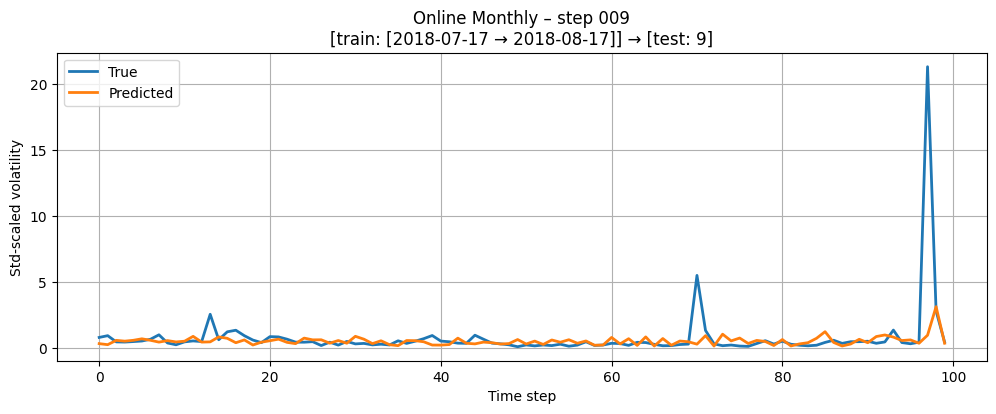

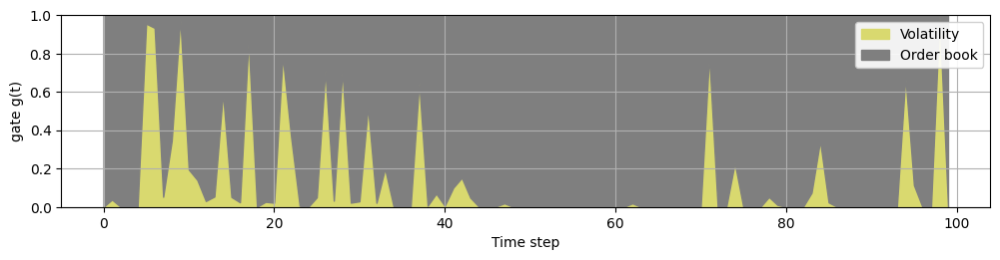

[online-monthly] Step 10: Train [2018-07-22 23:00:00 -> 2018-08-22 23:00:00], Test [2018-08-22 23:00:00 -> 2018-08-27 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-25 16:00:00 to 2018-08-22 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-23 00:00:00 to 2018-08-27 23:00:00
[online-monthly] step 010  RMSE=0.5911  MAE=0.3167
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 119 predictions from 2018-08-23 00:00:00 to 2018-08-27 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_10.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


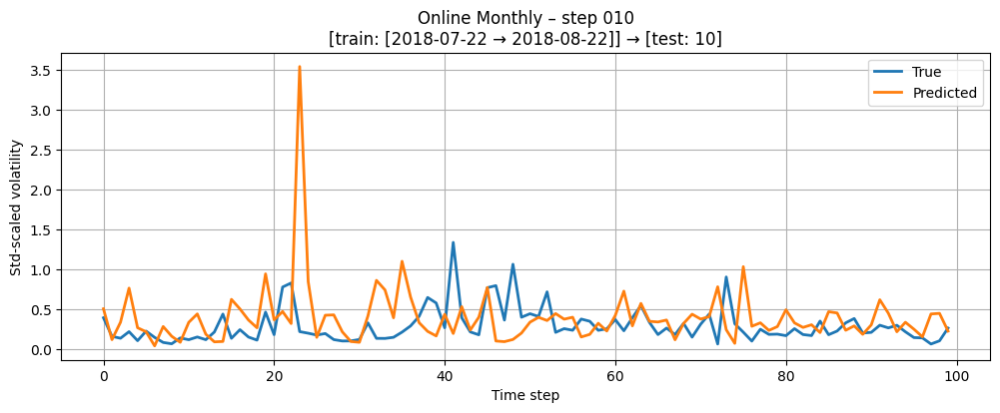

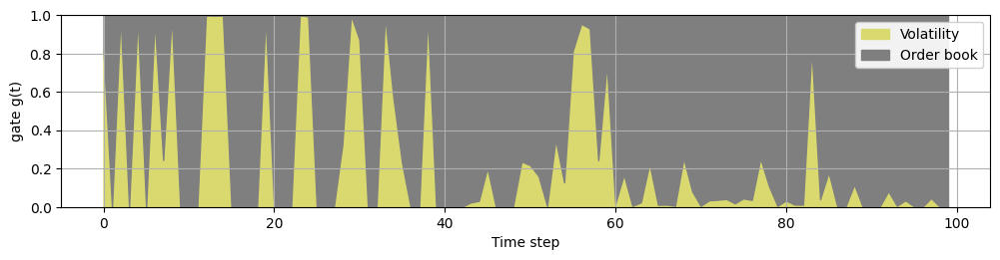

[online-monthly] Step 11: Train [2018-07-27 23:00:00 -> 2018-08-27 23:00:00], Test [2018-08-27 23:00:00 -> 2018-09-03 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-30 15:00:00 to 2018-08-27 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-28 00:00:00 to 2018-09-03 23:00:00
[online-monthly] step 011  RMSE=0.3959  MAE=0.2672
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 96 predictions from 2018-08-28 00:00:00 to 2018-09-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_11.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


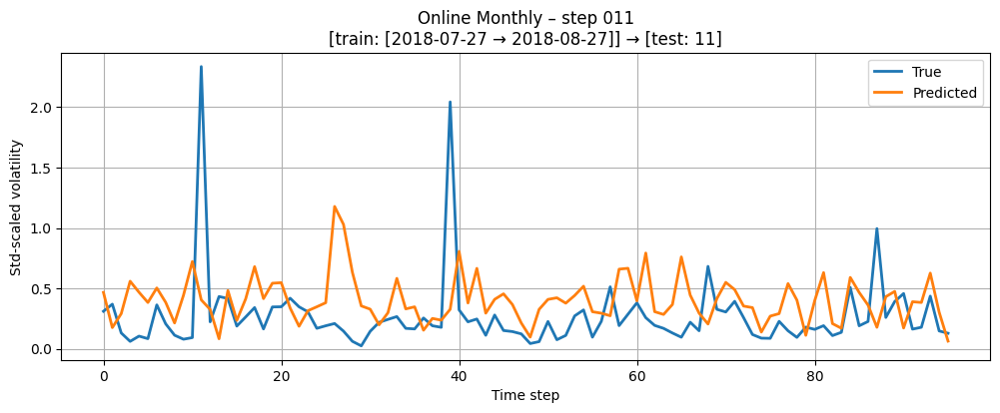

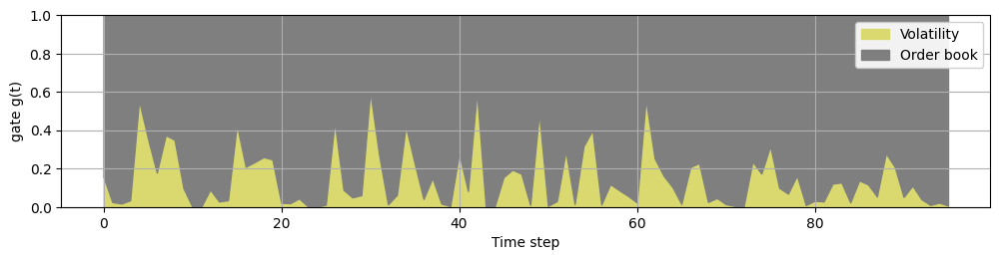

[online-monthly] Step 12: Train [2018-08-03 23:00:00 -> 2018-09-03 23:00:00], Test [2018-09-03 23:00:00 -> 2018-09-06 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-06 15:00:00 to 2018-09-03 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-09-04 00:00:00 to 2018-09-06 23:00:00
[online-monthly] step 012  RMSE=2.3762  MAE=0.8064
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 72 predictions from 2018-09-04 00:00:00 to 2018-09-06 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_12.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


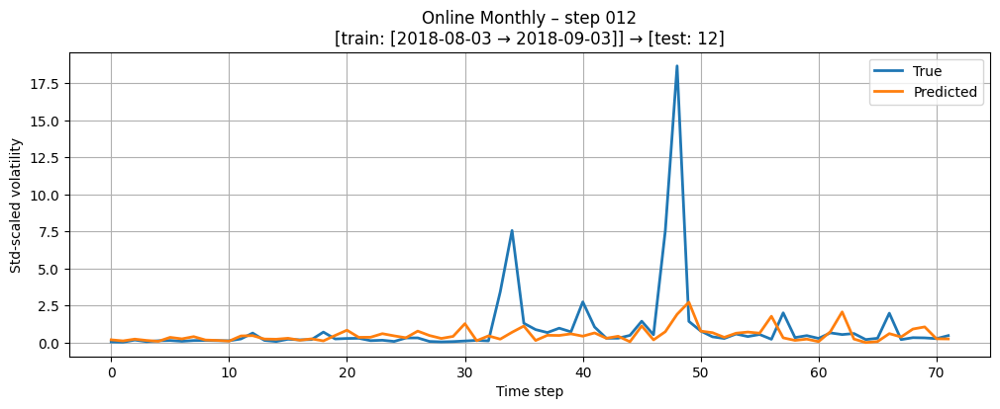

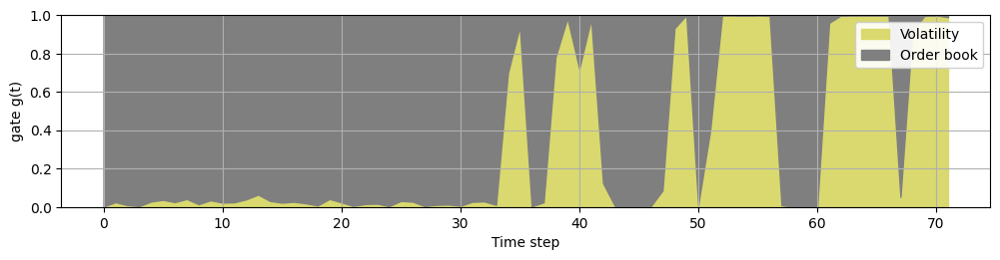

[online-monthly] Step 13: Train [2018-08-06 23:00:00 -> 2018-09-06 23:00:00], Test [2018-09-06 23:00:00 -> 2018-09-11 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-09 15:00:00 to 2018-09-06 23:00:00
Dataset created: 114 total points, 114 valid points after AR order 64
Target date range: 2018-09-07 00:00:00 to 2018-09-11 23:00:00
[online-monthly] step 013  RMSE=0.6279  MAE=0.3050
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 114 predictions from 2018-09-07 00:00:00 to 2018-09-11 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_13.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


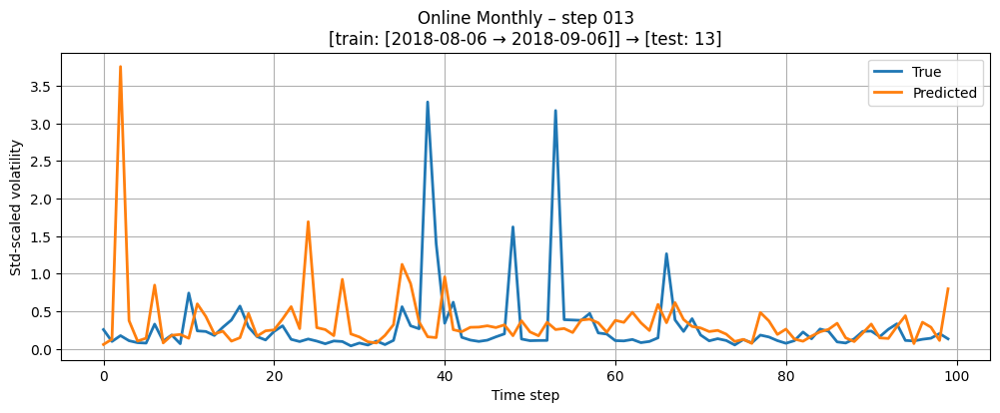

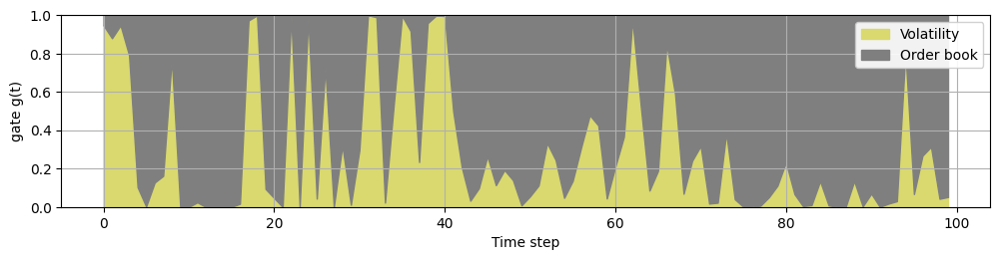

[online-monthly] Step 14: Train [2018-08-11 23:00:00 -> 2018-09-11 23:00:00], Test [2018-09-11 23:00:00 -> 2018-09-16 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-14 15:00:00 to 2018-09-11 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-09-12 00:00:00 to 2018-09-16 23:00:00
[online-monthly] step 014  RMSE=0.2156  MAE=0.1459
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 119 predictions from 2018-09-12 00:00:00 to 2018-09-16 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_14.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


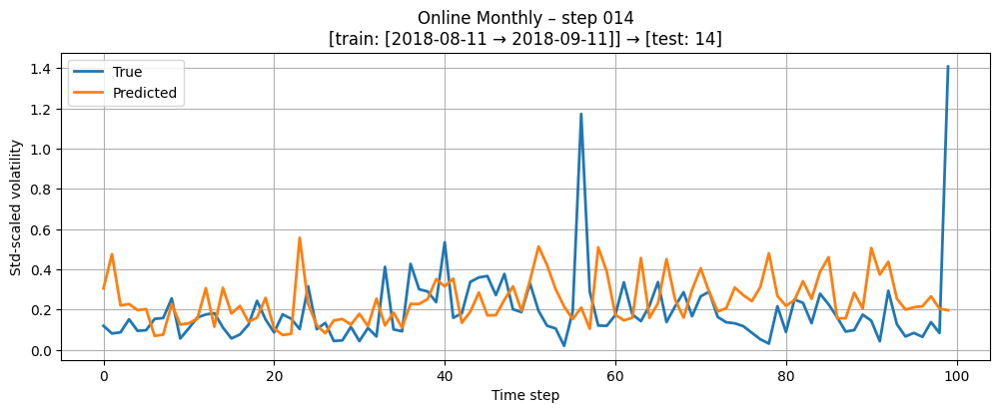

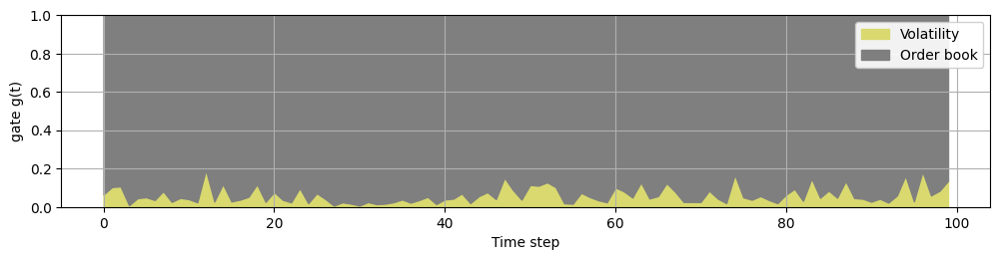

[online-monthly] Step 15: Train [2018-08-16 23:00:00 -> 2018-09-16 23:00:00], Test [2018-09-16 23:00:00 -> 2018-09-21 23:00:00]
Dataset created: 664 total points, 600 valid points after AR order 64
Target date range: 2018-08-19 16:00:00 to 2018-09-16 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-17 00:00:00 to 2018-09-21 23:00:00
[online-monthly] step 015  RMSE=0.5589  MAE=0.2563
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 120 predictions from 2018-09-17 00:00:00 to 2018-09-21 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_15.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


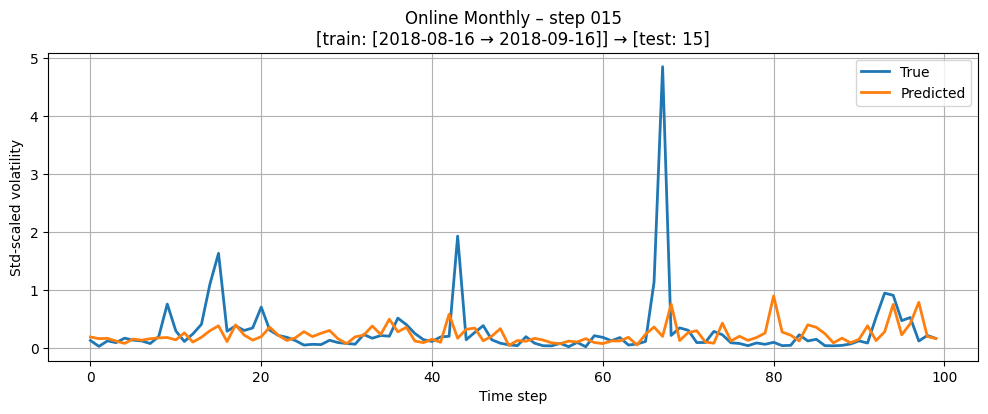

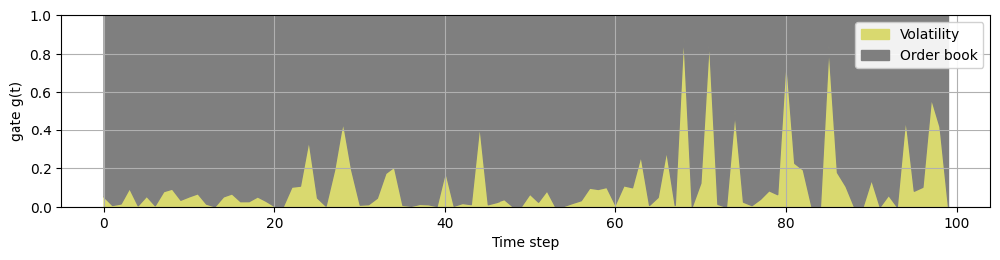

[online-monthly] Step 16: Train [2018-08-21 23:00:00 -> 2018-09-21 23:00:00], Test [2018-09-21 23:00:00 -> 2018-09-26 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-24 15:00:00 to 2018-09-21 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-22 00:00:00 to 2018-09-26 23:00:00
[online-monthly] step 016  RMSE=0.2166  MAE=0.1682
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 120 predictions from 2018-09-22 00:00:00 to 2018-09-26 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_16.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


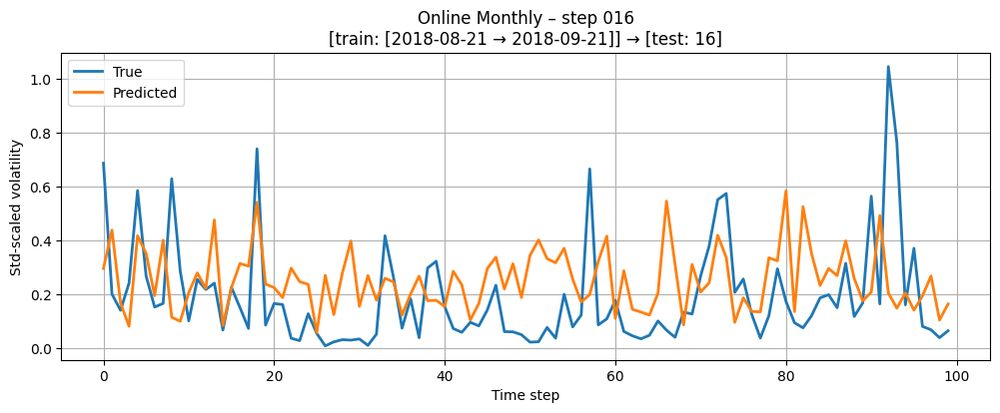

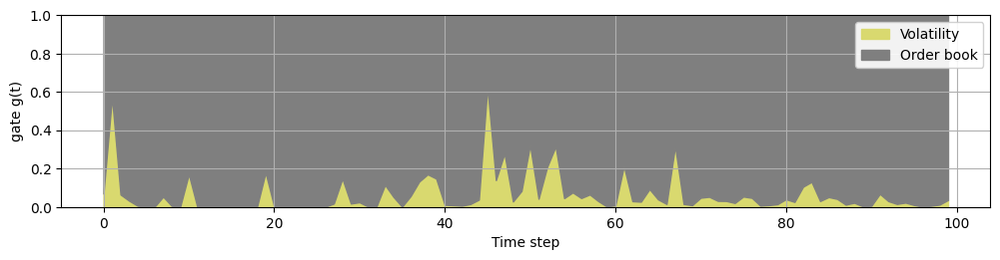

[online-monthly] Step 17: Train [2018-08-26 23:00:00 -> 2018-09-26 23:00:00], Test [2018-09-26 23:00:00 -> 2018-09-30 21:00:00]
Dataset created: 666 total points, 602 valid points after AR order 64
Target date range: 2018-08-29 15:00:00 to 2018-09-26 23:00:00
Dataset created: 93 total points, 93 valid points after AR order 64
Target date range: 2018-09-27 00:00:00 to 2018-09-30 21:00:00
[online-monthly] step 017  RMSE=0.3119  MAE=0.2088
Model saved to saved_models/online_monthly/weibull/model.pt
Saving 93 predictions from 2018-09-27 00:00:00 to 2018-09-30 21:00:00
Residuals with dates saved to saved_residuals/online_monthly/weibull/residuals_step_17.csv
Predictions saved to saved_predictions/online_monthly/weibull/predictions.npy


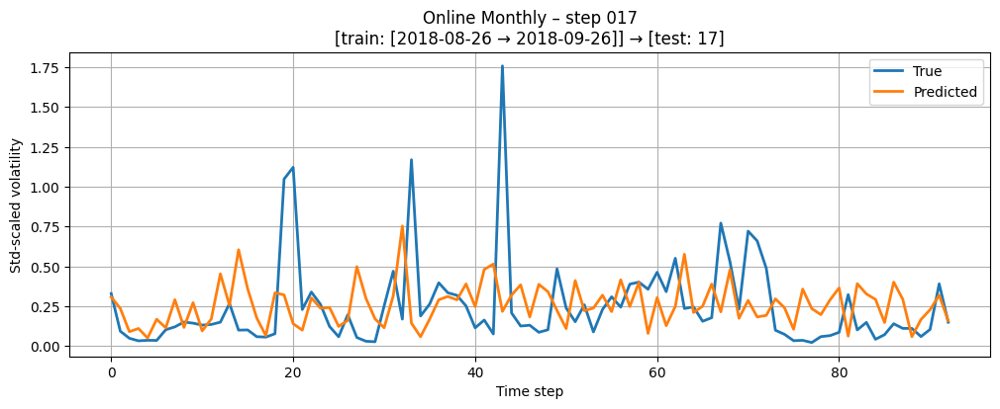

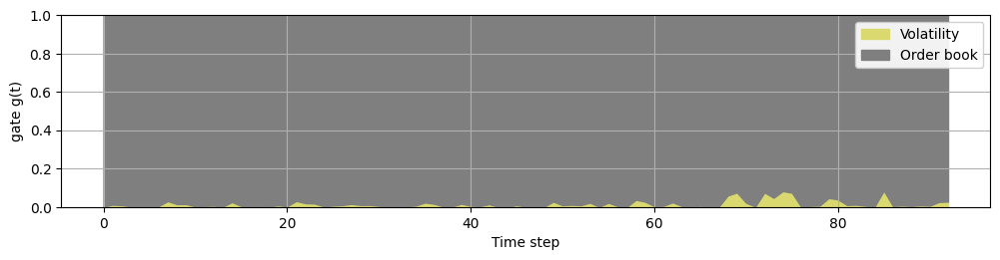

[online-monthly] finished 18 steps.

=== Training model: HINGE_WEIBULL ===

[online-monthly] Step 0: Train [2018-06-04 23:00:00 -> 2018-06-30 22:00:00], Test [2018-06-30 22:00:00 -> 2018-07-08 23:00:00]
Dataset created: 621 total points, 621 valid points after AR order 64
Target date range: 2018-06-04 23:00:00 to 2018-06-30 22:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-07-03 23:00:00 to 2018-07-08 23:00:00
[online-monthly] step 000  RMSE=0.6547  MAE=0.4407
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 120 predictions from 2018-07-03 23:00:00 to 2018-07-08 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_0.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


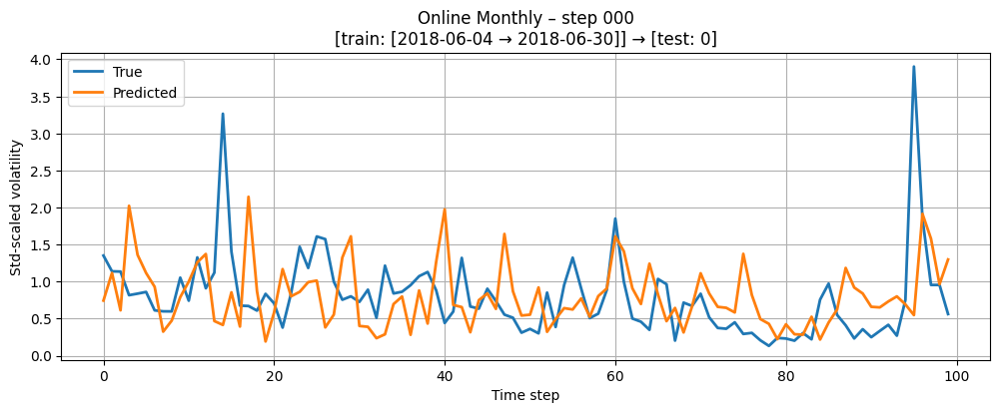

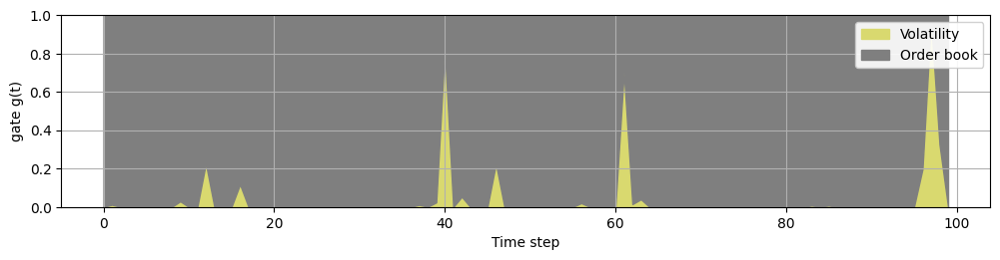

[online-monthly] Step 1: Train [2018-06-08 23:00:00 -> 2018-07-08 23:00:00], Test [2018-07-08 23:00:00 -> 2018-07-13 23:00:00]
Dataset created: 645 total points, 581 valid points after AR order 64
Target date range: 2018-06-11 17:00:00 to 2018-07-08 23:00:00
Dataset created: 117 total points, 117 valid points after AR order 64
Target date range: 2018-07-09 00:00:00 to 2018-07-13 23:00:00
[online-monthly] step 001  RMSE=0.5118  MAE=0.3554
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 117 predictions from 2018-07-09 00:00:00 to 2018-07-13 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_1.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


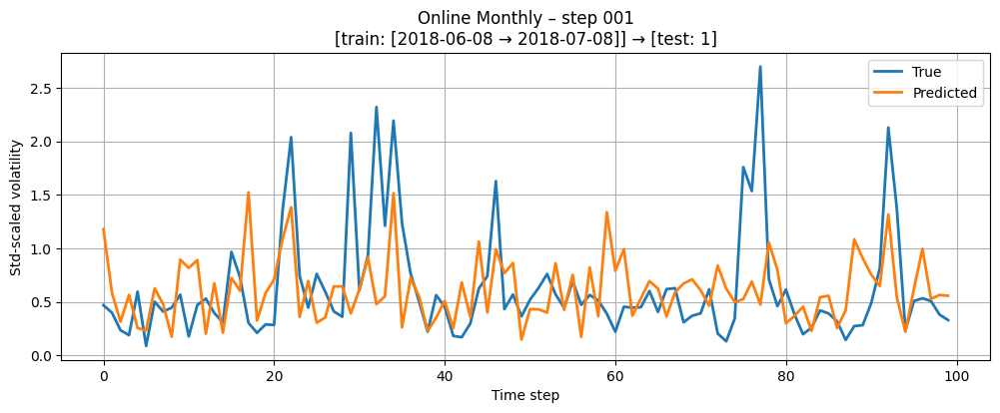

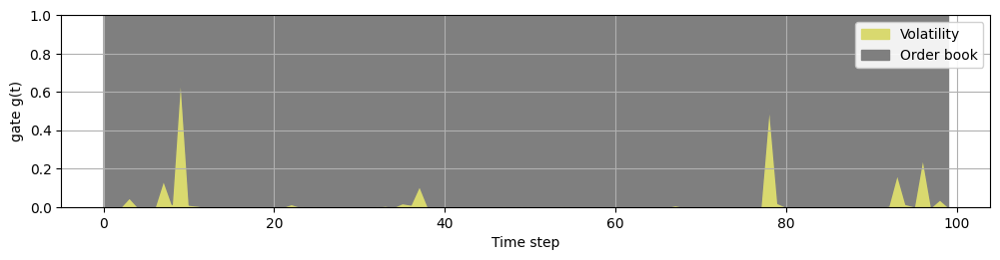

[online-monthly] Step 2: Train [2018-06-13 23:00:00 -> 2018-07-13 23:00:00], Test [2018-07-13 23:00:00 -> 2018-07-18 23:00:00]
Dataset created: 644 total points, 580 valid points after AR order 64
Target date range: 2018-06-16 15:00:00 to 2018-07-13 23:00:00
Dataset created: 103 total points, 103 valid points after AR order 64
Target date range: 2018-07-14 00:00:00 to 2018-07-18 23:00:00
[online-monthly] step 002  RMSE=3.3650  MAE=1.0914
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 103 predictions from 2018-07-14 00:00:00 to 2018-07-18 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_2.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


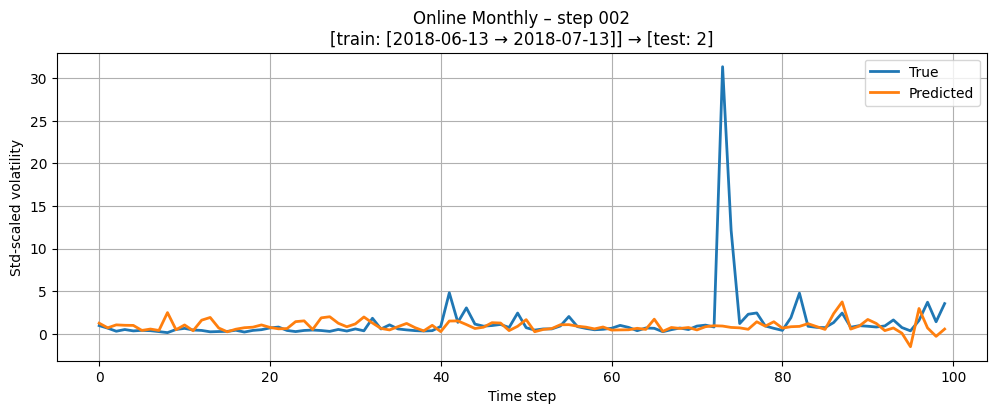

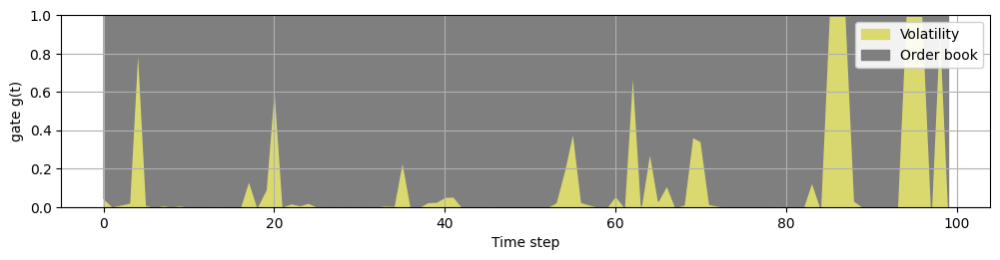

[online-monthly] Step 3: Train [2018-06-18 23:00:00 -> 2018-07-18 23:00:00], Test [2018-07-18 23:00:00 -> 2018-07-23 23:00:00]
Dataset created: 627 total points, 563 valid points after AR order 64
Target date range: 2018-06-21 15:00:00 to 2018-07-18 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-19 00:00:00 to 2018-07-23 23:00:00
[online-monthly] step 003  RMSE=0.8117  MAE=0.5206
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 119 predictions from 2018-07-19 00:00:00 to 2018-07-23 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_3.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


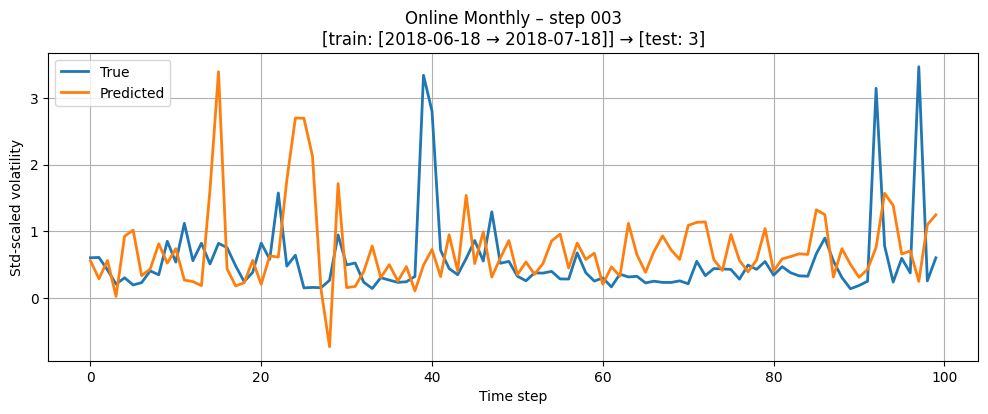

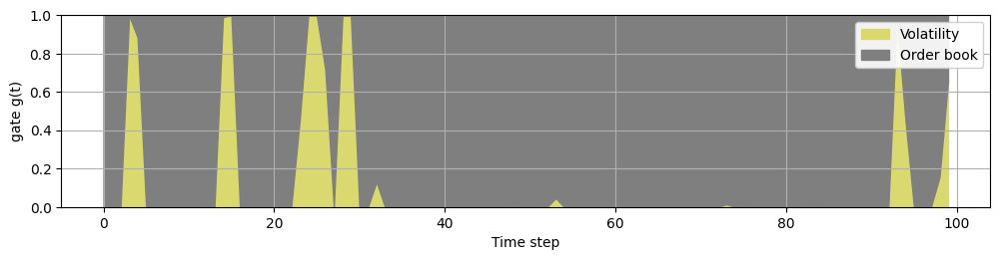

[online-monthly] Step 4: Train [2018-06-23 23:00:00 -> 2018-07-23 23:00:00], Test [2018-07-23 23:00:00 -> 2018-07-28 23:00:00]
Dataset created: 626 total points, 562 valid points after AR order 64
Target date range: 2018-06-26 15:00:00 to 2018-07-23 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-24 00:00:00 to 2018-07-28 23:00:00
[online-monthly] step 004  RMSE=0.5699  MAE=0.3916
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 119 predictions from 2018-07-24 00:00:00 to 2018-07-28 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_4.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


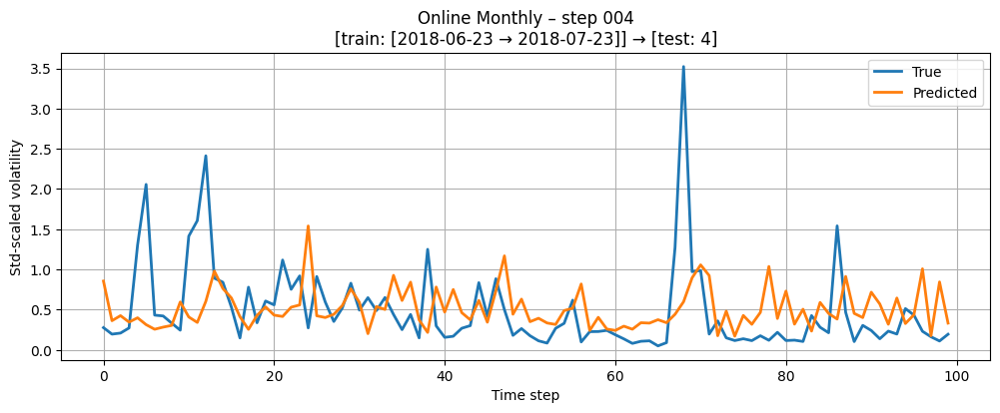

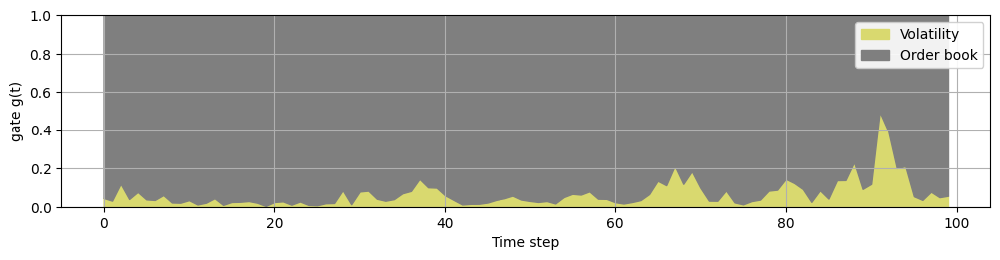

[online-monthly] Step 5: Train [2018-06-28 23:00:00 -> 2018-07-28 23:00:00], Test [2018-07-28 23:00:00 -> 2018-08-03 23:00:00]
Dataset created: 625 total points, 561 valid points after AR order 64
Target date range: 2018-07-04 16:00:00 to 2018-07-28 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-07-29 00:00:00 to 2018-08-03 23:00:00
[online-monthly] step 005  RMSE=0.4037  MAE=0.2741
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 72 predictions from 2018-07-29 00:00:00 to 2018-08-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_5.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


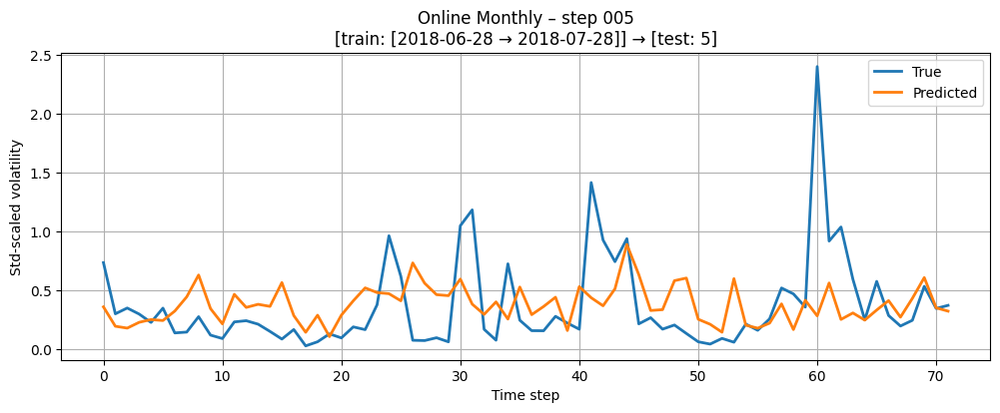

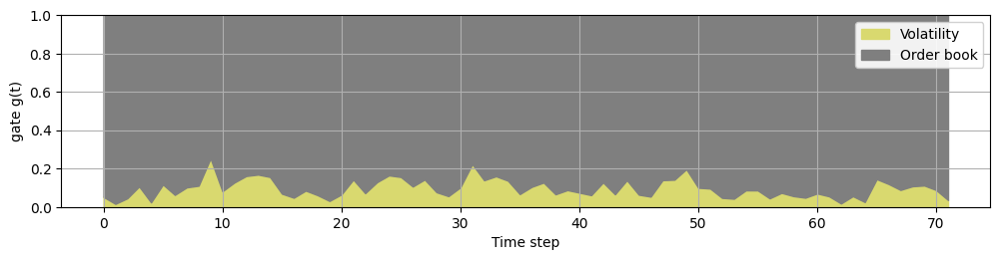

[online-monthly] Step 6: Train [2018-07-03 23:00:00 -> 2018-08-03 23:00:00], Test [2018-08-03 23:00:00 -> 2018-08-07 23:00:00]
Dataset created: 650 total points, 586 valid points after AR order 64
Target date range: 2018-07-06 16:00:00 to 2018-08-03 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-04 00:00:00 to 2018-08-07 23:00:00
[online-monthly] step 006  RMSE=0.5827  MAE=0.3185
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 96 predictions from 2018-08-04 00:00:00 to 2018-08-07 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_6.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


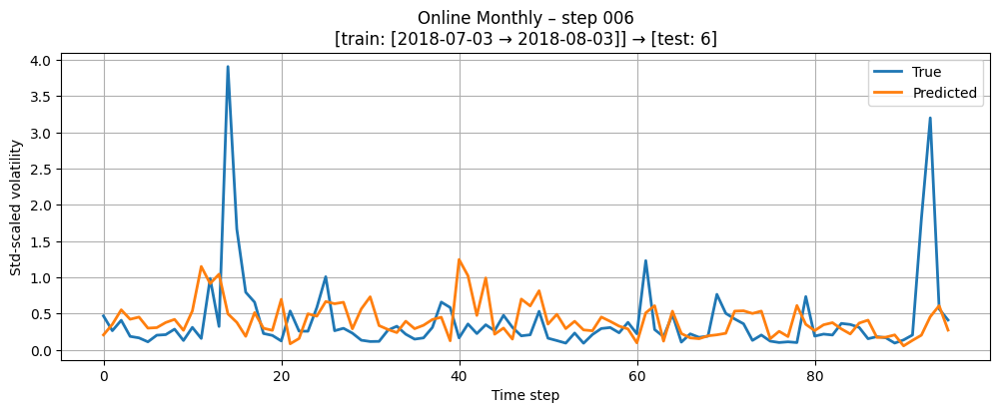

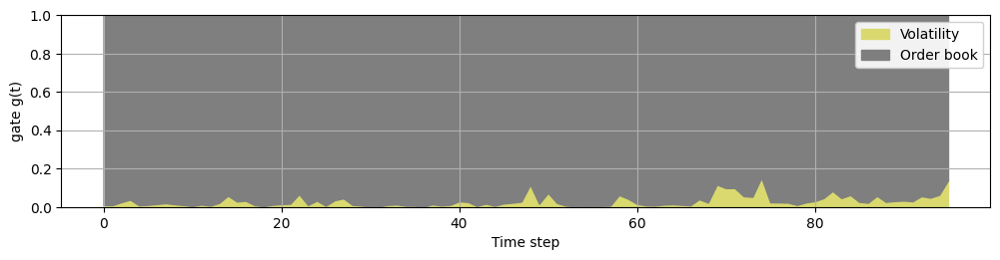

[online-monthly] Step 7: Train [2018-07-07 23:00:00 -> 2018-08-07 23:00:00], Test [2018-08-07 23:00:00 -> 2018-08-12 23:00:00]
Dataset created: 651 total points, 587 valid points after AR order 64
Target date range: 2018-07-10 16:00:00 to 2018-08-07 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-08 00:00:00 to 2018-08-12 23:00:00
[online-monthly] step 007  RMSE=1.4401  MAE=0.5964
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 120 predictions from 2018-08-08 00:00:00 to 2018-08-12 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_7.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


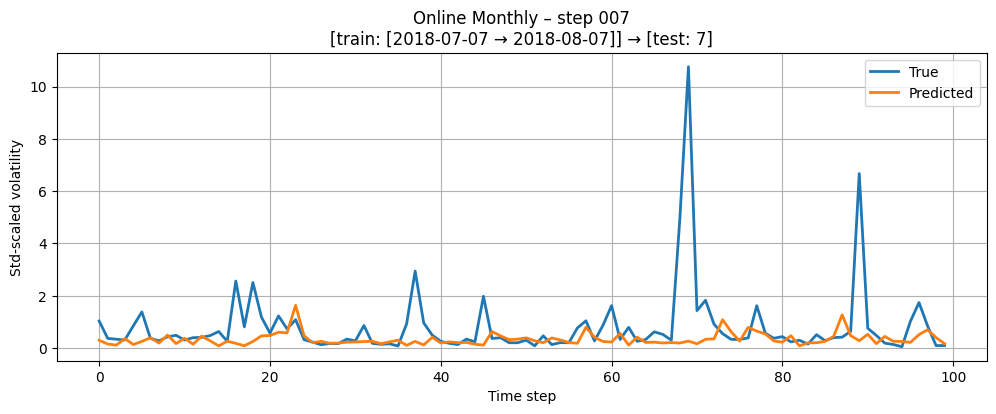

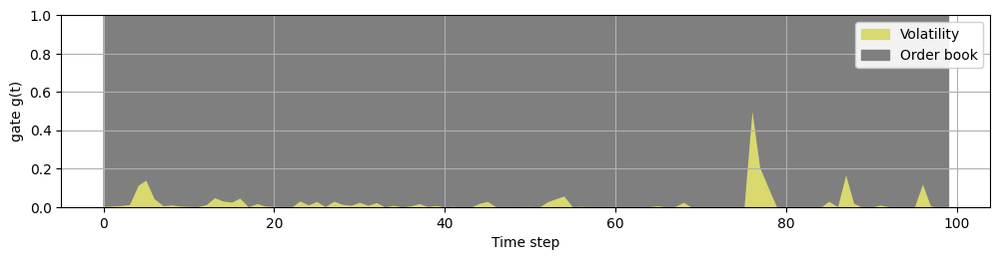

[online-monthly] Step 8: Train [2018-07-12 23:00:00 -> 2018-08-12 23:00:00], Test [2018-08-12 23:00:00 -> 2018-08-17 23:00:00]
Dataset created: 654 total points, 590 valid points after AR order 64
Target date range: 2018-07-15 15:00:00 to 2018-08-12 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-13 00:00:00 to 2018-08-17 23:00:00
[online-monthly] step 008  RMSE=0.4474  MAE=0.3107
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 119 predictions from 2018-08-13 00:00:00 to 2018-08-17 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_8.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


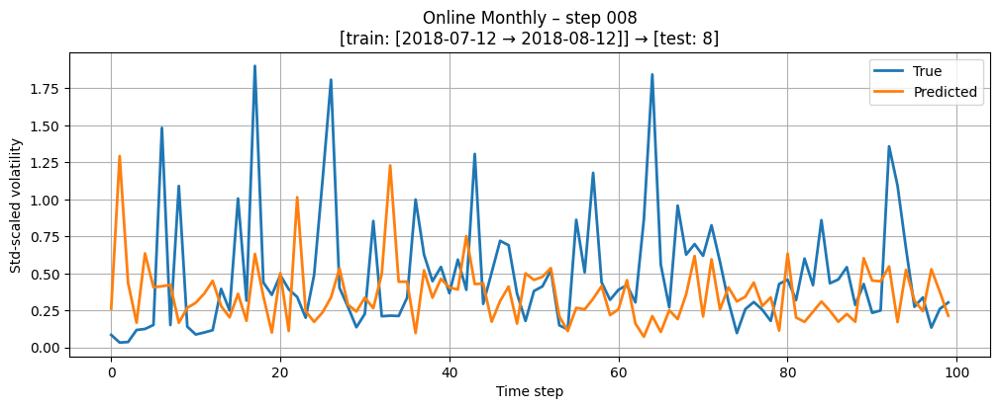

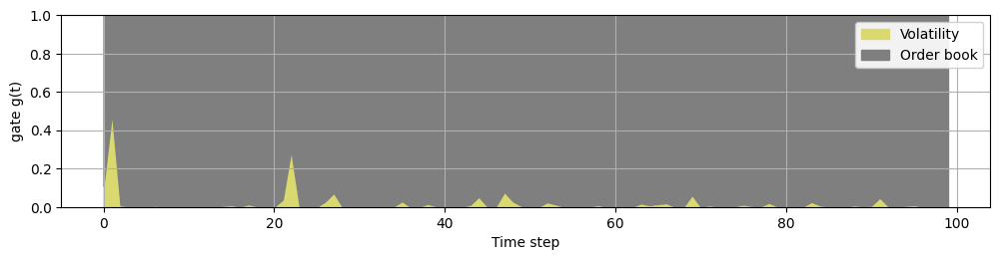

[online-monthly] Step 9: Train [2018-07-17 23:00:00 -> 2018-08-17 23:00:00], Test [2018-08-17 23:00:00 -> 2018-08-22 23:00:00]
Dataset created: 670 total points, 606 valid points after AR order 64
Target date range: 2018-07-20 16:00:00 to 2018-08-17 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-18 00:00:00 to 2018-08-22 23:00:00
[online-monthly] step 009  RMSE=2.1429  MAE=0.6474
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 120 predictions from 2018-08-18 00:00:00 to 2018-08-22 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_9.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


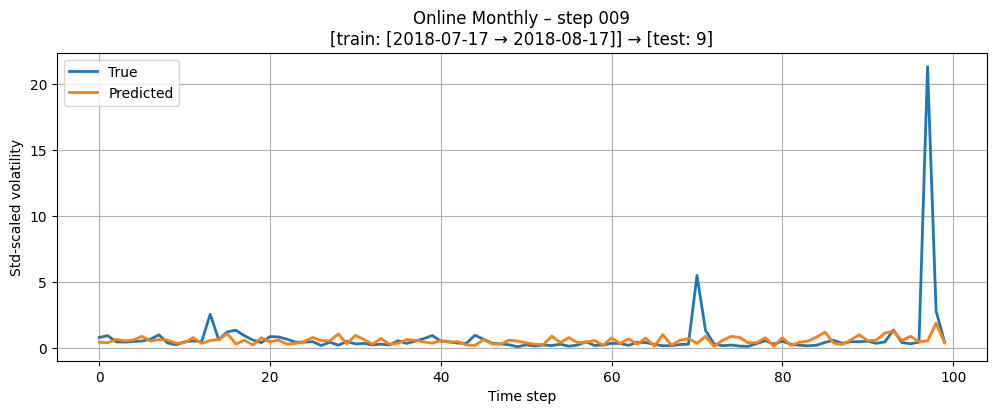

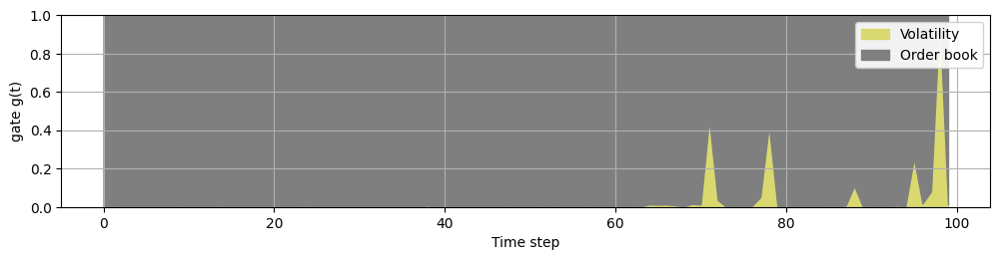

[online-monthly] Step 10: Train [2018-07-22 23:00:00 -> 2018-08-22 23:00:00], Test [2018-08-22 23:00:00 -> 2018-08-27 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-25 16:00:00 to 2018-08-22 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-23 00:00:00 to 2018-08-27 23:00:00
[online-monthly] step 010  RMSE=0.5002  MAE=0.2743
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 119 predictions from 2018-08-23 00:00:00 to 2018-08-27 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_10.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


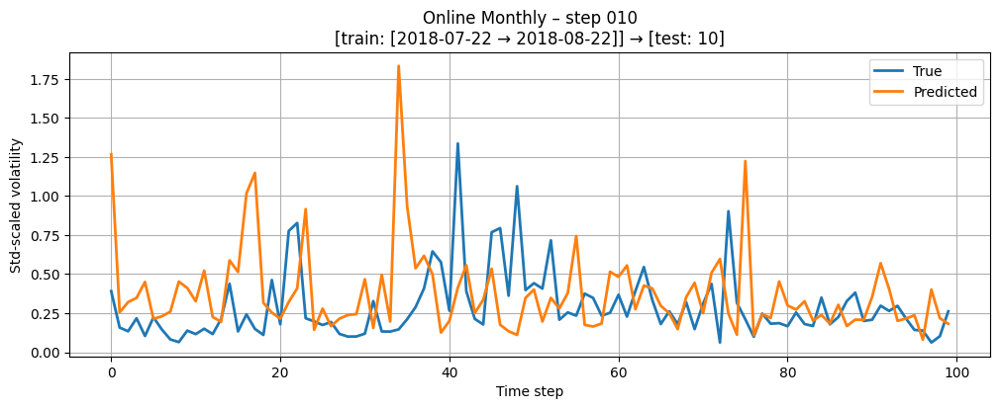

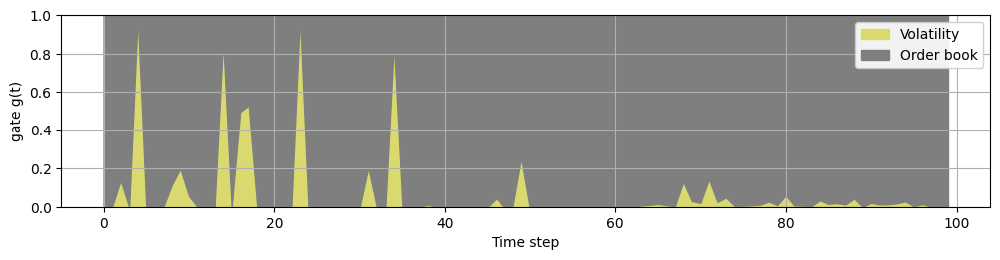

[online-monthly] Step 11: Train [2018-07-27 23:00:00 -> 2018-08-27 23:00:00], Test [2018-08-27 23:00:00 -> 2018-09-03 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-30 15:00:00 to 2018-08-27 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-28 00:00:00 to 2018-09-03 23:00:00
[online-monthly] step 011  RMSE=0.4028  MAE=0.2569
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 96 predictions from 2018-08-28 00:00:00 to 2018-09-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_11.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


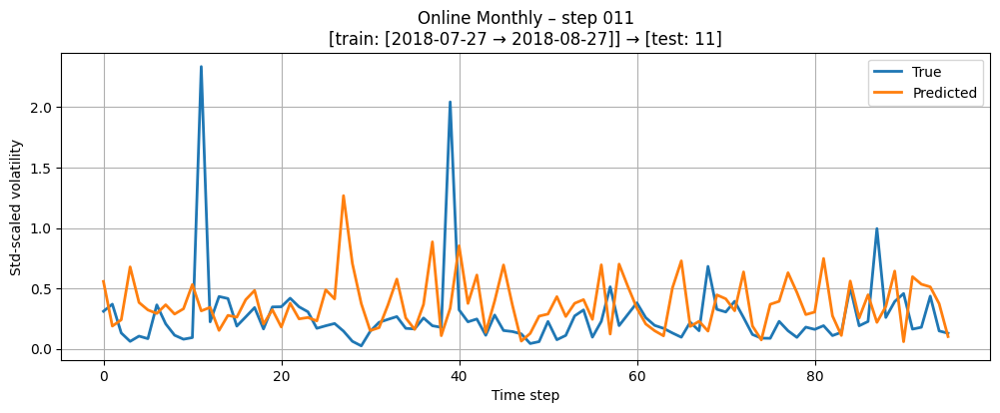

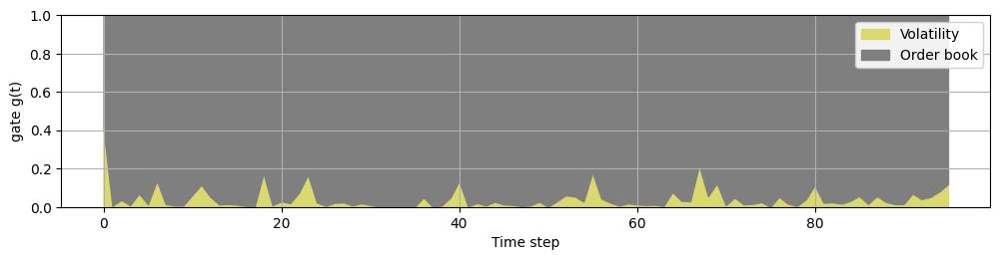

[online-monthly] Step 12: Train [2018-08-03 23:00:00 -> 2018-09-03 23:00:00], Test [2018-09-03 23:00:00 -> 2018-09-06 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-06 15:00:00 to 2018-09-03 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-09-04 00:00:00 to 2018-09-06 23:00:00
[online-monthly] step 012  RMSE=2.4958  MAE=0.8457
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 72 predictions from 2018-09-04 00:00:00 to 2018-09-06 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_12.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


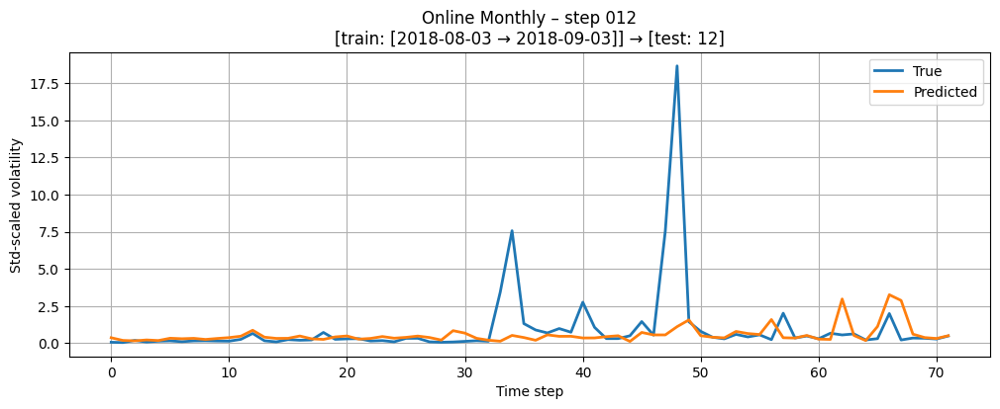

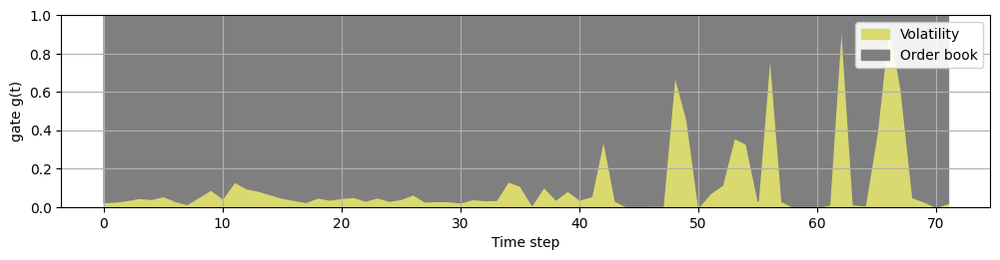

[online-monthly] Step 13: Train [2018-08-06 23:00:00 -> 2018-09-06 23:00:00], Test [2018-09-06 23:00:00 -> 2018-09-11 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-09 15:00:00 to 2018-09-06 23:00:00
Dataset created: 114 total points, 114 valid points after AR order 64
Target date range: 2018-09-07 00:00:00 to 2018-09-11 23:00:00
[online-monthly] step 013  RMSE=0.4898  MAE=0.2425
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 114 predictions from 2018-09-07 00:00:00 to 2018-09-11 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_13.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


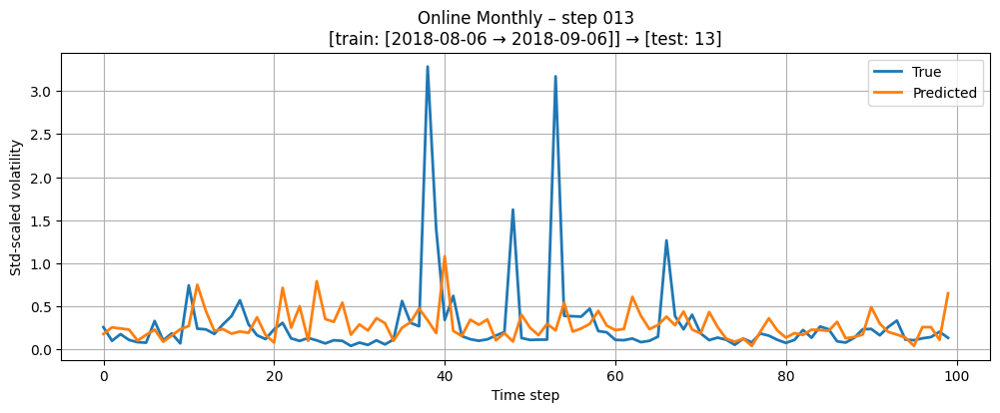

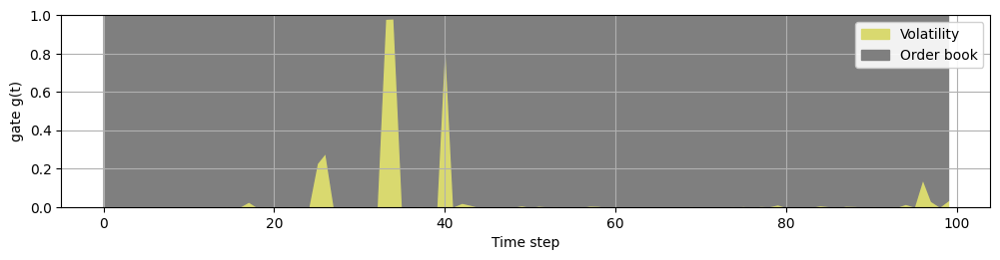

[online-monthly] Step 14: Train [2018-08-11 23:00:00 -> 2018-09-11 23:00:00], Test [2018-09-11 23:00:00 -> 2018-09-16 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-14 15:00:00 to 2018-09-11 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-09-12 00:00:00 to 2018-09-16 23:00:00
[online-monthly] step 014  RMSE=0.1973  MAE=0.1227
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 119 predictions from 2018-09-12 00:00:00 to 2018-09-16 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_14.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


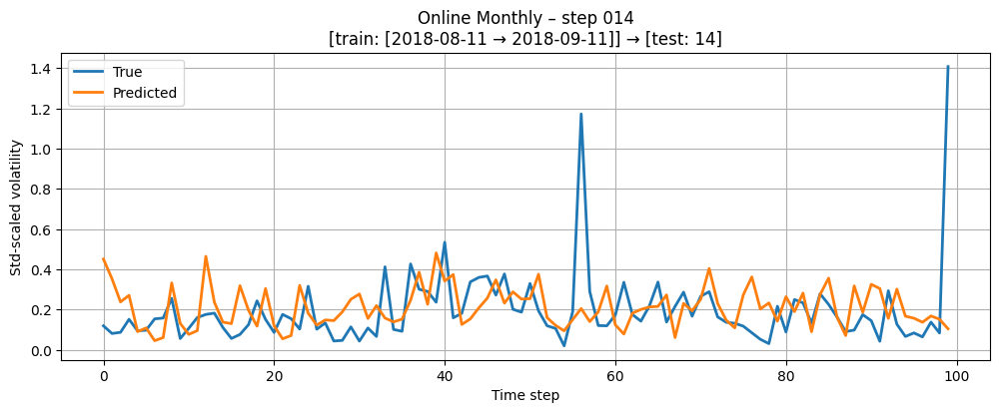

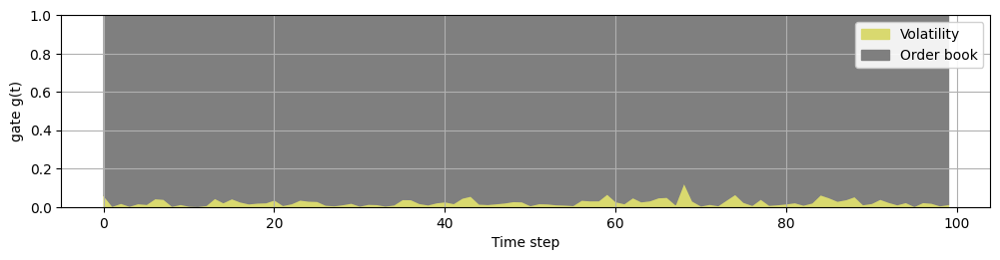

[online-monthly] Step 15: Train [2018-08-16 23:00:00 -> 2018-09-16 23:00:00], Test [2018-09-16 23:00:00 -> 2018-09-21 23:00:00]
Dataset created: 664 total points, 600 valid points after AR order 64
Target date range: 2018-08-19 16:00:00 to 2018-09-16 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-17 00:00:00 to 2018-09-21 23:00:00
[online-monthly] step 015  RMSE=0.5578  MAE=0.2507
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 120 predictions from 2018-09-17 00:00:00 to 2018-09-21 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_15.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


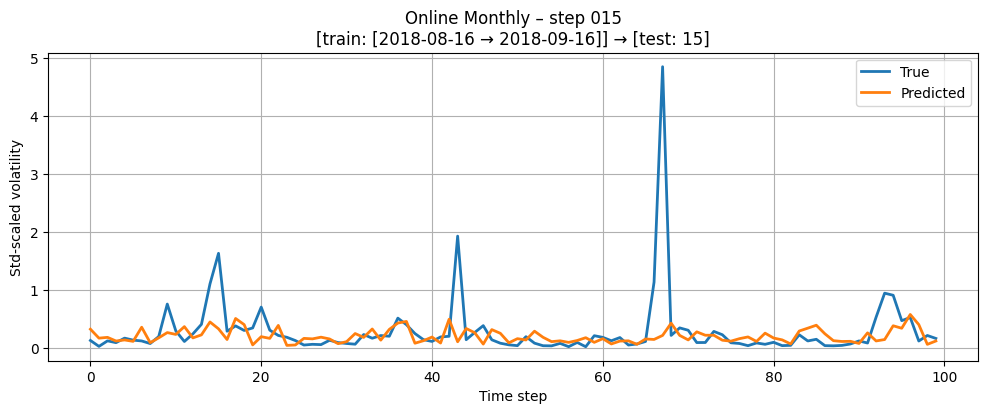

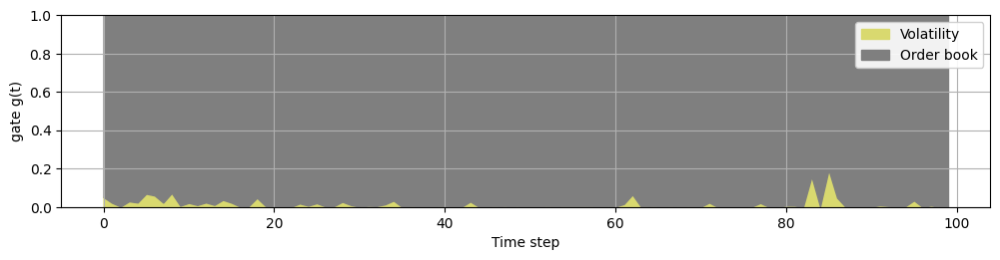

[online-monthly] Step 16: Train [2018-08-21 23:00:00 -> 2018-09-21 23:00:00], Test [2018-09-21 23:00:00 -> 2018-09-26 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-24 15:00:00 to 2018-09-21 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-22 00:00:00 to 2018-09-26 23:00:00
[online-monthly] step 016  RMSE=0.2081  MAE=0.1553
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 120 predictions from 2018-09-22 00:00:00 to 2018-09-26 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_16.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


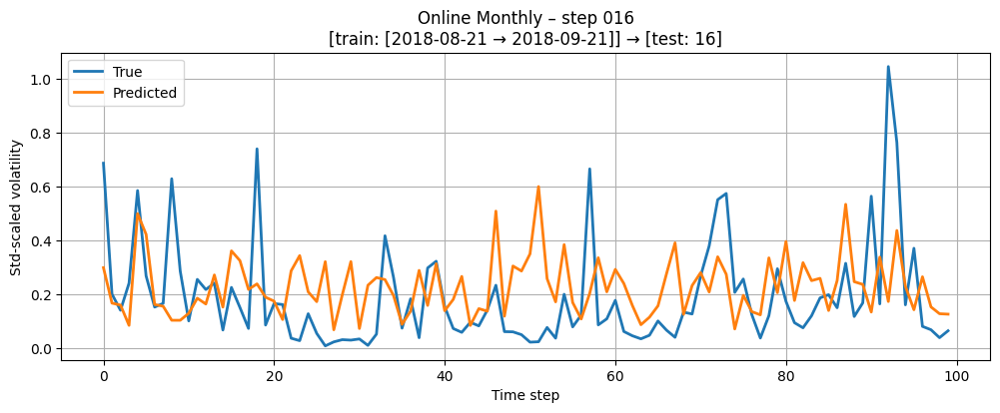

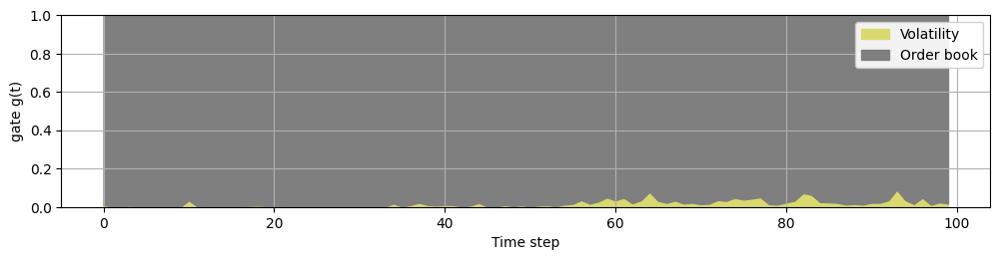

[online-monthly] Step 17: Train [2018-08-26 23:00:00 -> 2018-09-26 23:00:00], Test [2018-09-26 23:00:00 -> 2018-09-30 21:00:00]
Dataset created: 666 total points, 602 valid points after AR order 64
Target date range: 2018-08-29 15:00:00 to 2018-09-26 23:00:00
Dataset created: 93 total points, 93 valid points after AR order 64
Target date range: 2018-09-27 00:00:00 to 2018-09-30 21:00:00
[online-monthly] step 017  RMSE=0.3231  MAE=0.2205
Model saved to saved_models/online_monthly/hinge_weibull/model.pt
Saving 93 predictions from 2018-09-27 00:00:00 to 2018-09-30 21:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_weibull/residuals_step_17.csv
Predictions saved to saved_predictions/online_monthly/hinge_weibull/predictions.npy


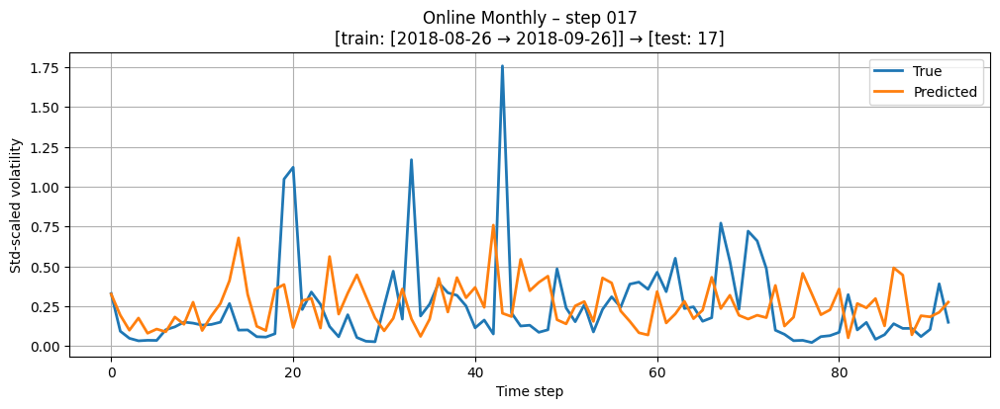

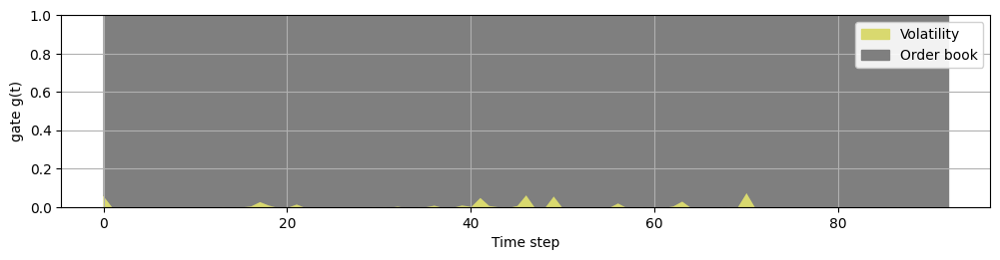

[online-monthly] finished 18 steps.

=== Training model: HINGE_INVERSE_GAUSSIAN ===

[online-monthly] Step 0: Train [2018-06-04 23:00:00 -> 2018-06-30 22:00:00], Test [2018-06-30 22:00:00 -> 2018-07-08 23:00:00]
Dataset created: 621 total points, 621 valid points after AR order 64
Target date range: 2018-06-04 23:00:00 to 2018-06-30 22:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-07-03 23:00:00 to 2018-07-08 23:00:00
[online-monthly] step 000  RMSE=0.6350  MAE=0.4503
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 120 predictions from 2018-07-03 23:00:00 to 2018-07-08 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_0.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


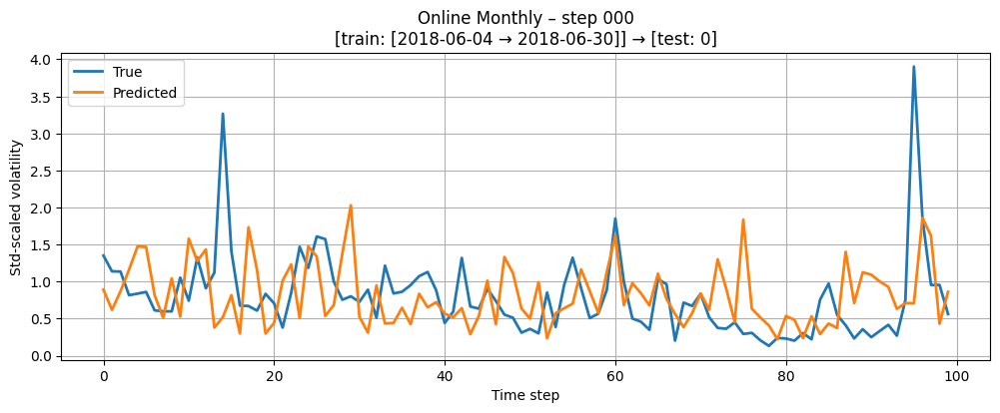

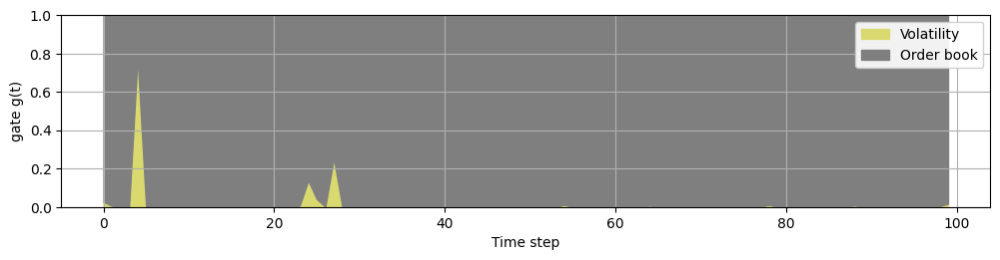

[online-monthly] Step 1: Train [2018-06-08 23:00:00 -> 2018-07-08 23:00:00], Test [2018-07-08 23:00:00 -> 2018-07-13 23:00:00]
Dataset created: 645 total points, 581 valid points after AR order 64
Target date range: 2018-06-11 17:00:00 to 2018-07-08 23:00:00
Dataset created: 117 total points, 117 valid points after AR order 64
Target date range: 2018-07-09 00:00:00 to 2018-07-13 23:00:00
[online-monthly] step 001  RMSE=0.5298  MAE=0.3395
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 117 predictions from 2018-07-09 00:00:00 to 2018-07-13 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_1.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


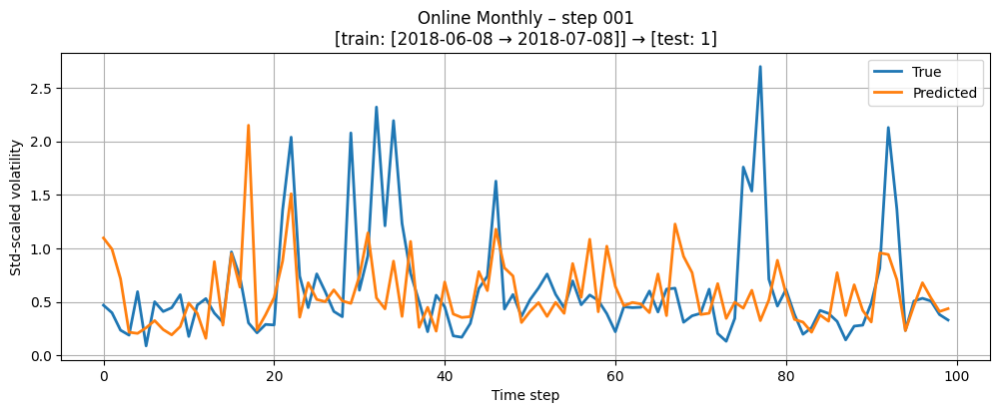

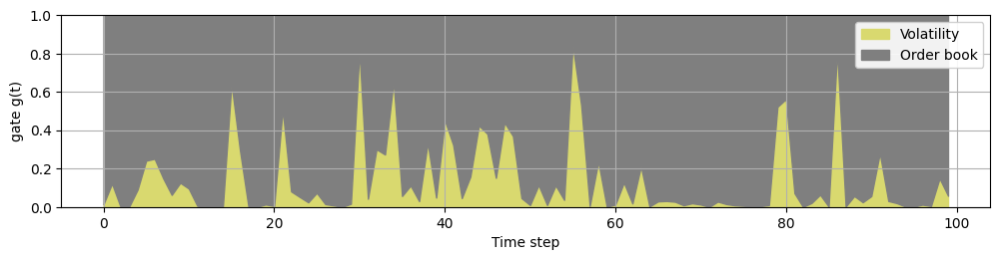

[online-monthly] Step 2: Train [2018-06-13 23:00:00 -> 2018-07-13 23:00:00], Test [2018-07-13 23:00:00 -> 2018-07-18 23:00:00]
Dataset created: 644 total points, 580 valid points after AR order 64
Target date range: 2018-06-16 15:00:00 to 2018-07-13 23:00:00
Dataset created: 103 total points, 103 valid points after AR order 64
Target date range: 2018-07-14 00:00:00 to 2018-07-18 23:00:00
[online-monthly] step 002  RMSE=3.3446  MAE=1.0476
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 103 predictions from 2018-07-14 00:00:00 to 2018-07-18 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_2.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


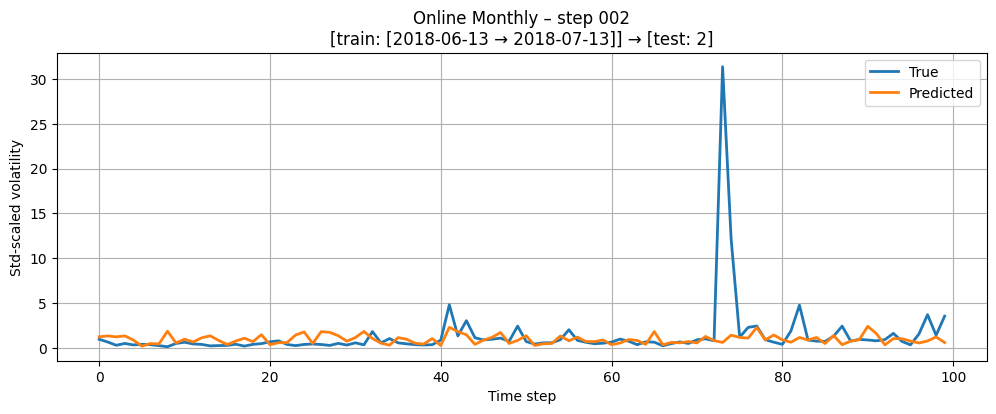

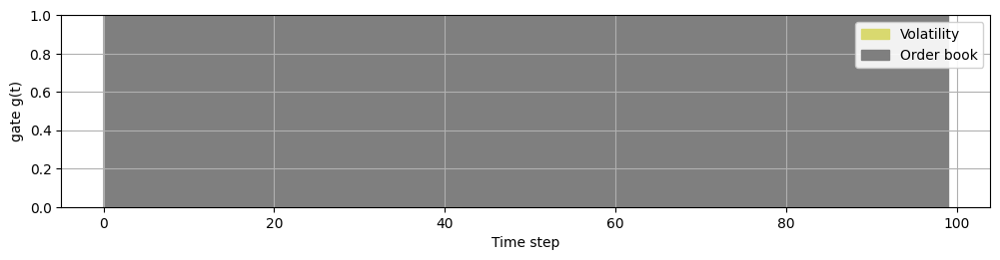

[online-monthly] Step 3: Train [2018-06-18 23:00:00 -> 2018-07-18 23:00:00], Test [2018-07-18 23:00:00 -> 2018-07-23 23:00:00]
Dataset created: 627 total points, 563 valid points after AR order 64
Target date range: 2018-06-21 15:00:00 to 2018-07-18 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-19 00:00:00 to 2018-07-23 23:00:00
[online-monthly] step 003  RMSE=0.6879  MAE=0.4536
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 119 predictions from 2018-07-19 00:00:00 to 2018-07-23 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_3.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


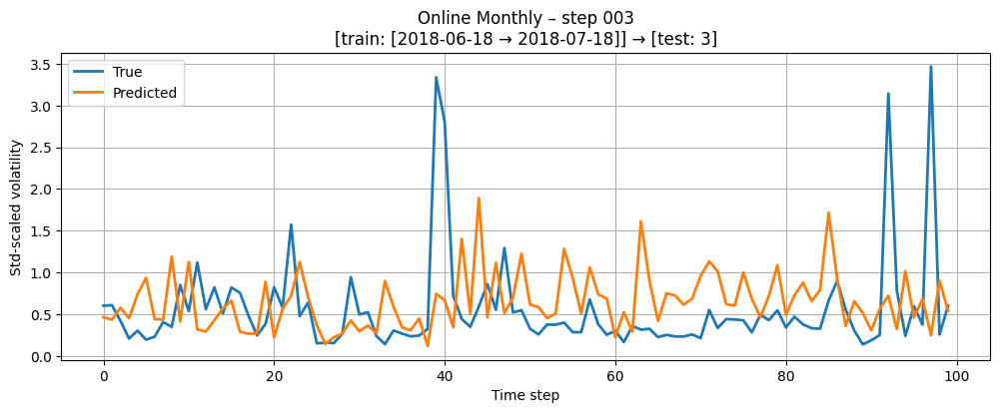

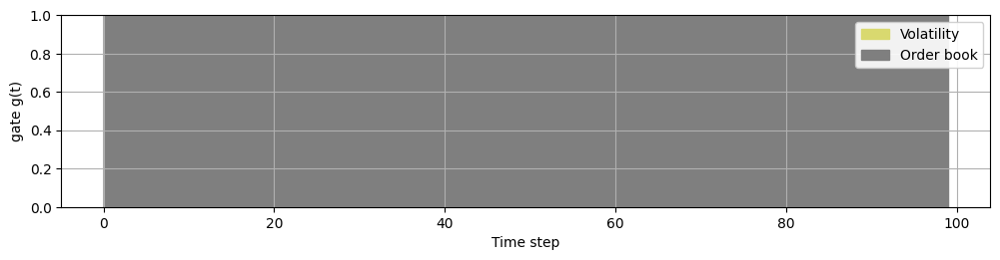

[online-monthly] Step 4: Train [2018-06-23 23:00:00 -> 2018-07-23 23:00:00], Test [2018-07-23 23:00:00 -> 2018-07-28 23:00:00]
Dataset created: 626 total points, 562 valid points after AR order 64
Target date range: 2018-06-26 15:00:00 to 2018-07-23 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-07-24 00:00:00 to 2018-07-28 23:00:00
[online-monthly] step 004  RMSE=0.6440  MAE=0.4415
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 119 predictions from 2018-07-24 00:00:00 to 2018-07-28 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_4.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


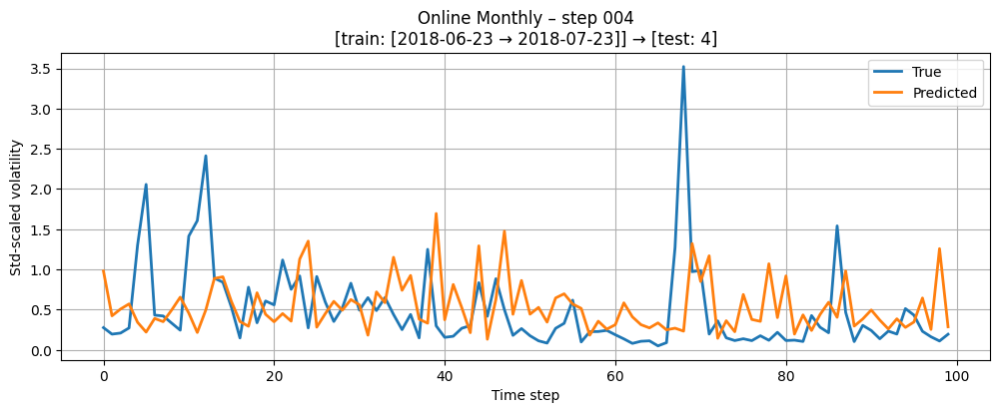

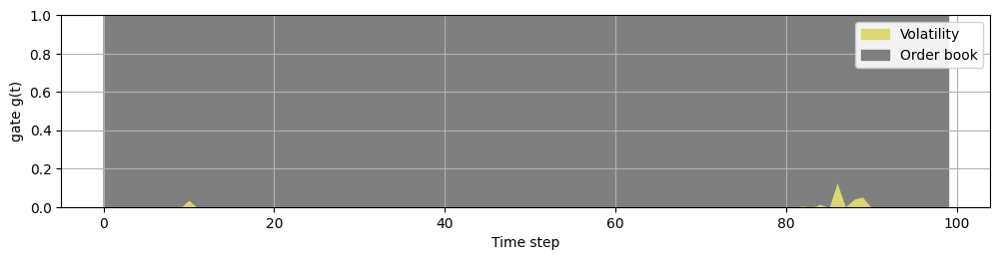

[online-monthly] Step 5: Train [2018-06-28 23:00:00 -> 2018-07-28 23:00:00], Test [2018-07-28 23:00:00 -> 2018-08-03 23:00:00]
Dataset created: 625 total points, 561 valid points after AR order 64
Target date range: 2018-07-04 16:00:00 to 2018-07-28 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-07-29 00:00:00 to 2018-08-03 23:00:00
[online-monthly] step 005  RMSE=0.4874  MAE=0.3377
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 72 predictions from 2018-07-29 00:00:00 to 2018-08-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_5.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


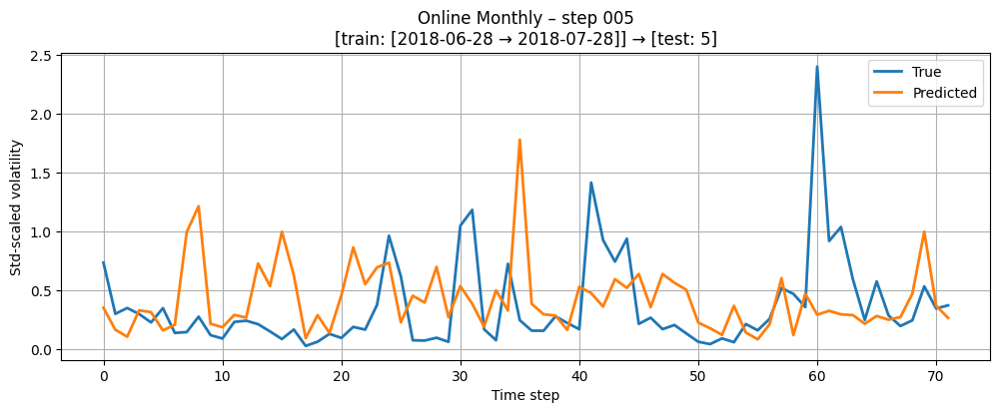

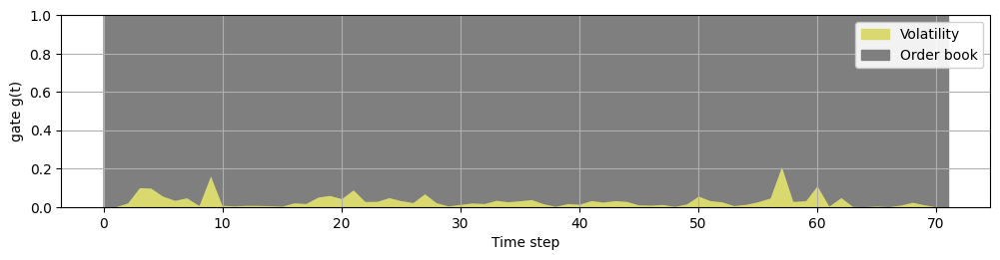

[online-monthly] Step 6: Train [2018-07-03 23:00:00 -> 2018-08-03 23:00:00], Test [2018-08-03 23:00:00 -> 2018-08-07 23:00:00]
Dataset created: 650 total points, 586 valid points after AR order 64
Target date range: 2018-07-06 16:00:00 to 2018-08-03 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-04 00:00:00 to 2018-08-07 23:00:00
[online-monthly] step 006  RMSE=0.6337  MAE=0.3702
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 96 predictions from 2018-08-04 00:00:00 to 2018-08-07 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_6.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


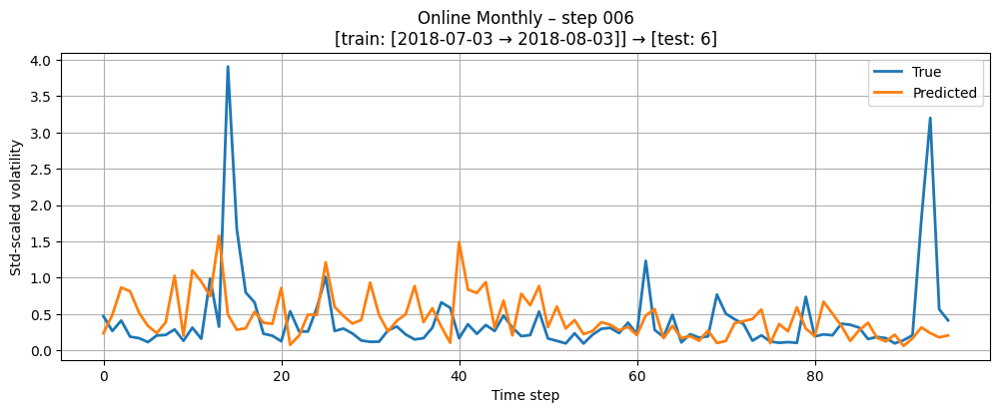

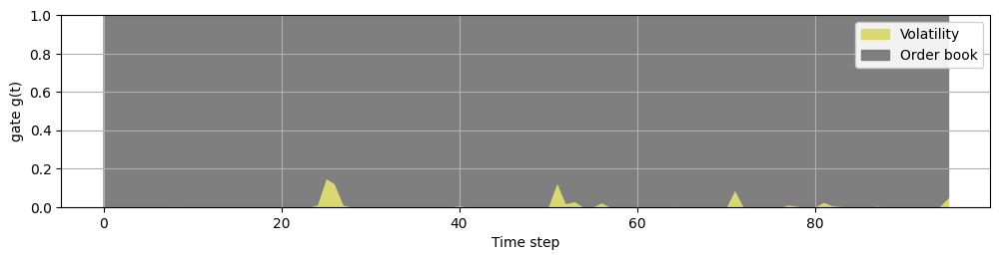

[online-monthly] Step 7: Train [2018-07-07 23:00:00 -> 2018-08-07 23:00:00], Test [2018-08-07 23:00:00 -> 2018-08-12 23:00:00]
Dataset created: 651 total points, 587 valid points after AR order 64
Target date range: 2018-07-10 16:00:00 to 2018-08-07 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-08 00:00:00 to 2018-08-12 23:00:00
[online-monthly] step 007  RMSE=1.4247  MAE=0.5968
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 120 predictions from 2018-08-08 00:00:00 to 2018-08-12 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_7.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


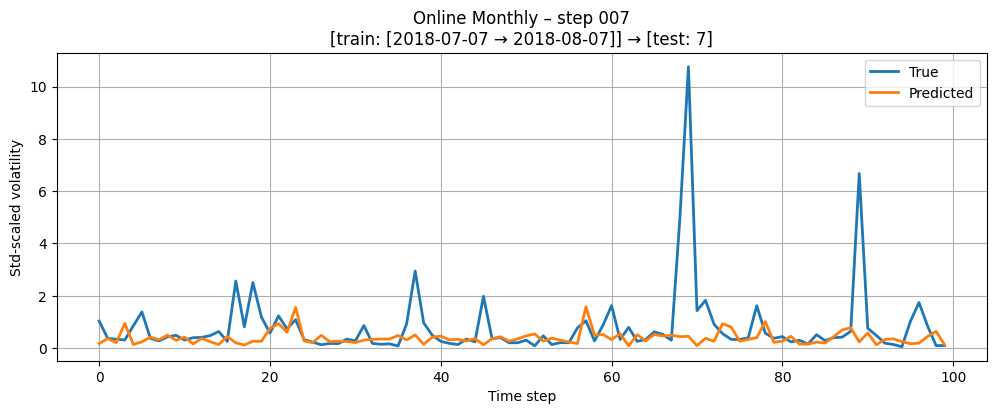

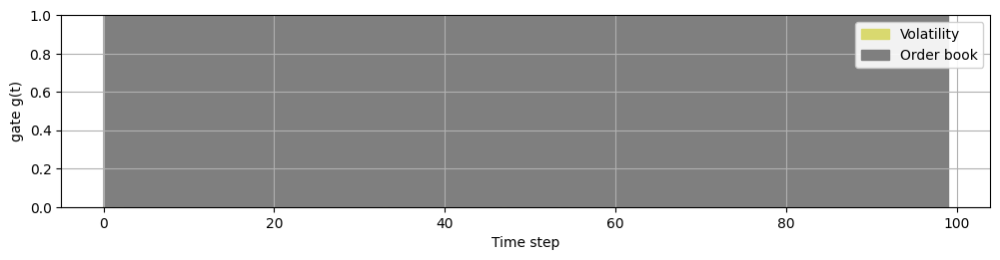

[online-monthly] Step 8: Train [2018-07-12 23:00:00 -> 2018-08-12 23:00:00], Test [2018-08-12 23:00:00 -> 2018-08-17 23:00:00]
Dataset created: 654 total points, 590 valid points after AR order 64
Target date range: 2018-07-15 15:00:00 to 2018-08-12 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-13 00:00:00 to 2018-08-17 23:00:00
[online-monthly] step 008  RMSE=0.4494  MAE=0.3330
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 119 predictions from 2018-08-13 00:00:00 to 2018-08-17 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_8.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


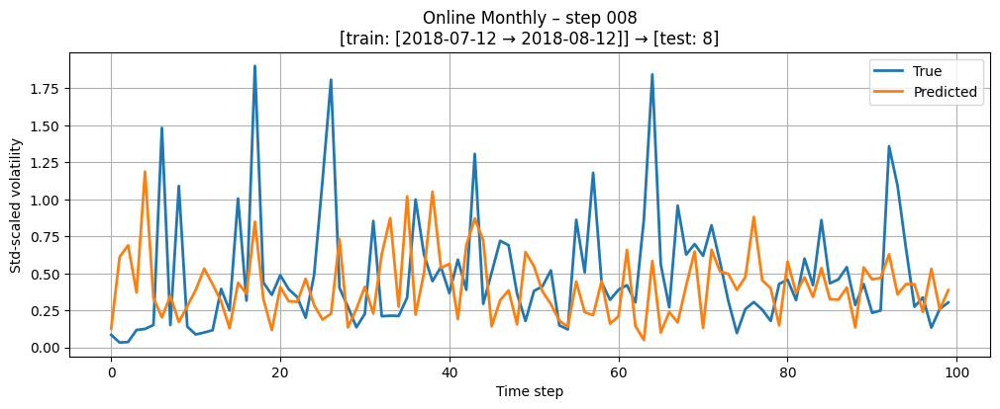

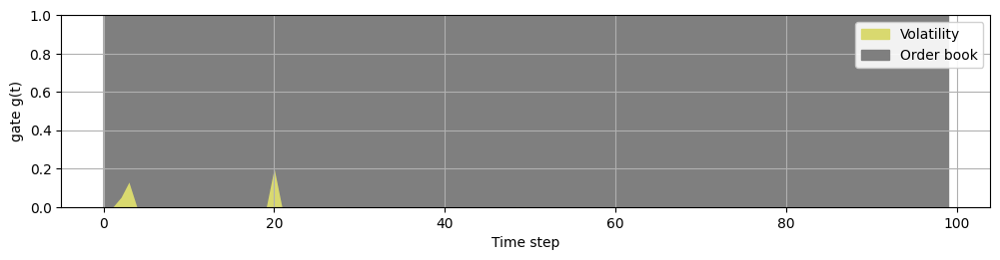

[online-monthly] Step 9: Train [2018-07-17 23:00:00 -> 2018-08-17 23:00:00], Test [2018-08-17 23:00:00 -> 2018-08-22 23:00:00]
Dataset created: 670 total points, 606 valid points after AR order 64
Target date range: 2018-07-20 16:00:00 to 2018-08-17 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-08-18 00:00:00 to 2018-08-22 23:00:00
[online-monthly] step 009  RMSE=2.1134  MAE=0.6479
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 120 predictions from 2018-08-18 00:00:00 to 2018-08-22 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_9.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


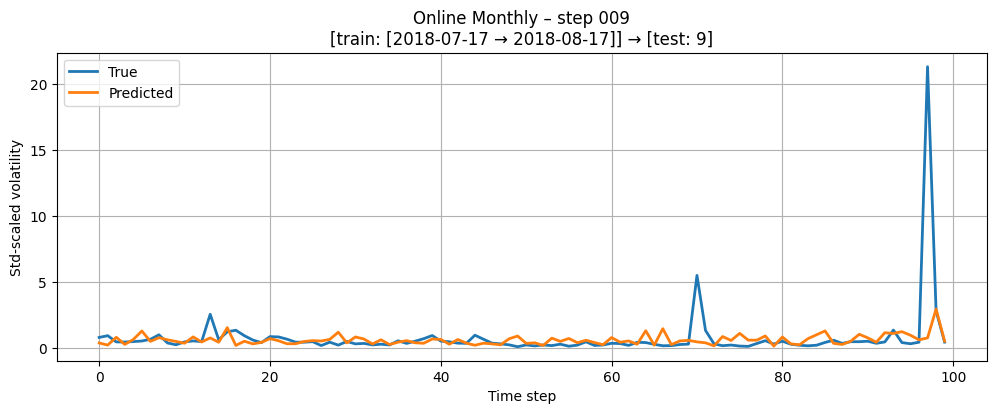

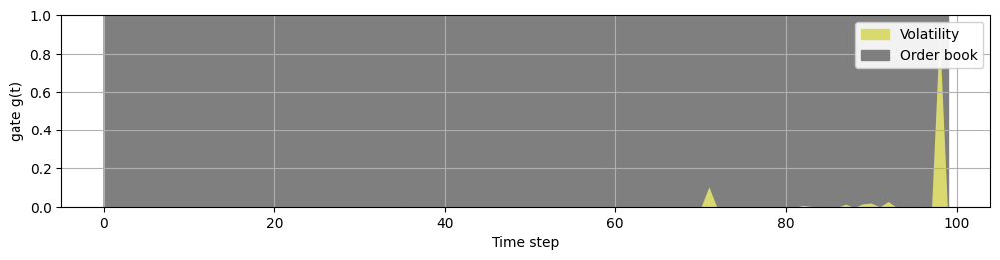

[online-monthly] Step 10: Train [2018-07-22 23:00:00 -> 2018-08-22 23:00:00], Test [2018-08-22 23:00:00 -> 2018-08-27 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-25 16:00:00 to 2018-08-22 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-08-23 00:00:00 to 2018-08-27 23:00:00
[online-monthly] step 010  RMSE=0.4823  MAE=0.2801
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 119 predictions from 2018-08-23 00:00:00 to 2018-08-27 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_10.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


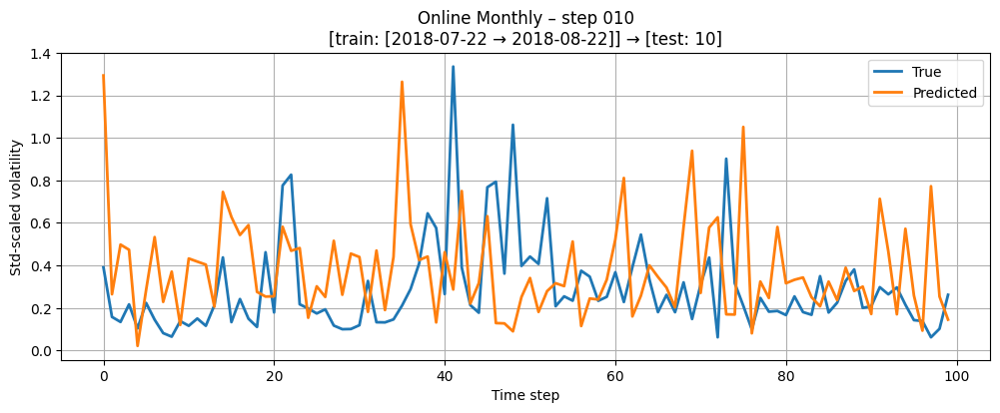

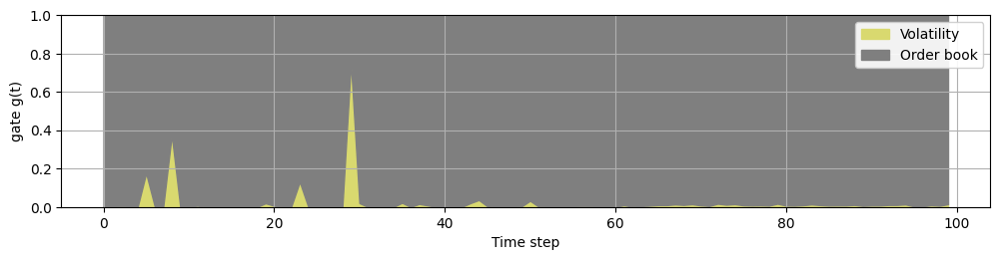

[online-monthly] Step 11: Train [2018-07-27 23:00:00 -> 2018-08-27 23:00:00], Test [2018-08-27 23:00:00 -> 2018-09-03 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-07-30 15:00:00 to 2018-08-27 23:00:00
Dataset created: 96 total points, 96 valid points after AR order 64
Target date range: 2018-08-28 00:00:00 to 2018-09-03 23:00:00
[online-monthly] step 011  RMSE=0.4703  MAE=0.3183
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 96 predictions from 2018-08-28 00:00:00 to 2018-09-03 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_11.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


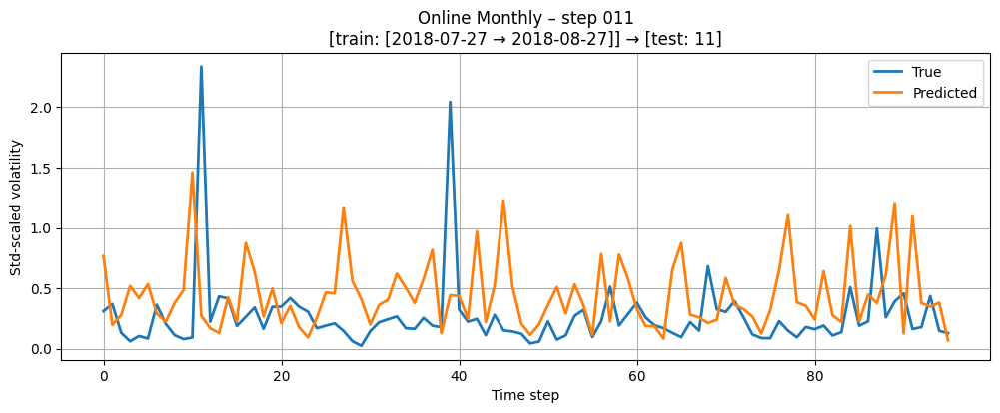

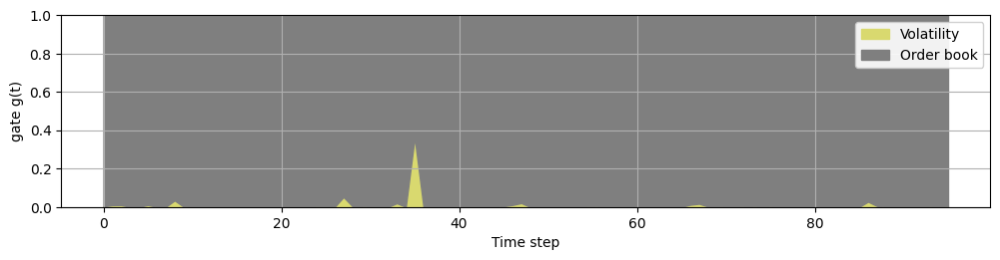

[online-monthly] Step 12: Train [2018-08-03 23:00:00 -> 2018-09-03 23:00:00], Test [2018-09-03 23:00:00 -> 2018-09-06 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-06 15:00:00 to 2018-09-03 23:00:00
Dataset created: 72 total points, 72 valid points after AR order 64
Target date range: 2018-09-04 00:00:00 to 2018-09-06 23:00:00
[online-monthly] step 012  RMSE=2.4551  MAE=0.8120
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 72 predictions from 2018-09-04 00:00:00 to 2018-09-06 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_12.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


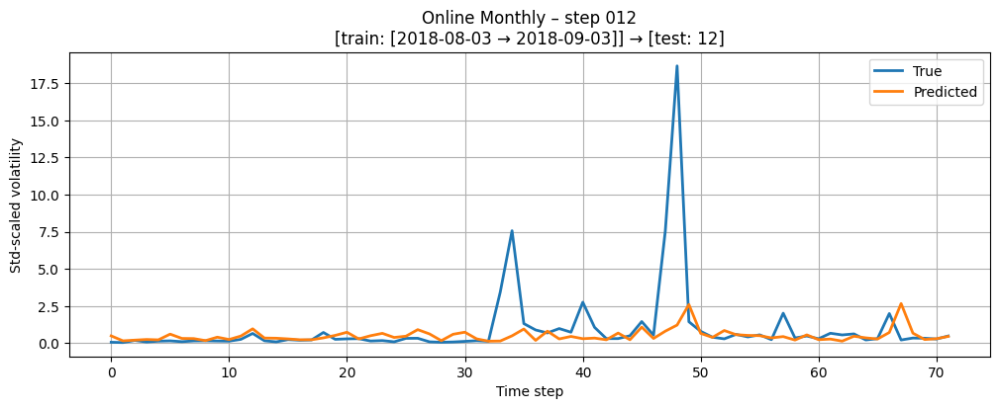

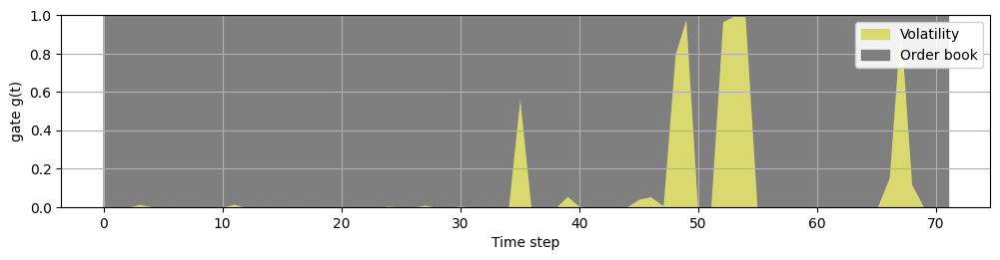

[online-monthly] Step 13: Train [2018-08-06 23:00:00 -> 2018-09-06 23:00:00], Test [2018-09-06 23:00:00 -> 2018-09-11 23:00:00]
Dataset created: 671 total points, 607 valid points after AR order 64
Target date range: 2018-08-09 15:00:00 to 2018-09-06 23:00:00
Dataset created: 114 total points, 114 valid points after AR order 64
Target date range: 2018-09-07 00:00:00 to 2018-09-11 23:00:00
[online-monthly] step 013  RMSE=0.5661  MAE=0.2994
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 114 predictions from 2018-09-07 00:00:00 to 2018-09-11 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_13.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


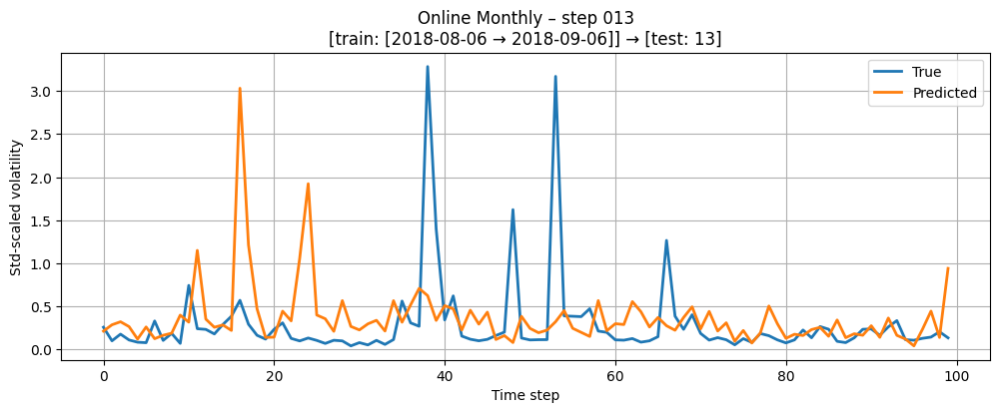

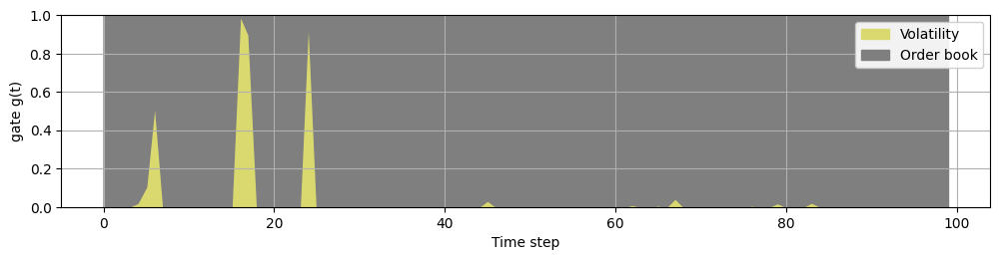

[online-monthly] Step 14: Train [2018-08-11 23:00:00 -> 2018-09-11 23:00:00], Test [2018-09-11 23:00:00 -> 2018-09-16 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-14 15:00:00 to 2018-09-11 23:00:00
Dataset created: 119 total points, 119 valid points after AR order 64
Target date range: 2018-09-12 00:00:00 to 2018-09-16 23:00:00
[online-monthly] step 014  RMSE=0.2305  MAE=0.1479
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 119 predictions from 2018-09-12 00:00:00 to 2018-09-16 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_14.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


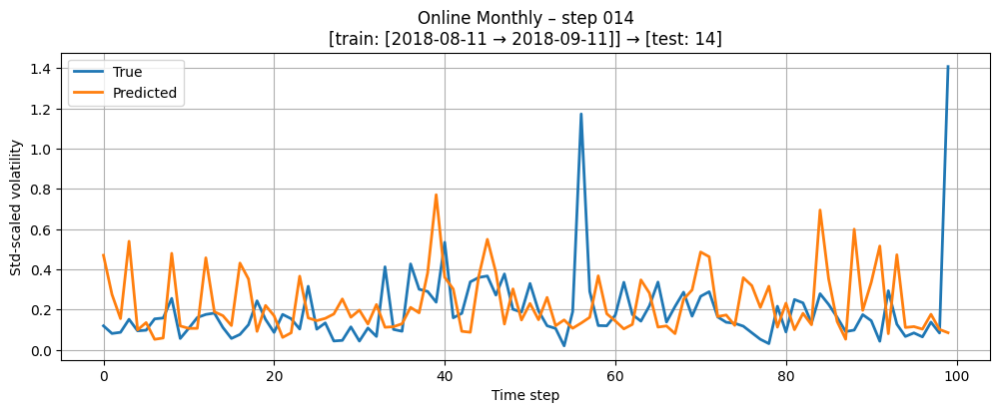

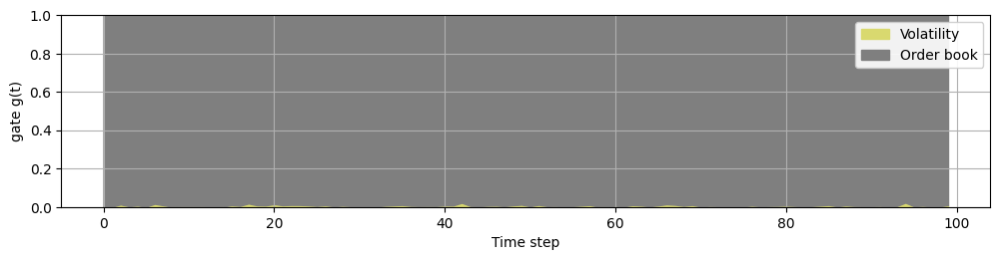

[online-monthly] Step 15: Train [2018-08-16 23:00:00 -> 2018-09-16 23:00:00], Test [2018-09-16 23:00:00 -> 2018-09-21 23:00:00]
Dataset created: 664 total points, 600 valid points after AR order 64
Target date range: 2018-08-19 16:00:00 to 2018-09-16 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-17 00:00:00 to 2018-09-21 23:00:00
[online-monthly] step 015  RMSE=0.5598  MAE=0.2574
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 120 predictions from 2018-09-17 00:00:00 to 2018-09-21 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_15.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


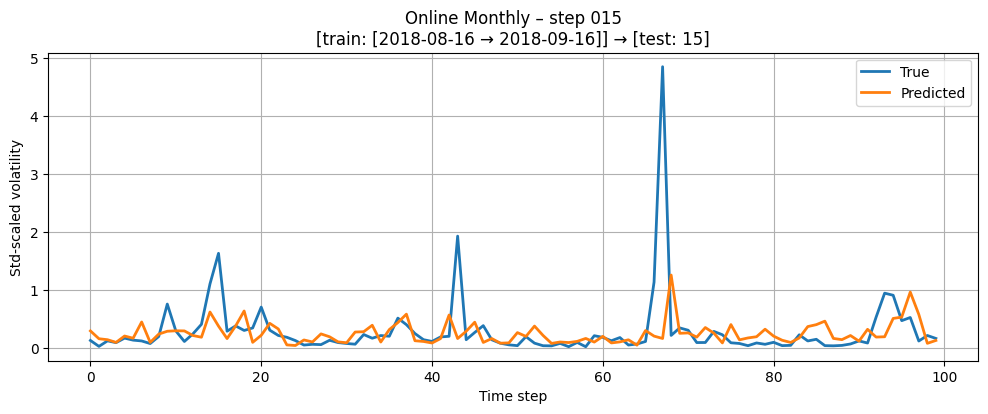

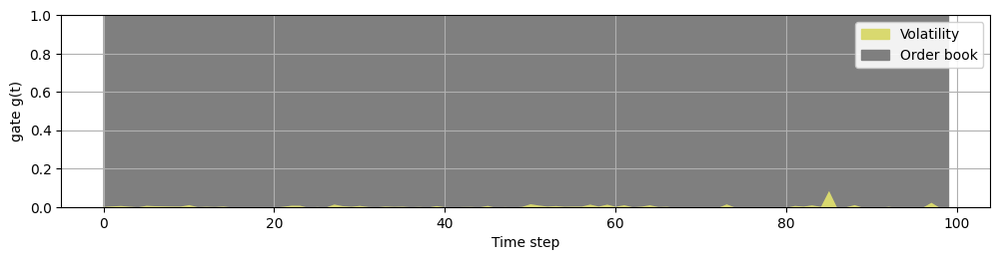

[online-monthly] Step 16: Train [2018-08-21 23:00:00 -> 2018-09-21 23:00:00], Test [2018-09-21 23:00:00 -> 2018-09-26 23:00:00]
Dataset created: 665 total points, 601 valid points after AR order 64
Target date range: 2018-08-24 15:00:00 to 2018-09-21 23:00:00
Dataset created: 120 total points, 120 valid points after AR order 64
Target date range: 2018-09-22 00:00:00 to 2018-09-26 23:00:00
[online-monthly] step 016  RMSE=0.2148  MAE=0.1644
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 120 predictions from 2018-09-22 00:00:00 to 2018-09-26 23:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_16.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


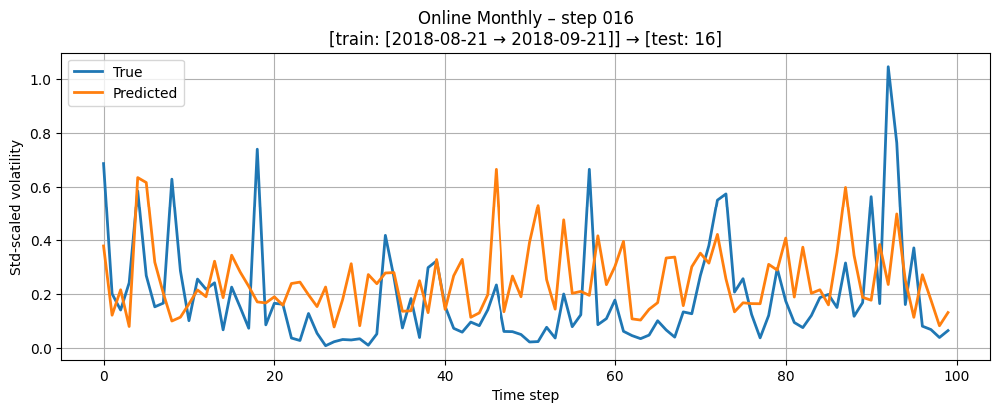

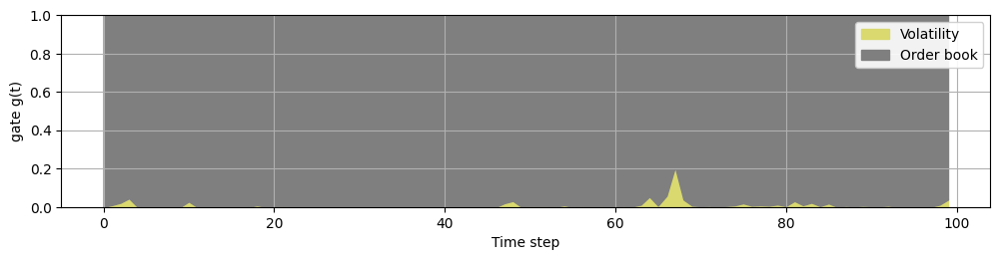

[online-monthly] Step 17: Train [2018-08-26 23:00:00 -> 2018-09-26 23:00:00], Test [2018-09-26 23:00:00 -> 2018-09-30 21:00:00]
Dataset created: 666 total points, 602 valid points after AR order 64
Target date range: 2018-08-29 15:00:00 to 2018-09-26 23:00:00
Dataset created: 93 total points, 93 valid points after AR order 64
Target date range: 2018-09-27 00:00:00 to 2018-09-30 21:00:00
[online-monthly] step 017  RMSE=0.3361  MAE=0.2452
Model saved to saved_models/online_monthly/hinge_inverse_gaussian/model.pt
Saving 93 predictions from 2018-09-27 00:00:00 to 2018-09-30 21:00:00
Residuals with dates saved to saved_residuals/online_monthly/hinge_inverse_gaussian/residuals_step_17.csv
Predictions saved to saved_predictions/online_monthly/hinge_inverse_gaussian/predictions.npy


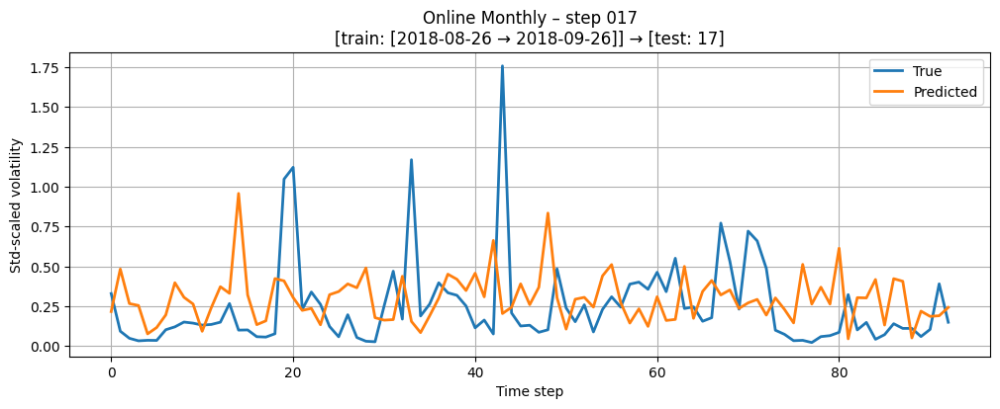

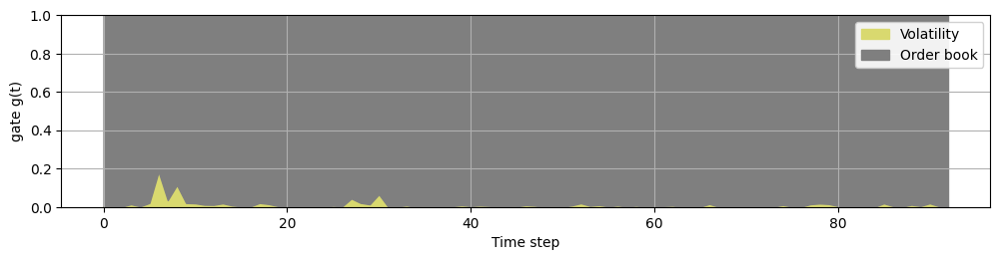

[online-monthly] finished 18 steps.


In [21]:
model_list = ["normal", "hinge", "lognormal", "inverse_gaussian", "weibull", "hinge_weibull", "hinge_inverse_gaussian"]
#model_list = ["normal", "hinge", "lognormal", "inverse_gaussian", "weibull", "hinge_weibull"]
all_results = {}
all_histories = {}
    
for model_name in model_list:
        print(f"\n=== Training model: {model_name.upper()} ===\n")
        result = results(csv_path="../../data/spx/btc-2/data_df.csv",
                        strategy="online_monthly",  # Use the new monthly strategy
                        model_type=model_name,
                        ar_order=64,
                        lb=120,
                        lr=0.001,
                        batch=32,
                        epochs=120,
                        penalty_coef=3.0,
                        delta=0.0,
                        kl_weight=0.01,
                        l2_coef=0.01,
                        eps=1e-8,
                        device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
                        return_history=True,
                        do_plot=True,
                        do_print=True)
        all_results[model_name] = result

In [22]:
all_histories = all_results
rmse_table  : dict[str, pd.Series] = {}
mae_table   : dict[str, pd.Series] = {}
sigma_table : dict[str, pd.Series] = {}

def _to_series(hist: list[dict], metric: str, default: float = float("nan")):
    """
    Convert a history list to a pandas Series keyed by interval / step.
    Falls back to RangeIndex if neither 'interval' nor 'step' exists.
    """
    if not hist:                              # empty list → empty Series
        return pd.Series(dtype=float)

    # detect the index key in the first record
    first = hist[0]
    if "interval" in first:
        idx_key = "interval"
    elif "step" in first:
        idx_key = "step"
    else:
        idx_key = None

    if idx_key:
        data = {rec[idx_key]: rec.get(metric, default) for rec in hist}
        return pd.Series(data, name=metric).sort_index()
    else:
        # Default sequential index
        data = [rec.get(metric, default) for rec in hist]
        return pd.Series(data, index=range(len(hist)), name=metric)


for model_name, hist in all_histories.items():
    rmse_table[model_name]  = _to_series(hist, "rmse")
    mae_table[model_name]   = _to_series(hist, "mae")
    sigma_table[model_name] = _to_series(hist, "sigma_vol", default=1.0)

# ----------------------------- align & reindex ------------------------------
rmse_df   = pd.DataFrame(rmse_table).T
mae_df    = pd.DataFrame(mae_table).T
sigma_df  = pd.DataFrame(sigma_table).T.fillna(1.0)   # missing sigmas → 1.0

# ensure identical column order across dfs
all_cols = sorted(set(rmse_df.columns) |
                  set(mae_df.columns)  |
                  set(sigma_df.columns))
rmse_df   = rmse_df.reindex(columns=all_cols)
mae_df    = mae_df.reindex(columns=all_cols)
sigma_df  = sigma_df.reindex(columns=all_cols).fillna(1.0)

# ----------------------------- unscale --------------------------------------
rmse_unscaled = rmse_df * sigma_df
mae_unscaled  = mae_df  * sigma_df

rmse_unscaled.loc["best"] = rmse_unscaled.idxmin(axis=0)
mae_unscaled.loc["best"]  = mae_unscaled.idxmin(axis=0)

combined = (
    pd.concat({"RMSE": rmse_unscaled, "MAE": mae_unscaled}, axis=1)
      .reorder_levels([0, 1], axis=1)
      .sort_index(axis=1, level=0)
)

display(combined)

MAE                                          \
                              0         1         2         3         4    
normal                   0.00007  0.000066  0.000148  0.000093  0.000077   
hinge                   0.000069  0.000068  0.000153  0.000096  0.000076   
lognormal               0.000094  0.000091  0.000191  2.455026   0.00009   
inverse_gaussian        0.000071  0.000075  0.000156  0.000103  0.000089   
weibull                 0.000079  0.000069  0.000253  2.266455  0.000102   
hinge_weibull           0.000093  0.000075  0.000179  0.000139  0.000103   
hinge_inverse_gaussian  0.000095  0.000072  0.000172  0.000121  0.000117   
best                       hinge    normal    normal    normal     hinge   

                                                              \
                              5         6                 7    
normal                  0.000055  0.000062          0.000161   
hinge                   0.000056  0.000083          0.000149   
lognormal               0.000084  0.000093          0.000174   
inverse_gaussian        0.000089  0.000092           0.00014   
weibull                 0.000083  0.000078          0.000148   
hinge_weibull           0.000071  0.000079          0.000149   
hinge_inverse_gaussian  0.000088  0.000091          0.000149   
best                      normal    normal  inverse_gaussian   

                                                         ...  \
                                      8              9   ...   
normal                          0.000085       0.000144  ...   
hinge                           0.000123       0.000137  ...   
lognormal                       0.000098       0.001292  ...   
inverse_gaussian                0.000077       0.000132  ...   
weibull                         0.000095        0.00014  ...   
hinge_weibull                   0.000088       0.000123  ...   
hinge_inverse_gaussian          0.000095       0.000123  ...   
best                    inverse_gaussian  hinge_weibull  ...   

                                    RMSE                          \
                                      8                       9    
normal                          0.000118                0.000415   
hinge                           0.000243                0.000413   
lognormal                       0.000128                0.012609   
inverse_gaussian                0.000108                 0.00041   
weibull                         0.000131                0.000469   
hinge_weibull                   0.000127                0.000407   
hinge_inverse_gaussian          0.000128                0.000402   
best                    inverse_gaussian  hinge_inverse_gaussian   

                                                                            \
                                            10        11                12   
normal                                 0.00013  0.000084          0.000595   
hinge                                 0.000128  0.000099          0.000601   
lognormal                                  inf  0.000137          0.004365   
inverse_gaussian                      0.000127  0.000089          0.000569   
weibull                               0.000145  0.000096          0.000574   
hinge_weibull                         0.000123  0.000097          0.000602   
hinge_inverse_gaussian                0.000118  0.000114          0.000593   
best                    hinge_inverse_gaussian    normal  inverse_gaussian   

                                                                        \
                                      13        14        15        16   
normal                          0.000187  0.000052  0.000152  0.000056   
hinge                           0.000186  0.000063  0.000159  0.000057   
lognormal                       0.001242  0.000084  0.000164   0.00007   
inverse_gaussian                0.000146  0.000055  0.000153   0.00006   
weibull                         0.000194  0.000062  0.000156  0.000061   
hinge_